In [1]:
import numpy as np
import pandas as pd
import datetime
import random
import pickle
import matplotlib.pyplot as plt
import time as tim
from IPython.display import clear_output
import copy

In [2]:
# 한시간 간격으로 전체 bss에서 호출 나머지는 1과 동일

In [3]:
# # 피클 저장, 로드
# # save
# with open('data.pickle', 'wb') as f:
#     pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)

# # load
# with open('data.pickle', 'rb') as f:
#     data = pickle.load(f)

In [4]:
day_n = 2

bike_n = 300
D_size = 42*bike_n*10
# D_terminal_size = 42*bike_n*10


qrate = 0.99
exploration_rate = 0.01
max_w_i = 1
beta = 0.4
beta_zero = 1

base_freq=[3,12,13,10,8,6,6,10,16,16,9,3] # 주문발생빈도 쌍봉형
day_avg = [60, 56, 52, 48, 44, 40, 35, 31, 27, 23] # 하루 평균 주문건수 n그룹
char_rule=[30, 24, 20, 15, 10] # 배터리 교환 규칙
# 10 25 50 85 100

fit_count=0

time_char_rule=[]

hochool_gijoon = 50 # 호출하는 바이크 배터리 기준
gaa = 0.4
order_limit_r=1500

bss_n = 30 # 고정
interval_sigma = 300 # 배달간격 표준편차 (초단위)
dist_sigma = 300 # 미터단위 배달거리의 표준편차
velo = 40000/3600 # 이륜차 평균속도
velo_sigma = 2 # 이륜차 속도의 표준편차
gene_hyper = 3100
bat_max_wh = 1850 # 배터리 1팩 기준 wh / 1 cycle => 247 감소
bat_max_dist = 35000 # 한 팩 당 총 이동거리
bat_somo = bat_max_wh/bat_max_dist
cycle_loss = 0.247
best_episode_reward=0
TD_error_list=np.array([])
TD_max=1
epsilon = 0.0001

delivery_reward = 10000
n_sample = 48

history = []
pred_ub = []
pred_lb = []

In [5]:
# from keras.callbacks import Callback
# class CustomHistory(Callback):
#     def init(self):
#         self.losses = []
#         self.vol_losses = []
#         self.accs = []
#         self.vol_accs = []        
        
#     def on_epoch_end(self, batch, logs={}):
#         self.losses.append(logs.get('loss'))
# #         self.vol_losses.append(logs.get('vol_loss'))
# #         self.accs.append(logs.get('acc'))
# #         self.vol_accs.append(logs.get('acc_loss'))

## MLP

## CNN

In [6]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv1D, Flatten, concatenate, Lambda, Add, Activation, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def resnet_block(input_tensor, filters, kernel_size=3, strides=1):
    x = Conv1D(filters, kernel_size, strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv1D(filters, kernel_size, strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    shortcut = Conv1D(filters, 1, strides=strides, padding='same')(input_tensor)
    shortcut = BatchNormalization()(shortcut)
    
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

# from tensorflow.python.framework.ops import disable_eager_execution
# disable_eager_execution()

def make_model():

    def custom_loss(y_true, y_pred):

        c = tf.math.multiply(y_pred, y_true)
        d = tf.math.square(c)
        out = tf.math.reduce_mean(d, axis=None)
        # out =  tf.math.square(tf.math.multiply(tf.math.add(y_pred, tf.math.negative(delta)), y_true))
        return out
    # 딥러닝 모델
    #         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)
    delta = Input(shape=(1,))
    mask = Input(shape=(2,))

    important_state = Input(shape=(34,),name='important_state')

    bss_state = Input(shape=(120,),name='bss_state')

    other_bike_state = Input(shape=(1,),name='other_bike_state')


    concatenated = concatenate([important_state,bss_state,other_bike_state])

    # concatenated = Lambda(lambda x: K.expand_dims(x,axis=2))(concatenated)
    concatenated = tf.keras.layers.Reshape((155, 1), input_shape = (155,))(concatenated)

    x = resnet_block(concatenated, filters=32, kernel_size=4, strides=1)
    x = resnet_block(x, filters=64, kernel_size=4, strides=1)
    x = resnet_block(x, filters=64, kernel_size=4, strides=1)
    x1 = Conv1D(filters=2,kernel_size=4, strides=1, activation = 'relu')(x)
    x1 = Flatten()(x1)
#         x = concatenate([x,important_state])

    x1 = Dense(50,activation='relu')(x1)
    x2 = Conv1D(filters=2,kernel_size=4, strides=1, activation = 'relu')(x)
    x2 = Flatten()(x2)
    x2 = Dense(50,activation='relu')(x2)

    advantage = Dense(2)(x1)
    value = Dense(1)(x2)

    policy = Lambda(lambda x: x[0]-K.mean(x[0],keepdims=True)+x[1])([advantage, value])
    policy = Lambda(lambda x: x[0]+x[1])([policy, mask])
    a = tf.math.negative(delta)
    b = tf.math.add(policy, a)


    model = Model([important_state,bss_state,other_bike_state, mask],[policy])
    train_model = Model([important_state,bss_state,other_bike_state,mask,delta],[b])
    train_model.compile(optimizer = Adam(learning_rate=0.00005), loss=[custom_loss])

    # # opti =  RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0)

    model.compile(optimizer='rmsprop',loss=['mse'])
    return model, train_model
model, train_model = make_model()
model2, train_model2 = make_model()

model.summary()

2024-07-18 16:54:41.565861: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-18 16:54:41.573367: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-07-18 16:54:41.573419: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-07-18 16:54:44.295079: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could not open file to read NUMA node: /sys/bus/pci/devices/0000:3b:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-18 16:54:44.295273: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 important_state (InputLayer)   [(None, 34)]         0           []                               
                                                                                                  
 bss_state (InputLayer)         [(None, 120)]        0           []                               
                                                                                                  
 other_bike_state (InputLayer)  [(None, 1)]          0           []                               
                                                                                                  
 concatenate (Concatenate)      (None, 155)          0           ['important_state[0][0]',        
                                                                  'bss_state[0][0]',          

In [7]:
from tensorflow.keras.models import load_model


def model_fit():
    global fit_count, model2, beta
#         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)

#     if fit_count%10000==0:
#         if fit_count < 1000000:
#             print('model updated')
#             model2.set_weights(model.get_weights())
#         if fit_count%100000==0:
#             with open('D_memory(230).pickle', 'wb') as f:
#                 pickle.dump(D_memory, f)
#             with open('D_terminal.pickle', 'wb') as f:
#                 pickle.dump(D_terminal, f)

#         print('model updated')
    global best_episode_reward
#         fit_count += 1
# #         model2 = load_model('best_model.h5')
# #         model2.compile(optimizer='rmsprop',loss=['mse'])
#         model2.set_weights(model.get_weights())
#         best_episode_reward=0
    if fit_count%8==0:
        if (len(D_memory)>1000):
            train_x = []
            train_y = []
            tmp1=[]
            tmp2=[]
            tmp3=[]
            temp=[]
            tmp_mask=[]
            delt=[]
            sample_weight=[]
            
            choices = random.choices(TD_index, weights = TD_error_list, k=n_sample)
            for choice in choices:
                # 비복원추출

                train=D_memory[choice]

                tmp1.append(train[0][0:34])
                tmp2.append(train[0][34:154])
                tmp3.append(train[0][154:155])
                mask = masking(train[0])
                tmp_mask.append(mask)



                tmp=[]
                tmp.append(np.array([train[3][0:34]]))
                tmp.append(np.array([train[3][34:154]]))
                tmp.append(np.array([train[3][154:155]]))
                
                mask = masking(train[3])

                tmp.append(np.array([mask]))
                
                
                
                with tf.device('/device:CPU:0'):
                    predicted1 = model2.predict_on_batch(tmp)[0][np.argmax(model.predict_on_batch(tmp).copy())]
#                 print(np.argmax(model.predict_on_batch(tmp).copy()))
                
                tmp_max = qrate*predicted1

                tmp=np.zeros(2)
                tmp[train[1]]=1.0

                temp.append(tmp)
                
                w_i = ((len(D_memory)*TD_error_list[choice]/np.sum(TD_error_list))**(-beta))/max_w_i
                
                sample_weight.append(w_i)
                
                delt.append((train[2] + tmp_max*(1-train[4])))
#                 print(train[1], delt[-1])
                
                
                
                tmp=[]
                tmp.append(np.array([train[0][0:34]]))
                tmp.append(np.array([train[0][34:154]]))
                tmp.append(np.array([train[0][154:155]]))
                mask = masking(train[0])
                tmp.append(np.array([mask]))
                with tf.device('/device:CPU:0'):
                    TD_error_list[choice] = np.abs(train[2] + tmp_max*(1-train[4])-model.predict_on_batch(tmp)[0][train[1]]) + epsilon
                
#             if len(D_terminal)>100:
#                 for i in range(15):

#                     train=D_terminal[random.randint(0,len(D_terminal)-1)]

#                     tmp1.append([train[0][0]])
#                     tmp2.append(train[0][1:3])
#                     tmp3.append([train[0][3]])
#                     tmp4.append(train[0][4:34])
#                     tmp5.append(train[0][34:124])


#                     tmp=[]
#                     tmp.append(np.array([[train[3][0]]]))
#                     tmp.append(np.array([train[3][1:3]]))
#                     tmp.append(np.array([[train[3][3]]]))
#                     tmp.append(np.array([train[3][4:34]]))
#                     tmp.append(np.array([train[3][34:124]]))
#                     predicted1 = model2.predict_on_batch(tmp).copy()
#                     tmp_max = qrate*np.max(predicted1)

#                     tmp=np.zeros(31)
#                     tmp[train[1]]=1.0

#                     temp.append(tmp)
#                     delt.append(train[2] + tmp_max*(1-train[4]))

# #                     tmp1,tmp2,tmp3,tmp4,tmp5 = copy.deepcopy(tmp1),copy.deepcopy(tmp2),copy.deepcopy(tmp3),copy.deepcopy(tmp4),copy.deepcopy(tmp5)
# #                     temp = copy.deepcopy(temp)

# #                 tmp1,tmp2,tmp3,tmp4,tmp5 = copy.deepcopy(tmp1),copy.deepcopy(tmp2),copy.deepcopy(tmp3),copy.deepcopy(tmp4),copy.deepcopy(tmp5)
# #                 temp = copy.deepcopy(temp)



            train_y=[np.array(temp)]
            train_x=[np.array(tmp1),np.array(tmp2),np.array(tmp3),np.array(tmp_mask),np.array(delt)]
            sample_weight = np.asarray(sample_weight)
            with tf.device('/device:CPU:0'):
                train_model.train_on_batch(train_x,train_y, sample_weight = sample_weight)
            
            beta = beta_zero + (1-beta_zero)*(fit_count/1000000)
            if beta > 1:
                beta = 1
#         elif len(D_sparse_order)<2:
#             D_sparse_order.append(D_often_order[0])

#     fit_count +=1


In [8]:
######### MLP
# import tensorflow as tf
# from keras import models, layers
# from keras.models import load_model
# # 딥러닝 모델
# model = models.Sequential()
# model.add(layers.Dense(214,activation='relu',input_shape=(214,)))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(100,activation='relu'))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(50,activation='relu'))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(31,activation='linear'))
# model.compile(optimizer = 'rmsprop', loss='mse', metrics=['mae','mse'])
# model.summary()

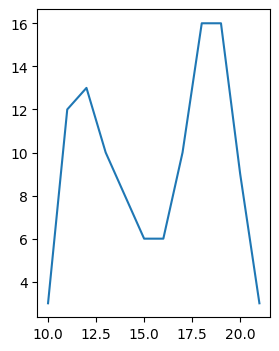

In [9]:
import matplotlib.pyplot as plt
#          10 11 12 13 14 15 16 17 18 19 20 21
# base_freq=[2, 10,13,12, 5, 2, 2,10,16,16,9, 3]
plt.figure(figsize=(3, 4))
plt.plot(range(10,22),base_freq)
plt.show()

In [10]:
def update_memory(s1,a,r,s2,time):
#     print(a, r, time)
    global fit_count, episode_reward, D_often, D_sparse, TD_error_list, TD_index, TD_max, terminal
    fit_count +=1
    if fit_count%10000==0:
        temp = []
        for i in range(len(initial_states)):
            tmp=[]
            tmp.append(np.array([initial_states[i][0:34]]))
            tmp.append(np.array([initial_states[i][34:154]]))
            tmp.append(np.array([initial_states[i][154:184]]))
            mask = masking(initial_states[i])
            tmp.append(np.array([mask]))
            with tf.device('/device:CPU:0'):
                predicted1 = model.predict_on_batch(tmp).copy()
            temp.append(np.max(predicted1))
        history.append(np.mean(temp))
        pred_ub.append(np.max(temp))
        pred_lb.append(np.min(temp))
        tmp_dic = {}
        tmp_dic['history'] = history
        tmp_dic['pred_ub'] = pred_ub
        tmp_dic['pred_lb'] = pred_lb
        with open('convergence_DCCDQN4EM_G(300).pickle', 'wb') as f:
            pickle.dump(tmp_dic, f)
        # plt.title('Average Q at Initial')
        plt.plot(np.arange(1,len(history)+1),history)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.ylabel('Average Q-value', fontsize=18)
        plt.xlabel('Learning steps ($\\times 10^6$)', fontsize=18)
        plt.fill_between(np.arange(1,len(history)+1),pred_ub, pred_lb, color = 'k', alpha = 0.1, label = 'Standard Deviation')
        plt.legend()
        plt.savefig('DCCDQN4EM_G.png', dpi=300)
        plt.show()
        if fit_count < 1000000:
            print('model updated')
            model2.set_weights(model.get_weights())
        if fit_count%100000==0:
            with open('D_memory(210).pickle', 'wb') as f:
                pickle.dump(D_memory, f)

    if tmp_terminal == False:

        r = r/(delivery_reward)
        episode_reward += r
            
        
        if time<=43200:

            D_memory.append([s1, a, r, s2,0])
            

        elif time>43200:
            D_memory.append([s1, a, r, s2,1])


        if len(D_memory)>D_size:
                D_memory.pop(0)


    elif tmp_terminal == True:

        r = r/(delivery_reward)
        episode_reward += r
        
        D_memory.append([s1, a, r, s2,1])


        if len(D_memory)>D_size:
                D_memory.pop(0)
                

    TD_error = TD_max
    if len(TD_error_list)<D_size:
        TD_index = np.arange(0,len(TD_error_list)+1)
    else:

        TD_error_list = np.delete(TD_error_list,0)
    TD_error_list = np.append(TD_error_list, TD_error)
        



In [11]:
# 일초기화에서 위치, status, bat, charge_num, order_freq, order_list, order

class Bike():
    def __init__(self):
        self.key=0
        self.cur_time = 0
        self.loc = (0,0)
        self.fu_loc = (0,0)
        self.ploc=(0,0)
        self.status = 'daegi'
        self.bat = [0,1]
        self.charge_count = 0
        self.order_freq = 2
        self.acc_dist=0
        self.order_list = []
        self.bss_list=[] # [충전소로 출발하는 시간, 충전소 도착할시간, 충전소index, 충전소로 출발할 때 오토바이 위치]
        self.order_count = 0
        self.charge_rule = 50
        self.sooneung = 100
        self.cur_state=[]
        self.action=0
        self.reward=0
        self.fu_state=np.ones(155)
        self.moving_queue_time = 0
        self.stay_queue_time = 0
        self.daegi = True
  
        self.history = [[self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count]] # 
        self.moving_queue = 0 # time
    def __lt__(self, other):
        return self.key < other.key
    
    def decide(self):
        
        self.ploc = self.loc
        global event_list, state, fubike_idx, exploration_rate
        event_list.pop(0)
        
        
#         현주문빈도(1), 다음주문빈도(1), 배터리(1), 시간(1), 충전소까지거리(30), 큐길이, 충전량(120), 타밬정보(1)
        cur_state=[]
        # 현재 시간 주문빈도
        if time < 43200:
            cur_state.append(base_freq[int(time/3600)]/16)
        else:
            cur_state.append(base_freq[-1]/16)
        # 다음 시간 주문 빈도
        if int(time/3600) >=11:
            cur_state.append(base_freq[-1]/16)
        # 일종료시점이면 현재시간으로
        else:
            cur_state.append(base_freq[int(time/3600)+1]/16)
        # 본인 배터리 용량
        cur_state.append(battery[self.bat[0]].soc/100)
        # 시간
        cur_state.append(time/43200)
        for i in range(len(bss)):
            # 각 bss 까지의 상대거리 (30)
            cur_state.append(distance(self.loc, bss[i].loc)/5000)


        # bss 정보(90)
        for i in range(len(bss)):
            # 충전소별 큐 길이 (30)
            cur_state.append(len(bss[i].queue)/3)
            # 충전소별 배터리 충전량 (높은 순)(90)
            tmp=[]
            for j in range(2,8,1):
                battery[bss[i].slot[j]].bat_charge()
            for j in range(2,8,2):
                tmp.append(battery[bss[i].slot[j]].soc)
            tmp = sorted(tmp,reverse = True)
            for j in range(len(tmp)):
                cur_state.append(tmp[j]/100)


        # 다른 바이크 정보 (배터리)(1)
        count=0
        for i in range(len(bike)):
            if battery[bike[i].bat[0]].soc < 50:
                count +=1
        cur_state.append(count)
        self.fu_state = copy.deepcopy(cur_state)
        if self.daegi ==False:
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, time)
        self.daegi = False
        
        self.reward = 0
        self.cur_state = copy.deepcopy(cur_state)

        model_fit()

        fubike_idx = self.key
        if exploration_rate < 0.01:
            exploration_rate = 0.01
        if random.randint(0,100)/100<1-exploration_rate:
            tmp=[]
            tmp.append(np.array([cur_state[0:34]]))
            tmp.append(np.array([cur_state[34:154]]))
            tmp.append(np.array([cur_state[154:155]]))
            mask = masking(cur_state)
            tmp.append(np.array([mask]))
            with tf.device('/device:CPU:0'):
                qvalue = model.predict_on_batch(tmp)
            action = np.argmax(qvalue)
#             print('action: ',action)
#             print(cur_state[34+action], cur_state[64+action*3:64+action*3+3])
#             print(mask)
#             print(qvalue)
        else:
            mask = masking(cur_state)
            aa=False
            count = 0
            while aa==False:
                count += 1
                action = random.randint(0,1)
                if mask[action]==0:
                    aa=True
                if count > 50:
                    aa=True
                    action = 1
#             print('action: ',action)
#             print(mask)
        self.action = action
        
        if time < 43200:
            if action==1:
                event_list.insert(0,[time, self, 'order_generate'])
            else:     
                # tmp: 가까운 순 정렬
                tmp = []
                for i in range(len(bss)):
                    tmp.append([distance(self.loc, bss[i].loc), i])
                tmp = sorted(tmp)

                action = len(bss)+1
                # 가까운 순 정렬된거로 for문 돌리면서, 교체가능 배터리 있으면 글루 ㄱㄱ, break
                k=0
                while action ==len(bss)+1:
                    for i in range(len(bss)):
                        idx = tmp[i][1]

                        tmp_bss=[]
                        for j in range(2,8,1):
                            battery[bss[idx].slot[j]].bat_charge()
                        for j in range(2,8,2):
                            tmp_bss.append(-battery[bss[idx].slot[j]].soc)
                        tmp_bss = sorted(tmp_bss)
                        if len(bss[idx].queue) < 3:
                            if -tmp_bss[len(bss[idx].queue)] > 95-k:
                                action = idx
    #                             print(1, action)
                                break
                    k+=1
                    if k > 50:
                        action = random.randint(0,29)
                event_list.insert(0,[time, self, 'go_bss',action])



        

        
        


            
    def order_generate(self):
        global event_list
#         self.status='daegi'
        time_dae = int(time/3600)
        if time > 43200:
            time_dae = 11
        interval = gene_hyper/self.order_freq[time_dae]
        gen_inter = np.random.normal(interval,interval_sigma)    
        while gen_inter < 0:
            gen_inter = np.random.normal(interval,interval_sigma)
        if time_dae != (time+gen_inter)//3600:
            if time_dae != 11:
                interval = gene_hyper/((self.order_freq[time_dae]+self.order_freq[time_dae+1])/2)
            gen_inter = np.random.normal(interval,interval_sigma)
            while gen_inter < 0:
                gen_inter = np.random.normal(interval,interval_sigma)
        max_dist = distance((0,0), self.loc)

        tt=False
        while tt==False:
            gen_dist = np.random.normal(2400,dist_sigma)
            while (gen_dist > 3465)|(gen_dist <max_dist):
                gen_dist = np.random.normal(2400,dist_sigma)

            food_list=[]
            for i in range(len(food_loc)):
                if distance(food_loc[i],self.loc) < gen_dist:
                    food_list.append(i)
            idx = food_list[np.random.randint(len(food_list))]
            
            x=np.random.random()
            theta = np.random.random()*2*np.pi
            r=gen_dist - distance(food_loc[idx],self.loc)
            house_loc = (food_loc[idx][0]+r*np.cos(theta), food_loc[idx][1]+r*np.sin(theta))

            tt=discri(house_loc)



        tmp_time = gen_inter + time
        self.fu_loc = food_loc[idx]
        event_list.pop(0)
        pickuptime = distance(food_loc[idx],self.loc)/velo
        if tmp_time < 43200:
            if tmp_time - pickuptime <time:
                self.status = 'pickup'
            else:
                for i in range(len(event_list)):
                    if event_list[i][0] > tmp_time-pickuptime:
                        event_list.insert(i,[tmp_time-pickuptime, self, 'change_status_pickup'])
                        break
                    elif i == len(event_list)-1 :
                        event_list.append([tmp_time-pickuptime, self, 'change_status_pickup'])


            for i in range(len(event_list)):
                if event_list[i][0] > tmp_time:
                    event_list.insert(i,[tmp_time, self, 'pickup'])
                    break
                if i == (len(event_list)-1):
                    event_list.append([tmp_time, self, 'pickup'])

            self.order_list.append([tmp_time, food_loc[idx], house_loc, self.loc])
        else:
#             self.terminal = True
            self.reward += delivery_reward
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)

        
    def pickup(self):
        global event_list
        order = self.order_list[len(self.order_list)-1]
        
        self.status='delivery'
        self.cur_time= time
        self.loc=order[1]
        self.acc_dist=self.acc_dist+ distance(order[3], order[1])
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
    #     self.soc=self.soc-(self.dist(self.order_list[3], self.order_list[1])/2*bat_somo/bat_max_dist
        tmp_velo = np.random.normal(velo,velo_sigma)
        while (tmp_velo > velo*1.2)|(tmp_velo <velo*0.8):
            tmp_velo = np.random.normal(velo,velo_sigma)
      
        tmp_time = time + distance(order[1],order[2])/tmp_velo
        self.fu_loc = order[2]
        event_list.pop(0)
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume()
        
        for i in range(len(event_list)):
            if event_list[i][0] > tmp_time:
                event_list.insert(i, [tmp_time, self, 'delivery'])
                break        
            if i == (len(event_list)-1):
                event_list.append([tmp_time, self, 'delivery'])   
    def change_status_pickup(self):
        self.status = 'pickup'
        event_list.pop(0)

        
    def delivery(self):
        global event_list
        
        self.ploc = self.loc
        order = self.order_list[len(self.order_list)-1]
        self.status='delivery'
        self.cur_time= time
        self.loc=order[2]
        self.order_count=self.order_count+1
        self.acc_dist=self.acc_dist+ distance(order[1], order[2])
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume()
        
#         self.reward += delivery_reward
        
        

        
#         print(round(time,1),round(battery[self.bat[0]].soc,1),round(battery[self.bat[1]].soc,1))
        if battery[self.bat[0]].soc < 0:
            global terminal, tmp_terminal
#             bike[self.bik].reward = bike[self.bik].reward -2000
            print('oring occured')
            print('day start to termianl : %.1f'%time)
            terminal = True
            tmp_terminal = True
             
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)
           
#         else:
#             update_memory(self.cur_state, self.action, self.reward, self.fu_state, time)
          

    
        
 

        event_list.pop(0)
        event_list.insert(0, [time, self, 'decide'])
 


    def go_bss(self,tmp_idx):
        global event_list
        if self.status=='queue':
            self.reward = self.reward-10000
        if len(bss[tmp_idx].queue)>=3:
            self.reward = self.reward-delivery_reward
        self.status='go_bss'

        tmp_velo = np.random.normal(velo,velo_sigma)
        while (tmp_velo > velo*1.2)|(tmp_velo <velo*0.8):
            tmp_velo = np.random.normal(velo,velo_sigma)

        tmp_dist = distance(bss[tmp_idx].loc, self.loc)
        tmp_time = time + tmp_dist/tmp_velo
        self.fu_loc = bss[tmp_idx].loc

        self.bss_list.append([time, tmp_time, tmp_idx, self.loc])



        if tmp_time <=43200: 
            if int(tmp_time/3600)==int(time/3600):
                self.reward = self.reward - (tmp_time-time)*base_freq[int(tmp_time/3600)]
            else:
                if tmp_time <=43200: 
                    self.reward = self.reward - (int(tmp_time/3600)*3600-time)*base_freq[int(time/3600)] - (tmp_time-int(tmp_time/3600)*3600)*base_freq[int(tmp_time/3600)]

        self.moving_queue_time += tmp_time-time
        event_list.pop(0)

        for i in range(len(event_list)):
            if event_list[i][0]>tmp_time:
                event_list.insert(i,[tmp_time, self, 'arrived_bss', tmp_idx])
                break
            elif i == len(event_list)-1 :
                event_list.append([tmp_time, self, 'arrived_bss', tmp_idx])
        bss[tmp_idx].queue.append([tmp_time,self.key])
#         bss[tmp_idx].queue = sorted(bss[tmp_idx].queue)

        
    def arrived_bss(self,tmp_idx):
        ######큐 추가#####
        global episode_reward, event_list
        
        
        
        self.status='queue'
        self.cur_time = time
        tmp_bss = self.bss_list[-1]
        
        
        self.acc_dist = self.acc_dist + distance(self.loc, bss[tmp_idx].loc)
        self.loc = bss[tmp_idx].loc
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
                    
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume() 

#         print(round(time,1),round(battery[self.bat[0]].soc,1),round(battery[self.bat[1]].soc,1))


#         cur_state=[]
#         cur_state.append(time/43200)
#         cur_state.append(self.loc[0]/3000)
#         cur_state.append(self.loc[1]/3000)
#         cur_state.append(battery[self.bat[0]].soc/100)
#         for i in range(len(bss)):
#             cur_state.append(len(bss[i].queue)/3)
#         for i in range(len(bss)):
#             for j in range(2,8,2):
#                 battery[bss[i].slot[j]].bat_charge()
#                 cur_state.append(battery[bss[i].slot[j]].soc/100)
#         self.fu_state = cur_state
#         self.fu_state = copy.deepcopy(state)
        if battery[self.bat[0]].soc < 0:
            global terminal, tmp_terminal
#             bike[self.bik].reward = bike[self.bik].reward -2000
            print('oring occured')
            print('day start to termianl : %.1f'%time)
            terminal = True
            tmp_terminal = True

             
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)
         

#         print(self.reward, battery[self.bat[0]].soc)
        
        
        
        event_list.pop(0)
        tmp=False
        for i in range(len(event_list)):
            if (event_list[i][1]== bss[tmp_idx])&(event_list[i][2]=='swap'):
                tmp=True
                break
        if tmp==False:    
            event_list.insert(0, [time+0.00001, bss[tmp_idx], 'swap'])
        
        bss[tmp_idx].count += 1



In [12]:
class Bss():
    def __init__(self):
        self.key=0
        self.queue = []
        self.loc = (0,0)
        self.slot = [None, None, 2,3,4,5,6,7]
        self.bss_history=[]
        self.min_his = []
        self.count=0
        
    def __lt__(self, other):
        return self.key < other.key
    
    def swap(self):
        global event_list
        
#         [status, time, bike[i] or bss[i], self.soc, charge_count]
        for i in range(6):
            idx = i+2
            bat_idx = self.slot[idx]
            battery[bat_idx].bat_charge()
            
#         if len(self.queue)>1: # 큐 이미 있으면 패스
#             event_list.pop(0)
#         else: #교환가능한거 있으면 교환, 없으면 대기
        tmp_soc = 10
        idx_list=[]
        if len(self.queue)<1:
            event_list.pop(0)
        elif self.queue[0][0]+0.0001>=time:
            event_list.pop(0)
            
            event_list.insert(0,[self.queue[0][0]+0.001, self, 'swap'])
            event_list = sorted(event_list)

        else:
            
            for i in range(6):
                idx = i+2
                if tmp_soc*0.99 <= battery[self.slot[idx]].soc:
                    tmp_soc = battery[self.slot[idx]].soc
                    idx_list.insert(0,idx)
                
            if tmp_soc >= 95:
                bike_idx = self.queue[0][1] # 바이크 인덱스
                idx_list# 배터리 슬롯 인덱스(앞에잇을수록 용량 많음)
                bike_bat = [bike[self.queue[0][1]].bat[0], bike[self.queue[0][1]].bat[1]]#넣은배터리index 2 리스트형
                bat_idx = [self.slot[idx_list[0]],self.slot[idx_list[1]]] # 뺀배터리 index 2 리스트형
                #히스토리업데이트
                #[bike index, bike 도착시간, bike나가는시간, 배터리슬롯index, 넣은배터리index, 뺀배터리index]
                self.bss_history.append([bike_idx, self.queue[0][0], time, [idx_list[0],idx_list[1]], bike_bat, bat_idx])
                #교환
#                 print(self.queue[0][0], time)
                arrived_time = self.queue[0][0]
                self.min_his.append([self.key, bike_idx,day, self.queue[0][0], time - self.queue[0][0]])


                if int((time+60)/3600) == int(arrived_time/3600):
                    if arrived_time > 43200:
                        bike[bike_idx].reward = delivery_reward
                    else:
                        bike[bike_idx].reward = bike[bike_idx].reward - ((time - arrived_time)+60)*base_freq[int((time+60)/3600)]
                else:
                    if time+60 <= 43200:
                        bike[bike_idx].reward = bike[bike_idx].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)] - (time+60 - int((time+60)/3600)*3600)*base_freq[int((time+60)/3600)]
                    else:
                        bike[bike_idx].reward = bike[bike_idx].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)-1] - (43200 - int((time+60)/3600)*3600)*base_freq[-1]

                
                bike[bike_idx].stay_queue_time += time - self.queue[0][0]

#                     global terminal, tmp_terminal
#                     tmp_terminal = True
                if time + 60 < 43200:
                    daegitime = time+60 - self.queue[0][0]
                else:
                    daegitime = 43200 - self.queue[0][0]
                if daegitime >3600:
                    global terminal
                    terminal = True
                    print('so long waited in ', self.key)
                    print('day start to termianl : %.1f'%time)

                self.slot[idx_list[0]]= bike_bat[0]
                self.slot[idx_list[1]]= bike_bat[1]
                
                bike[bike_idx].bat = bat_idx
                bike[bike_idx].charge_count += 1
                bike[bike_idx].history.append([bike[bike_idx].status, time, bike[bike_idx].loc, bike[bike_idx].acc_dist, bike[bike_idx].bat, bike[bike_idx].charge_count, bike[bike_idx].order_count])
                battery[bat_idx[0]].bik= bike_idx
                battery[bat_idx[0]].bss= None
                battery[bat_idx[0]].charge_count +=1 
                battery[bat_idx[1]].bik= bike_idx
                battery[bat_idx[1]].charge_count +=1
                battery[bat_idx[1]].bss= None
                battery[bat_idx[0]].status='on_bike'
                battery[bat_idx[0]].time = time
                battery[bat_idx[1]].time = time
                battery[bat_idx[1]].status='on_bike'
                battery[bat_idx[0]].bat_history.append([battery[bat_idx[0]].status, time, battery[bat_idx[0]].soc,battery[bat_idx[0]].bik,  battery[bat_idx[0]].charge_count])
                battery[bat_idx[1]].bat_history.append([battery[bat_idx[1]].status, time,battery[bat_idx[1]].soc, battery[bat_idx[1]].bik,  battery[bat_idx[1]].charge_count])

                battery[bike_bat[0]].bss = self.key
                battery[bike_bat[0]].status = 'charge'
                battery[bike_bat[0]].time = time
                battery[bike_bat[1]].time = time
                battery[bike_bat[1]].status = 'charge'
                battery[bike_bat[1]].bss = self.key
                battery[bike_bat[0]].bat_history.append([battery[bike_bat[0]].status, time, battery[bike_bat[0]].soc,battery[bike_bat[0]].bik,  battery[bike_bat[0]].charge_count])
                battery[bike_bat[1]].bat_history.append([battery[bike_bat[1]].status, time, battery[bike_bat[1]].soc,battery[bike_bat[1]].bik,  battery[bike_bat[1]].charge_count])


                event_list.pop(0)
                event_list.insert(0,[time+0.01, self, 'swap'])
                event_list.insert(0,[time+60, bike[bike_idx], 'decide'])
                event_list = sorted(event_list)
                self.queue.pop(0)
                if (daegitime >1800)|(time > 43200):
                    update_memory(bike[bike_idx].cur_state, bike[bike_idx].action, bike[bike_idx].reward, bike[bike_idx].fu_state, 50000)
                    bike[bike_idx].daegi = True
    

 

                
                

            else:

                tmp_time = time + (99.5-tmp_soc)*72
                event_list.pop(0)

    
                event_list.append([tmp_time, self, 'swap'])  
                event_list = sorted(event_list)



In [13]:
class Battery():
    
    def __init__(self):
        self.key=0
        self.so=100
        self.bat_acc=0
        self.status='charge' # 'charge'<100% / 'full'=100% / 'on_bike'
        self.soc=100 # float
        self.bik=0 # bike에 인덱싱
        self.bss=0 # bss에 인덱싱
        self.time=0
        self.cycle=0 # 방전횟수
        self.max_charge=100
        self.charge_count=0 # int
        self.bat_history=[['on_bike', 0, 100, 0, 0]] # [status, time, bike[i] or bss[i], self.soc, charge_count]
        
    def __lt__(self, other):
        return self.key < other.key
        
    def bat_consume(self):
        self.status = 'on_bike'
        global terminal

        loc0=bike[self.bik].history[-1][2]
        loc1=bike[self.bik].history[-2][2]
        self.so = self.so - distance(loc0, loc1)/2*bat_somo/bat_max_wh*100
        self.soc = self.so*100/self.max_charge
        self.bat_history.append([self.status, time,self.soc, self.bik, self.charge_count])
#         if (self.soc < 25)&(self.soc>0):
#             if (bike[self.bik].status=='daegi')|(bike[self.bik].status=='pickup')|(bike[self.bik].status=='delivery'):
#                 bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 20:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 15:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 12:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 9:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 6:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 3:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
            
            

        
        
        if self.soc < 0:
            bike[self.bik].reward = bike[self.bik].reward - (delivery_reward*3)
#             print('day start to termianl : %.1f'%time, end = ' ')
#             terminal = True
#             print('god', end='')
             
#             update_memory(bike[self.bik].cur_state, bike[self.bik].action, bike[self.bik].reward, bike[self.bik].cur_state, 1000000)

    
#             model_fit()

            
            


    def bat_charge(self):
        self.status='charge'
        if len(self.bat_history)!=0:


            self.bat_acc+=(time-self.bat_history[-1][1])/72
            self.cycle= self.bat_acc/100
#             self.max_charge=100-(cycle_loss*self.cycle)
            
            self.so = self.so + (time-self.bat_history[-1][1])/72
            if self.so > self.max_charge:
                self.so = self.max_charge
            self.soc = self.so*100/self.max_charge
            
            self.bat_history.append([self.status, time, self.soc, self.bik, self.charge_count])    


<function matplotlib.pyplot.show(close=None, block=None)>

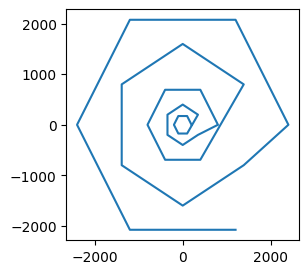

In [14]:
# 충전소 위치
bss_loc=[]
bss_r = [200,400,800,1600,2400]
for j in range(len(bss_r)): # 거리
    for i in range(6): # 각도
        if j%2==0:
            theta = np.pi*i/3
            bss_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
        if j%2==1:
            theta = np.pi*i/3 + np.pi/6
            bss_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.plot(df[0],df[1])
plt.show


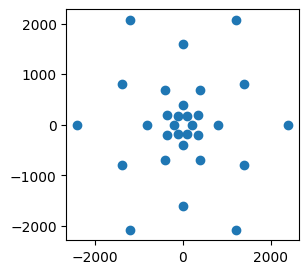

In [15]:
plt.figure(figsize=(3, 3))
plt.scatter(df[0],df[1])
plt.show()

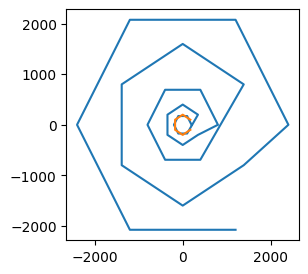

In [16]:
# # 음식점 위치 생성
# food_loc=[]
# n=30 # 음식점 개수
# r=1500
# #반지름 2km 원 위에 고르게 분포


# for i in range(n):
#     theta = 2*i*np.pi/n
#     food_loc.append((r*np.cos(theta), r*np.sin(theta)))
food_loc=[]
bss_r = [200]
for j in range(len(bss_r)): # 거리
    for i in range(6): # 각도
        if j%2==0:
            theta = np.pi*i/3+ np.pi/6
            food_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
        if j%2==1:
            theta = np.pi*i/3 
            food_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))

df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.plot(df[0],df[1])
df =pd.DataFrame(food_loc)
plt.plot(df[0],df[1])
plt.show()


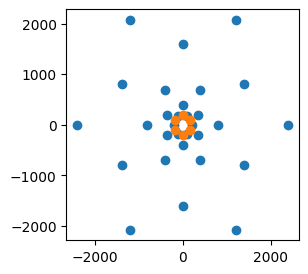

In [17]:
df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.scatter(df[0],df[1])
df =pd.DataFrame(food_loc)
plt.scatter(df[0],df[1])
plt.show()

In [18]:
# 육각형 안에 있는지 판별
def discri(a):
    x=a[0]
    y=a[1]
    if (x>=0)&(y>=0): # 1사분면
        tf = (x/np.sqrt(3)+y<3000) & (x<3000)
    elif (x<0)&(y>0): # 2사분면
        tf = (-x/np.sqrt(3)+y<3000) & (x>-3000)
    elif (x<=0)&(y<=0): # 3사분면
        tf = (x>-3000) & (x/np.sqrt(3)+y>-3000)
    elif (x>0)&(y<0):
        tf = (-x/np.sqrt(3)+y>-3000) & (x<3000)
    return tf

# (x,y) 거리 구하기
def distance(x1,x2):
    return np.sqrt((x1[0]-x2[0])**2+(x1[1]-x2[1])**2)
def masking(state):
    mask = np.zeros(2)
    # 오링안나기
    if state[2] < 0.12:
        mask[1] = -100
    # 50퍼 전에는 배달만
    if state[2] > 0.5:
        mask[0] = -100
    return mask

In [19]:
#일 종료

def end_day():
    global bike_df,day, bike, battery, bss, terminal
    day_acc_dist = []
    day_order_count = []
    day_charge_count = []
    for i in range(len(bike)):
        bike[i].cur_time=0
        bike_df[i].loc[day,'acc_dist'] = bike[i].acc_dist
        bike[i].acc_dist = 0
        bike_df[i].loc[day,'order_count'] = bike[i].order_count
        bike[i].order_count = 0
        bike_df[i].loc[day,'charge_count'] = bike[i].charge_count
        bike[i].charge_count = 0
        bike_df[i].loc[day,'total_queue_time'] = 0
        bike_df[i].loc[day,'moving_queue_time'] = 0
        bike_df[i].loc[day,'stay_queue_time'] = 0
        bike_df[i].loc[day,'queue_count'] = 0
        bike[i].bss_list = []
#         bike[i].reward=0
        bike[i].history = [[bike[i].status, 0, bike[i].loc, 0, bike[i].bat, 0, 0]]
        if len(bike[i].order_list)<2:
            bike[i].order_list = [[0,[0,0], [0,0], [0,0]],[0,[0,0], [0,0], [0,0]]]
        else:
            bike[i].order_list = [bike[i].order_list[-2],bike[i].order_list[-1]]
    idx = np.arange(0,len(bike))
    random.shuffle(idx)
    j=0
    for i in idx:
        bike[i].order_freq = freq[int(j)]
        j = j + len(freq)/len(bike)
    del idx    
#     soc_list=[]
    for i in range(len(battery)):
        battery[i].time=0
        if len(battery[i].bat_history)>0:
#             #[self.status, time,self.soc, self.bik, self.charge_count]
#             soc_list.append(battery[i].bat_history)
            battery[i].bat_history=[[0,0,0,0,0],battery[i].bat_history[-1]]
            battery[i].bat_history[-1][1] = 0
        battery[i].charge_count=0
#     soc_df.append(soc_list)  

        
    for i in range(len(bss)):
        if len(bss[i].bss_history)!=0:
            for j in range(len(bss[i].bss_history)):
                if (bss[i].bss_history[j][2] - bss[i].bss_history[j][1])>0:
                    
                    bike_df[bss[i].bss_history[j][0]].loc[day,'queue_count'] += 1
#                     bike_df[bss[i].bss_history[j][0]].loc[day,'queue_time'] += bss[i].bss_history[j][2] - bss[i].bss_history[j][1]
    min_his_list=[]
    for i in range(len(bss)):
#         if terminal ==False:
        if len(bss[i].queue)>0:
            for j in range(len(bss[i].queue)):
                if (bss[i].queue[j][0]<43200)&(bss[i].queue[j][0]<time):
                    bike_df[bss[i].queue[j][1]].loc[day,'charge_count'] += 1
                    bike_df[bss[i].queue[j][1]].loc[day,'queue_count'] += 1
#                     bike_df[bss[i].queue[j][1]].loc[day,'queue_time'] += time - bss[i].queue[j][0]
                    arrived_time = bss[i].queue[j][0]
                    if int((time+60)/3600) == int(arrived_time/3600):
                        if arrived_time < 43200:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - ((time - arrived_time)+60)*base_freq[int((time+60)/3600)]
                        else:
                            bike[bss[i].queue[j][1]].reward = 0
                    else:
                        if time+60 <= 43200:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)] - (time - int((time+60)/3600)*3600)*base_freq[int((time+60)/3600)]
                        else:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)-1] - (time - int((time+60)/3600)*3600)*base_freq[-1] 



                    bike[bss[i].queue[j][1]].stay_queue_time += time - bss[i].queue[j][0]

#                     cur_state=[]
#                     cur_state.append(0)
#                     cur_state.append(bike[bss[i].queue[j][1]].loc[0]/3000)
#                     cur_state.append(bike[bss[i].queue[j][1]].loc[1]/3000)
#                     cur_state.append(100/100)
#                     for k in range(len(bss)):
#                         cur_state.append(0)
#                     for k in range(len(bss)):
#                         for l in range(2,8,2):
#                             battery[bss[k].slot[l]].bat_charge()
#                             cur_state.append(100/100)
                    aa=False
                    if time> 43200:
                        aa = True
                    if time<43200:
                        if time - bss[i].queue[j][0] >3600:

                            aa = True
                            print('so long waited in ',bss[i].key)
                            print('day start to termianl : %.1f'%time)
                    else:
                        if 43200 - bss[i].queue[j][0] >3600:

                            aa = True
                            print('so long waited in ',bss[i].key)
                            print('day start to termianl : %.1f'%time)
                    if aa ==True:
                        update_memory(bike[bss[i].queue[j][1]].cur_state,bike[bss[i].queue[j][1]].action, bike[bss[i].queue[j][1]].reward, bike[bss[i].queue[j][1]].fu_state,50000)

                        model_fit()


                ##################################################################################
                    abc = battery[bike[bss[i].queue[j][1]].bat[0]].so
                    battery[bike[bss[i].queue[j][1]].bat[0]].so = battery[bike[bss[i].queue[j][1]].bat[0]].max_charge
                    battery[bike[bss[i].queue[j][1]].bat[0]].soc = 100

                    battery[bike[bss[i].queue[j][1]].bat[0]].bat_acc += battery[bike[bss[i].queue[j][1]].bat[0]].so-abc
                    battery[bike[bss[i].queue[j][1]].bat[0]].cycle= battery[bike[bss[i].queue[j][1]].bat[0]].bat_acc/100
#                     battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
                    battery[bike[bss[i].queue[j][1]].bat[0]].bat_history=[[0,0,0,0,0],[battery[bike[bss[i].queue[j][1]].bat[0]].status, 0, battery[bike[bss[i].queue[j][1]].bat[0]].soc, battery[bike[bss[i].queue[j][1]].bat[0]].bik, battery[bike[bss[i].queue[j][1]].bat[0]].charge_count]]

                    abc = battery[bike[bss[i].queue[j][1]].bat[1]].so
                    battery[bike[bss[i].queue[j][1]].bat[1]].so = battery[bike[bss[i].queue[j][1]].bat[1]].max_charge
                    battery[bike[bss[i].queue[j][1]].bat[1]].soc = 100

                    battery[bike[bss[i].queue[j][1]].bat[1]].bat_acc += battery[bike[bss[i].queue[j][1]].bat[1]].so-abc
                    battery[bike[bss[i].queue[j][1]].bat[1]].cycle= battery[bike[bss[i].queue[j][1]].bat[1]].bat_acc/100
#                     battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
                    battery[bike[bss[i].queue[j][1]].bat[1]].bat_history=[[0,0,0,0,0],[battery[bike[bss[i].queue[j][1]].bat[1]].status, 0, battery[bike[bss[i].queue[j][1]].bat[1]].soc, battery[bike[bss[i].queue[j][1]].bat[1]].bik, battery[bike[bss[i].queue[j][1]].bat[1]].charge_count]]
                ###############################################
        
    
        bss[i].bss_history = []
        min_his_list.append(bss[i].min_his)
        bss[i].min_his = []
    min_his_df.append(min_his_list)
    for i in range(len(bss)):
        bss[i].queue = []
    for i in range(len(bike)):
        bike_df[i].loc[day,'stay_queue_time'] = bike[i].stay_queue_time
        bike_df[i].loc[day,'moving_queue_time'] = bike[i].moving_queue_time
        bike_df[i].loc[day,'total_queue_time'] = bike[i].stay_queue_time + bike[i].moving_queue_time
        bike[i].stay_queue_time = 0
        bike[i].moving_queue_time = 0
    
    for i in range(len(bss)):
        for j in range(6):
            k = j+2
            abc = battery[bss[i].slot[k]].so
            
            battery[bss[i].slot[k]].so = battery[bss[i].slot[k]].max_charge
            battery[bss[i].slot[k]].soc = 100

            battery[bss[i].slot[k]].bat_acc += battery[bss[i].slot[k]].so-abc
            battery[bss[i].slot[k]].cycle= battery[bss[i].slot[k]].bat_acc/100
#             battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
            battery[bss[i].slot[k]].bat_history=[[0,0,0,0,0],[battery[bss[i].slot[k]].status, 0, battery[bss[i].slot[k]].soc, battery[bss[i].slot[k]].bik, battery[bss[i].slot[k]].charge_count]]
            
def end_bike_n():

    # 바이크 90대 생성, 주문건수 할당

    #객체 90대 생성
    global bike
    bike = {}
    for i in range(int(bike_n)):
        bike[i] = Bike()
        bike[i].key = i
        bike[i].loc = (4000*random.random()-2000,4000*random.random()-2000)
#         bike[i].sooneung = sooneung_avg

    #base_freq, day_avg 따라 발생빈도 할당
    global freq
    freq = []
    for i in range(len(day_avg)):
        tmp = []
        for j in range(len(base_freq)):
            tmp.append(base_freq[j]*day_avg[i]/sum(base_freq))
        freq.append(copy.deepcopy(tmp))

    idx = np.arange(0,len(bike))
    random.shuffle(idx)
    j=0
    for i in idx:
        bike[i].order_freq = freq[int(j)]
        j = j + len(freq)/len(bike)

        bike[i].bat=[i*2,i*2+1]

    
    for i in range(len(bike)):
        if i / len(bike)<0.1:
            bike[i].charge_rule = char_rule[0]
        elif i/len(bike)<0.25:
            bike[i].charge_rule = char_rule[1]
        elif i/len(bike)<0.5:
            bike[i].charge_rule = char_rule[2]
        elif i/len(bike)<0.85:
            bike[i].charge_rule = char_rule[3]
        else:
            bike[i].charge_rule = char_rule[4]
       


    global battery
    battery = {}
    for i in range(int(bike_n)*2+bss_n*6):
        battery[i]=Battery()
        battery[i].key=i
    for i in range(len(bike)):
        battery[i*2].bik = i
        battery[i*2+1].bik = i
        
    if popul%10 ==0:
        for i in range(int(bike_n)):
            tmp = 100*random.random()+10
            if tmp >100:
                tmp = 100
    #         tmp = (popul%10)*10+10
            battery[i*2].so = tmp
            battery[i*2+1].so = tmp
            battery[i*2].soc = tmp
            battery[i*2+1].soc = tmp
    else:
        for i in range(20):
            battery[i*2].so = 10
            battery[i*2+1].so = 10
            battery[i*2].soc = 10
            battery[i*2+1].soc = 10
        for i in range(20,40):
            battery[i*2].so = 20
            battery[i*2+1].so = 20
            battery[i*2].soc = 20
            battery[i*2+1].soc = 20
        for i in range(40,60):
            battery[i*2].so = 30
            battery[i*2+1].so = 30
            battery[i*2].soc = 30
            battery[i*2+1].soc = 30
    
    #충전소 생성, 위치할당
    global bss
    bss = {}
    for i in range(bss_n):
        bss[i] = Bss()
        bss[i].key = i
        bss[i].slot[2] = i*6 + (2*len(bike))
        bss[i].slot[3] = i*6+1+ (2*len(bike))
        bss[i].slot[4] = i*6+2+ (2*len(bike))
        bss[i].slot[5] = i*6+3+ (2*len(bike))
        bss[i].slot[6] = i*6+4+ (2*len(bike))
        bss[i].slot[7] = i*6+5+ (2*len(bike))
        bss[i].loc = bss_loc[i]  

## 처음 돌리기

In [20]:
with tf.device('/device:CPU:0'):
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model2.set_weights(model.get_weights())

In [21]:
event_list=[]
state = []
fubike_idx=0
D_memory=[]
# D_terminal=[]

In [22]:
# from keras.models import load_model

# model.load_weights('best_model(210)(w).h5')
# model2.set_weights(model.get_weights())

with open('initial_states.pickle', 'rb') as f:
    initial_states = pickle.load(f)

# with open('D_memory(210).pickle', 'rb') as f:
#     D_memory = pickle.load(f)

# tmp1=[]
# tmp2=[]
# tmp3=[]
# temp=[]
# delt=[]
# mask1=[]
# for i in range(len(D_memory)):
#     train = D_memory[i]
    
#     tmp1.append(train[0][0:34])
#     tmp2.append(train[0][34:154])
#     tmp3.append(train[0][154:254])
#     mask1.append([masking(train[0])])


#     tmp=[]
#     tmp.append(np.array([train[3][0:34]]))
#     tmp.append(np.array([train[3][34:154]]))
#     tmp.append(np.array([train[3][154:254]]))
#     mask = masking(train[3])
#     tmp.append(np.array([mask]))


#     predicted1 = model2.predict_on_batch(tmp)[0][np.argmax(model.predict_on_batch(tmp).copy())]

#     tmp_max = qrate*predicted1

#     tmp=np.zeros(2)
#     tmp[train[1]]=1.0

#     temp.append(tmp)
#     delt.append(train[2] + tmp_max*(1-train[4]))



#     tmp=[]
#     tmp.append(np.array([train[0][0:34]]))
#     tmp.append(np.array([train[0][34:154]]))
#     tmp.append(np.array([train[0][154:254]]))
#     mask = masking(train[0])
#     tmp.append(np.array([mask]))

                
#     TD_error_list = np.append(TD_error_list,np.abs(delt[-1]-model.predict_on_batch(tmp)[0][train[1]])+TD_max/D_size)

# TD_index = np.arange(0,len(TD_error_list))

# TD_max = np.max(TD_error_list[:int(len(TD_error_list))])
# max_w_i = (len(D_memory)*TD_max/np.sum(TD_error_list))**(-beta)


# # with open('D_terminal.pickle', 'rb') as f:
# #     D_terminal = pickle.load(f)

In [23]:
model2.set_weights(model.get_weights())


episode 0
day : 0
so long waited in  14
day start to termianl : 3693.5

 time for simulate one day : 26.3
so long waited in  9
day start to termianl : 3693.5
so long waited in  20
day start to termianl : 3693.5
so long waited in  25
day start to termianl : 3693.5

average moving queuetime :  95.7 40.8
average stay queuetime :  710.8 303.3
average total queuetime :  806.5 344.1
average chargecount :  0.4 0.4
average ordercount :  1.4 1.4
[91, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  0.23375195812958355
code start to now : 27.4
episode_reward :  -12.731568564290125
fit_count :  514
TD max = 1.0 TD min = 1.0

episode 1
day : 0


2024-07-18 16:56:08.168670: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 16:57:56.191200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 17:05:27.601942: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 17:09:31.283248: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 17:56:30.683774: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


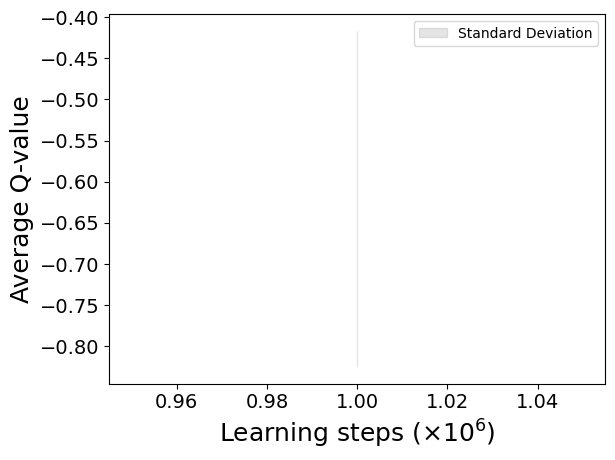

model updated


2024-07-18 18:32:24.614595: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 18:33:04.381158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6336.4

average moving queuetime :  97.7 150.4
average stay queuetime :  530.0 816.2
average total queuetime :  627.7 966.7
average chargecount :  1.5 1.5
average ordercount :  41.0 41.0
day : 1


2024-07-18 19:07:49.171149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


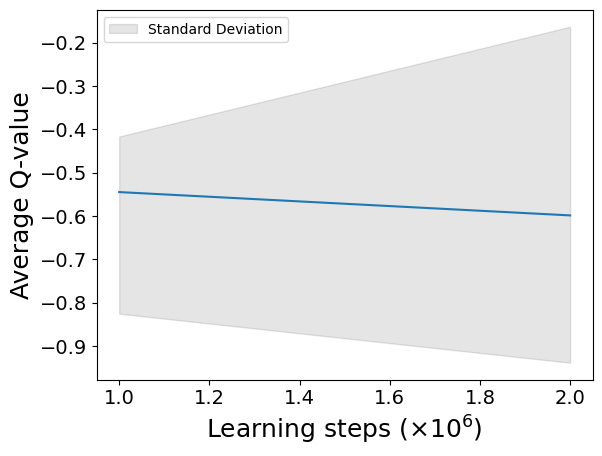

model updated


2024-07-18 19:38:42.529598: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 19:59:15.109667: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:16:23.798642: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6552.8

average moving queuetime :  83.2 154.5
average stay queuetime :  288.4 241.3
average total queuetime :  371.6 395.9
average chargecount :  1.8 2.1
average ordercount :  41.4 41.7
day : 2


2024-07-18 20:34:56.418482: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:42:20.043195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


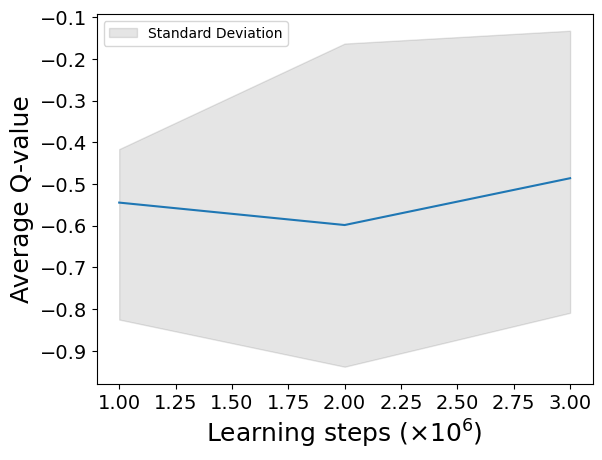

model updated


2024-07-18 21:23:24.957487: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 21:25:07.471515: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 21:57:40.846335: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:04:39.611149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


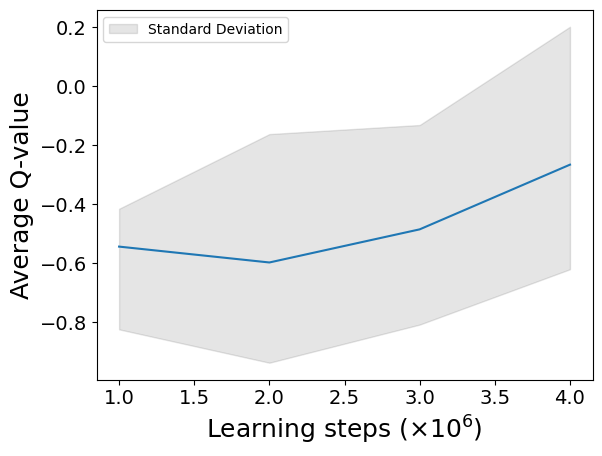

model updated


2024-07-18 22:14:23.444006: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6479.4

average moving queuetime :  78.0 138.1
average stay queuetime :  198.1 68.2
average total queuetime :  276.0 206.3
average chargecount :  1.9 2.0
average ordercount :  41.5 41.9
[60, 0, 0, 15, 37, 33, 58, 58, 69, 69, 44, 19]
[107, 40, 30, 69, 30, 63, 47, 59, 67, 72, 36, 18]
[80, 38, 56, 47, 54, 56, 30, 59, 60, 65, 53, 7]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.286776495938071
code start to now : 19408.9
episode_reward :  788.012157251588
fit_count :  41062
TD max = 1.521037831401825 TD min = 0.00010166535377502109
best model updated

episode 2
day : 0


2024-07-18 22:53:56.021455: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:53:56.166285: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:16:18.460645: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:17:03.292107: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


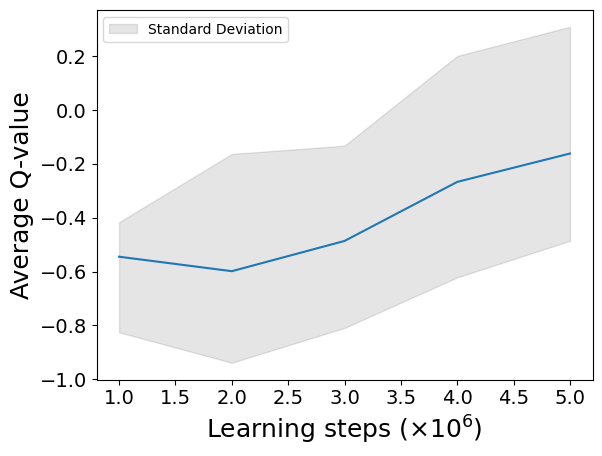

model updated


2024-07-18 23:50:39.465835: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6180.5

average moving queuetime :  58.9 106.0
average stay queuetime :  1.9 3.4
average total queuetime :  60.8 109.4
average chargecount :  1.8 1.8
average ordercount :  42.0 42.0
day : 1


2024-07-19 00:07:28.121191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:08:47.968721: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:24:30.081205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:24:38.239576: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:30:37.713087: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:31:53.056917: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:40:05.071166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:41:33.821159: W tensorflow/core/data/root_dataset.cc:24

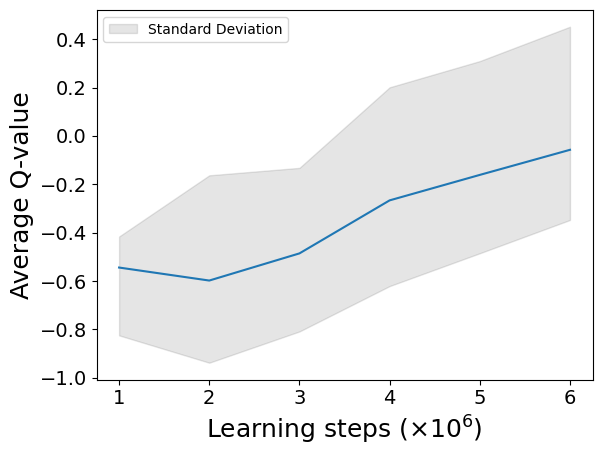

model updated


2024-07-19 01:33:29.749833: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 01:33:37.164639: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 01:46:36.877129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6415.4

average moving queuetime :  61.5 131.7
average stay queuetime :  8.9 31.1
average total queuetime :  70.4 162.8
average chargecount :  1.9 2.1
average ordercount :  42.1 42.1
day : 2


2024-07-19 01:49:55.869906: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


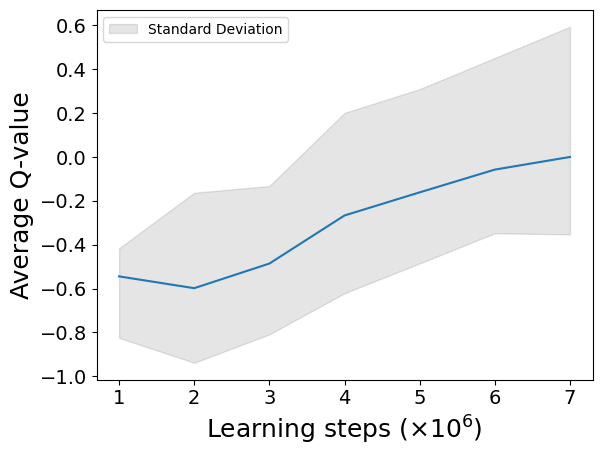

model updated


2024-07-19 02:11:19.701071: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:25:56.181684: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:39:29.501294: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:45:38.231256: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:52:46.268062: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:56:19.131088: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:09:05.611426: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:15:20.140206: W tensorflow/core/data/root_dataset.cc:24

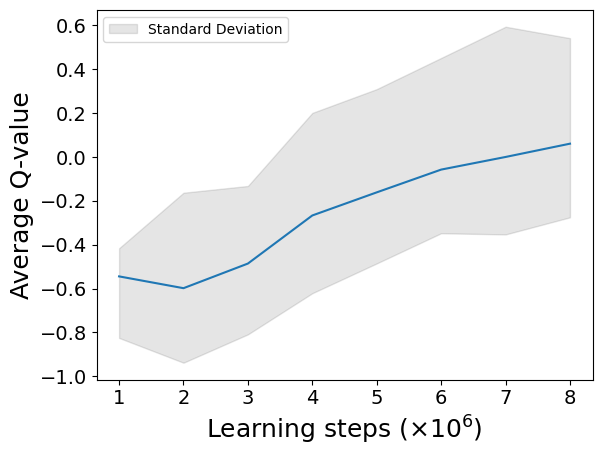

model updated


2024-07-19 03:22:45.695876: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:30:10.912629: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6351.2

average moving queuetime :  70.1 175.1
average stay queuetime :  75.7 411.1
average total queuetime :  145.8 586.2
average chargecount :  2.0 2.0
average ordercount :  42.0 41.8
[25, 33, 4, 75, 75, 34, 40, 64, 55, 66, 63, 6]
[46, 78, 34, 42, 67, 66, 37, 49, 56, 71, 64, 10]
[35, 73, 70, 45, 38, 42, 34, 57, 64, 82, 41, 25]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.287520002290611
code start to now : 38369.3
episode_reward :  1047.1944123397952
fit_count :  82061
TD max = 1.609095544910431 TD min = 0.00010007316470146402
best model updated

episode 3
day : 0


2024-07-19 03:35:19.150159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:10:50.879196: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:24:06.369969: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:31:57.288439: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


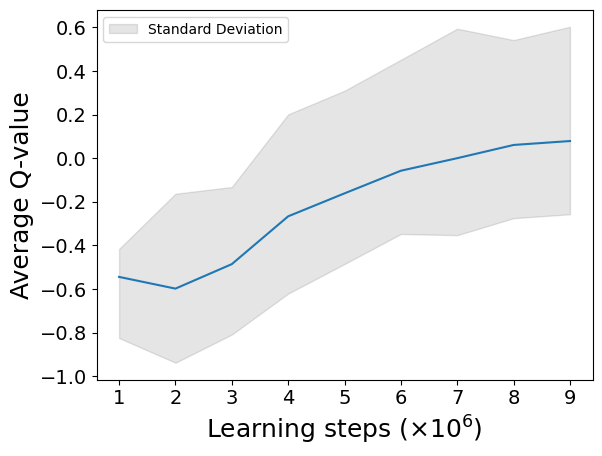

model updated


2024-07-19 04:46:24.661180: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6188.0

average moving queuetime :  65.3 114.7
average stay queuetime :  23.8 41.9
average total queuetime :  89.1 156.5
average chargecount :  1.8 1.8
average ordercount :  41.6 41.6
day : 1


2024-07-19 05:18:09.153359: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:28:12.298832: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:40:13.745087: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:40:33.710429: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:41:13.302990: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:42:19.061336: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:44:29.754758: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:46:45.169219: W tensorflow/core/data/root_dataset.cc:24

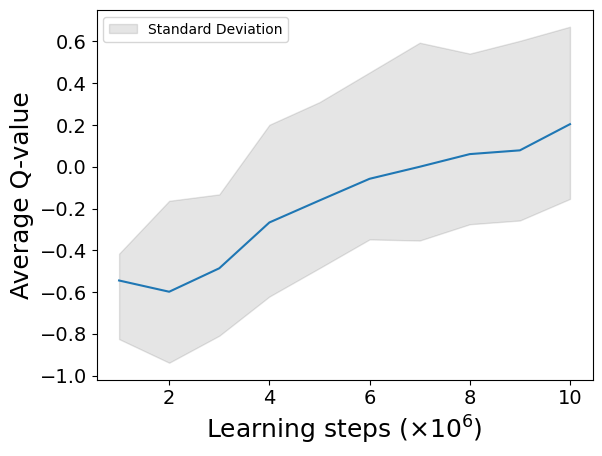

model updated


2024-07-19 05:57:13.047410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:48:02.666404: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:51:11.039547: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:53:08.648778: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6404.2

average moving queuetime :  67.3 140.4
average stay queuetime :  31.8 78.8
average total queuetime :  99.1 219.1
average chargecount :  1.9 2.0
average ordercount :  41.7 41.8
day : 2


2024-07-19 07:10:54.780763: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


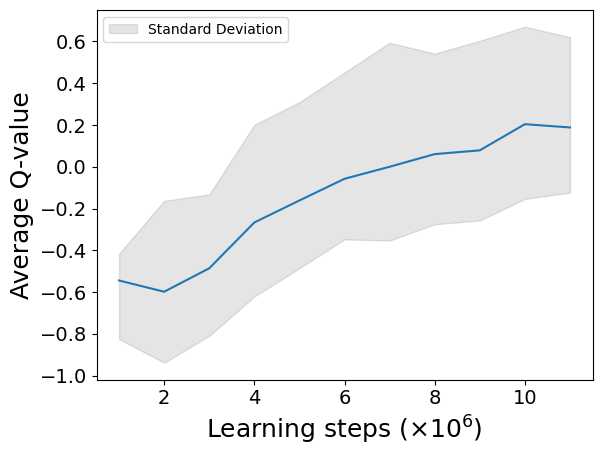

model updated


2024-07-19 07:30:56.122565: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:57:03.991127: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 08:10:28.889554: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 08:20:24.832645: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


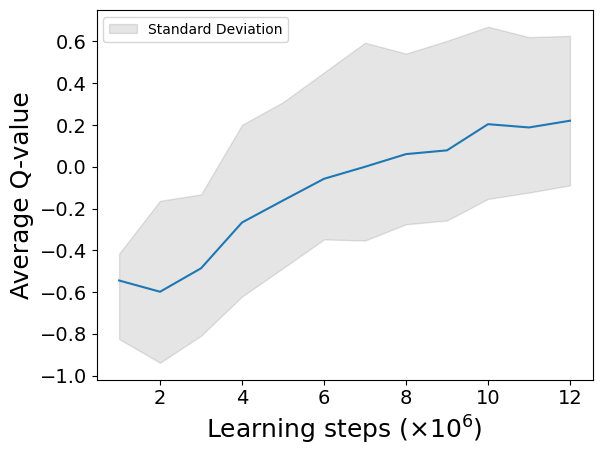

model updated


2024-07-19 08:49:08.702697: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6344.8

average moving queuetime :  69.9 149.5
average stay queuetime :  63.5 247.3
average total queuetime :  133.4 396.8
average chargecount :  1.9 2.0
average ordercount :  41.6 41.5
[28, 31, 2, 78, 68, 24, 19, 73, 73, 54, 60, 17]
[87, 34, 67, 33, 42, 53, 49, 54, 56, 68, 50, 17]
[83, 26, 63, 36, 60, 54, 21, 49, 66, 77, 42, 23]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.2850771161343
code start to now : 57319.2
episode_reward :  1064.4112511247413
fit_count :  122740
TD max = 1.609095544910431 TD min = 0.00010007316470146402
best model updated

episode 4
day : 0


2024-07-19 09:09:47.119427: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


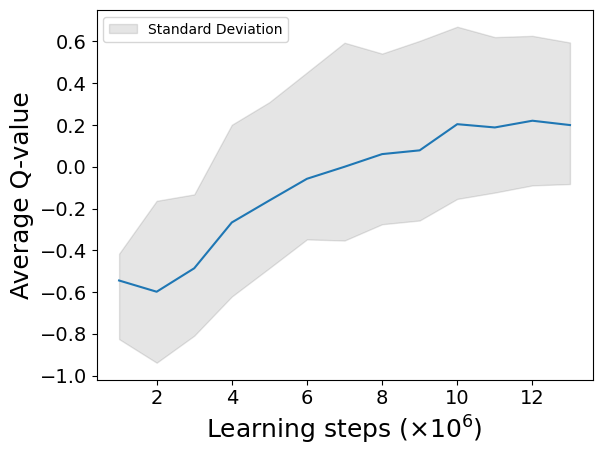

model updated


2024-07-19 09:55:22.393753: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:19:15.349734: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:22:24.459785: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6233.3

average moving queuetime :  69.7 117.1
average stay queuetime :  37.4 62.9
average total queuetime :  107.1 179.9
average chargecount :  1.7 1.7
average ordercount :  41.9 41.9
day : 1


2024-07-19 10:53:22.021904: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:56:31.891414: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


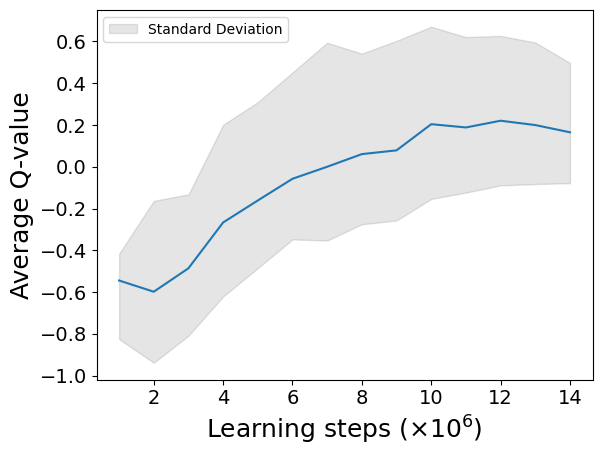

model updated


2024-07-19 11:08:25.775194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:11:18.629856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:41:03.309240: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:12:59.641184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6396.7

average moving queuetime :  75.6 155.9
average stay queuetime :  48.8 113.3
average total queuetime :  124.4 269.2
average chargecount :  1.8 1.9
average ordercount :  41.8 41.7
day : 2


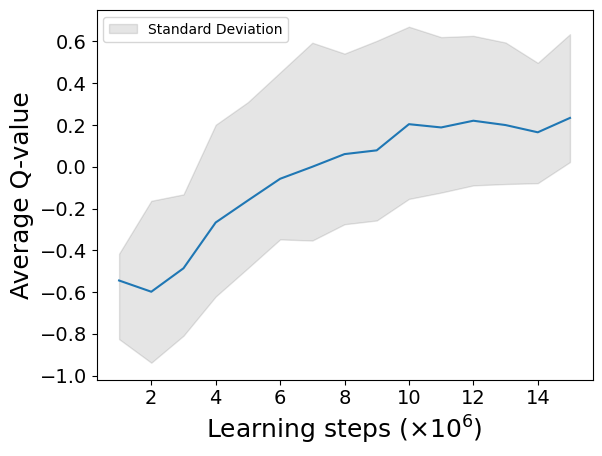

model updated


2024-07-19 12:38:16.457650: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:06:21.161127: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:23:46.626156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:28:11.463435: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:40:06.341152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


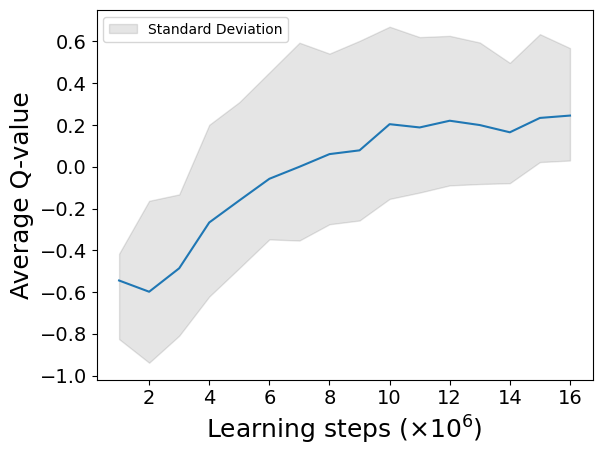

model updated


2024-07-19 13:54:09.431197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:08:21.745977: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6476.0

average moving queuetime :  76.0 146.4
average stay queuetime :  57.8 142.6
average total queuetime :  133.8 289.0
average chargecount :  1.8 1.9
average ordercount :  41.9 42.0
[26, 29, 7, 70, 51, 14, 36, 74, 73, 54, 55, 15]
[30, 68, 51, 53, 41, 47, 55, 55, 51, 63, 52, 13]
[42, 65, 48, 62, 38, 30, 44, 53, 59, 63, 49, 19]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.2659995489460805
code start to now : 76438.0
episode_reward :  1062.8768717445041
fit_count :  163519
TD max = 1.50902724275589 TD min = 0.00010007316470146402

episode 5
day : 0


2024-07-19 14:24:40.134495: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:33:08.299651: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


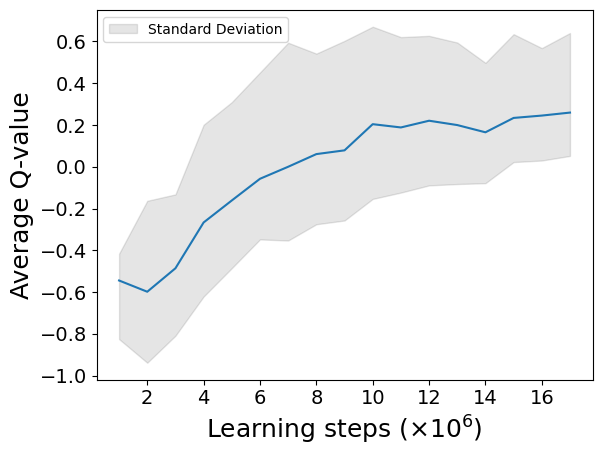

model updated


2024-07-19 15:15:58.605317: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:19:30.019791: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:23:54.438779: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:26:29.998812: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6283.6

average moving queuetime :  81.8 130.9
average stay queuetime :  237.0 379.2
average total queuetime :  318.8 510.1
average chargecount :  1.6 1.6
average ordercount :  41.4 41.4
day : 1


2024-07-19 16:15:09.391194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 16:15:17.053840: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


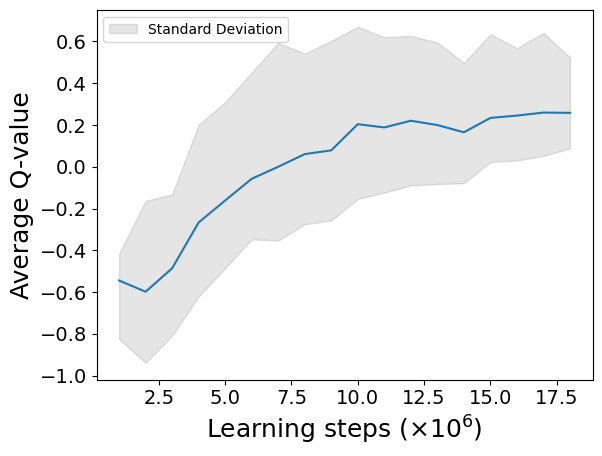

model updated


2024-07-19 16:40:27.546418: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


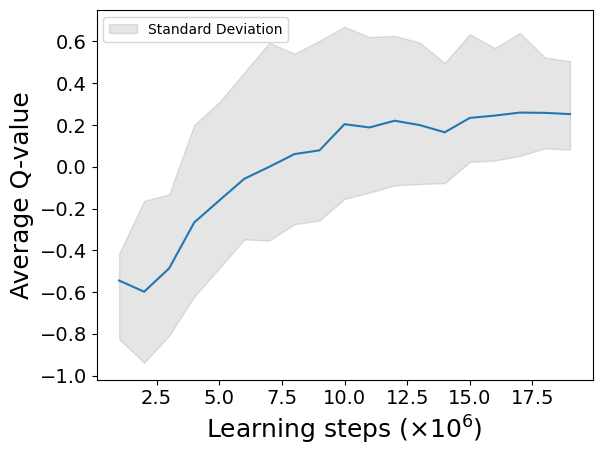

model updated

 time for simulate one day : 6395.8

average moving queuetime :  82.0 151.3
average stay queuetime :  220.8 380.3
average total queuetime :  302.8 531.6
average chargecount :  1.7 1.8
average ordercount :  41.4 41.4
day : 2


2024-07-19 17:41:37.251314: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:10:26.098147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:14:57.545094: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:21:55.113424: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:36:28.558279: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


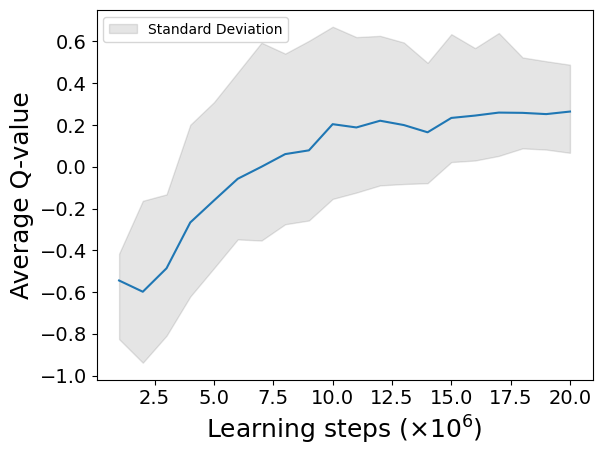

model updated


2024-07-19 19:15:27.333777: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:26:01.286386: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:27:40.987068: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6551.1

average moving queuetime :  80.6 144.7
average stay queuetime :  203.7 319.1
average total queuetime :  284.3 463.8
average chargecount :  1.8 1.9
average ordercount :  41.4 41.3
[51, 6, 5, 50, 36, 31, 35, 65, 63, 73, 40, 25]
[33, 51, 60, 52, 31, 22, 42, 73, 52, 71, 40, 25]
[54, 32, 64, 57, 40, 38, 32, 41, 68, 78, 36, 17]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.3334397321440825
code start to now : 95681.8
episode_reward :  797.3340871338029
fit_count :  203810
TD max = 1.1168150446768805 TD min = 0.00010009535314746123

episode 6
day : 0


2024-07-19 19:52:57.596106: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:53:49.031219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:00:42.029142: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:05:06.147376: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


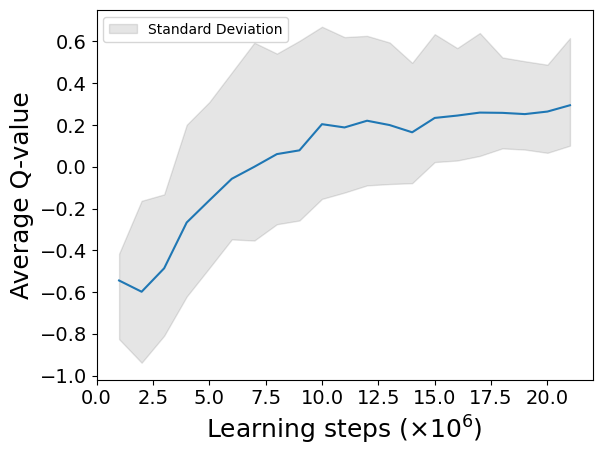

model updated


2024-07-19 20:55:52.990372: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:00:04.463670: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:07:00.907459: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6294.7

average moving queuetime :  77.3 119.7
average stay queuetime :  129.6 201.0
average total queuetime :  206.9 320.7
average chargecount :  1.6 1.6
average ordercount :  41.8 41.8
day : 1


2024-07-19 21:19:31.957413: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:28:36.853883: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:32:50.913542: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


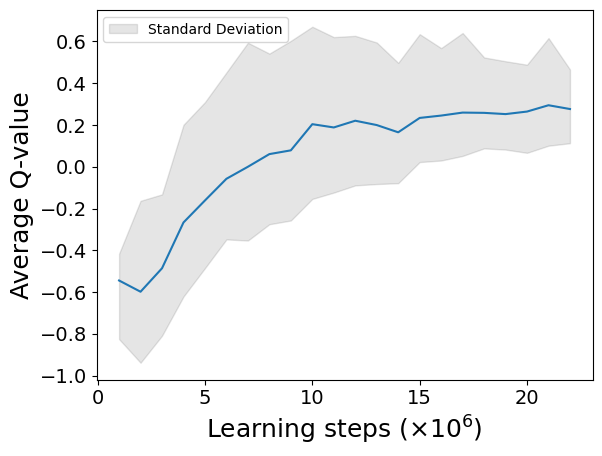

model updated


2024-07-19 22:01:07.301395: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:01:27.291159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:12:00.851233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:19:34.934811: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:42:36.032307: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:46:07.077107: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


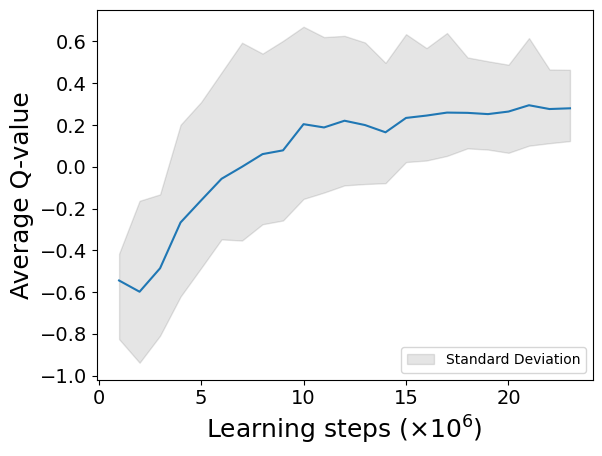

model updated

 time for simulate one day : 6433.1

average moving queuetime :  80.6 160.3
average stay queuetime :  180.7 427.1
average total queuetime :  261.2 587.5
average chargecount :  1.7 1.9
average ordercount :  41.7 41.5
day : 2


2024-07-19 23:05:52.841172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:09:47.613870: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:16:19.213935: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:29:50.851213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:45:22.706296: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:58:56.963592: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:59:34.311158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


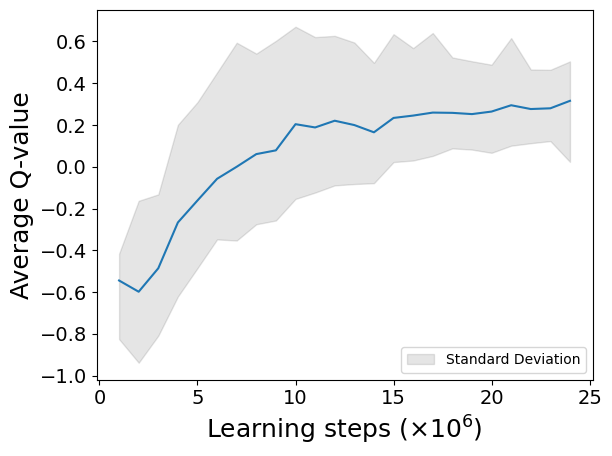

model updated


2024-07-20 00:25:12.817965: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6526.1

average moving queuetime :  76.0 135.3
average stay queuetime :  126.4 62.9
average total queuetime :  202.4 198.2
average chargecount :  1.8 2.0
average ordercount :  41.8 41.9
[32, 20, 9, 27, 44, 23, 68, 34, 71, 64, 48, 25]
[45, 53, 49, 44, 65, 40, 20, 70, 55, 67, 57, 13]
[85, 32, 69, 22, 46, 66, 19, 58, 72, 59, 48, 21]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.325780886074609
code start to now : 114949.4
episode_reward :  955.2974471458367
fit_count :  244484
TD max = 1.3785136244075846 TD min = 0.00010051379203791502

episode 7
day : 0


2024-07-20 00:52:28.639407: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:03:22.122185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:16:19.230019: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:18:36.185754: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:21:38.051123: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:24:27.569945: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:30:19.932779: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


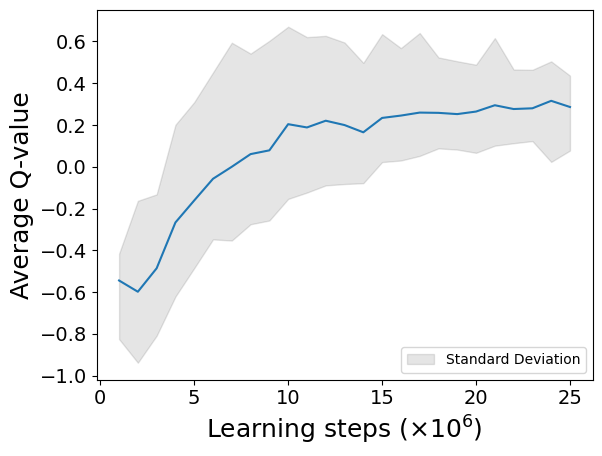

model updated


2024-07-20 01:48:19.266231: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:02:05.165361: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:17:13.001199: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:19:40.051586: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:28:31.625402: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6337.8

average moving queuetime :  74.0 119.6
average stay queuetime :  99.2 160.4
average total queuetime :  173.2 280.1
average chargecount :  1.6 1.6
average ordercount :  42.0 42.0
day : 1


2024-07-20 02:39:40.859899: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


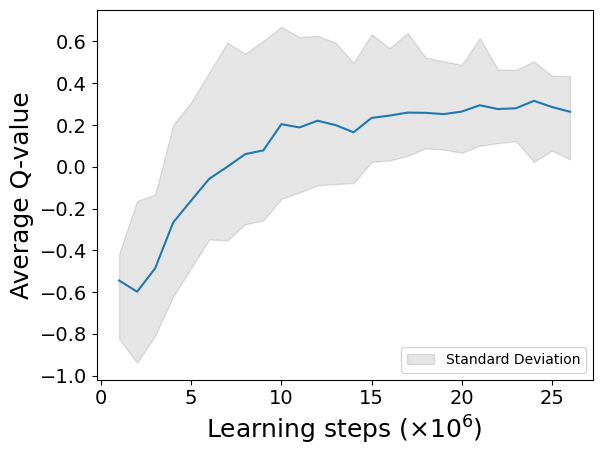

model updated


2024-07-20 02:54:25.415586: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:03:08.124874: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:10:23.744700: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:23:23.397787: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:24:49.818727: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:31:14.688993: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:37:28.101190: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:51:15.710308: W tensorflow/core/data/root_dataset.cc:24

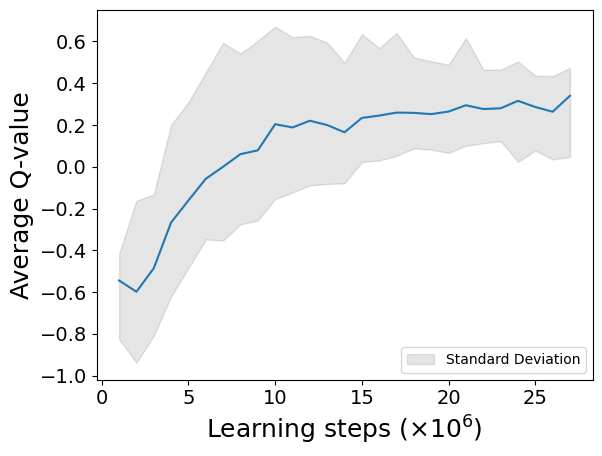

model updated


2024-07-20 04:15:50.227981: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6565.8

average moving queuetime :  75.4 154.0
average stay queuetime :  85.6 150.1
average total queuetime :  161.1 304.0
average chargecount :  1.8 2.0
average ordercount :  41.9 41.8
day : 2


2024-07-20 04:50:12.000687: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:53:29.477483: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:59:12.201233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 05:02:23.371197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 05:06:40.499346: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


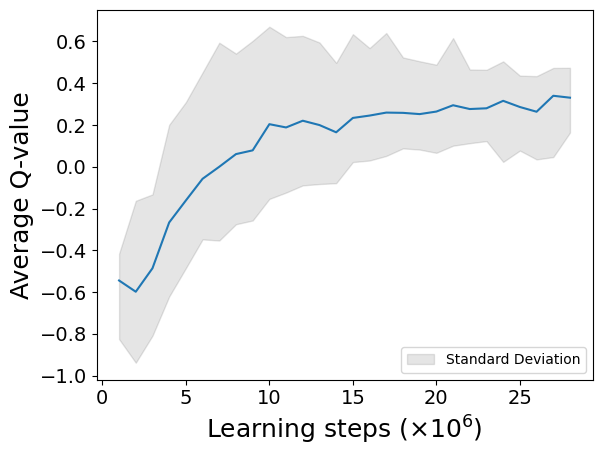

model updated

 time for simulate one day : 6565.4

average moving queuetime :  73.7 142.6
average stay queuetime :  86.5 177.7
average total queuetime :  160.2 320.2
average chargecount :  1.9 2.0
average ordercount :  41.9 41.8
[55, 1, 4, 28, 59, 53, 43, 39, 74, 66, 48, 15]
[59, 61, 51, 53, 44, 29, 30, 80, 72, 43, 70, 11]
[79, 33, 67, 40, 72, 28, 32, 39, 73, 66, 50, 26]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.288908850937768
code start to now : 134431.3
episode_reward :  1035.2304159678188
fit_count :  285323
TD max = 1.3785136244075846 TD min = 0.00010014841556550405

episode 8
day : 0


2024-07-20 06:27:24.511193: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 06:30:14.258887: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


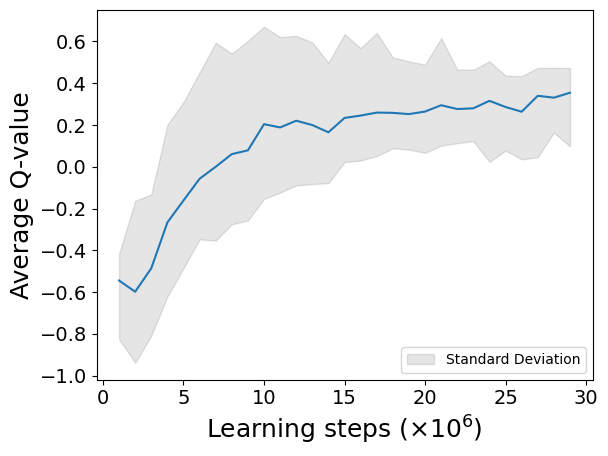

model updated


2024-07-20 06:57:03.173615: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:04:04.620966: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:48:40.941159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:50:44.301154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6314.1

average moving queuetime :  76.8 124.2
average stay queuetime :  313.3 506.5
average total queuetime :  390.1 630.7
average chargecount :  1.6 1.6
average ordercount :  41.5 41.5
day : 1


2024-07-20 08:02:39.298637: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


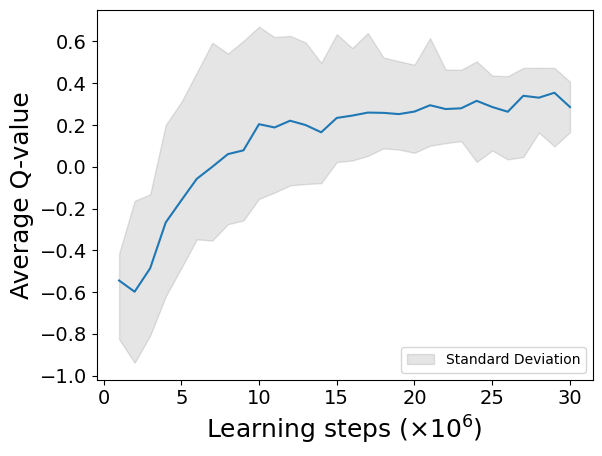

model updated


2024-07-20 08:46:34.039451: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 08:52:27.800474: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 09:13:57.360170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 09:19:00.752846: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 09:33:25.641761: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


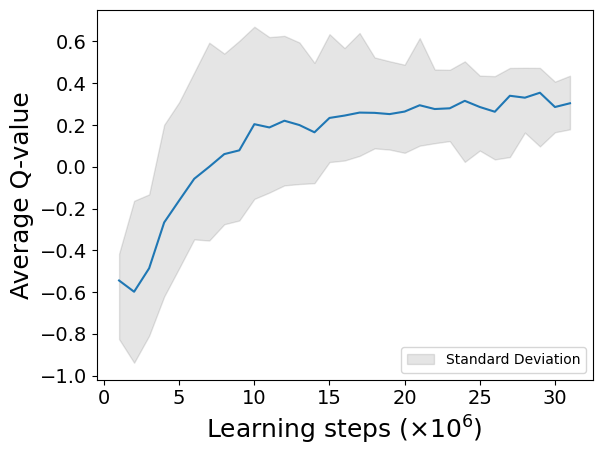

model updated


2024-07-20 09:44:08.198182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 09:45:55.598857: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 09:48:52.187197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6605.4

average moving queuetime :  73.6 135.5
average stay queuetime :  186.1 150.3
average total queuetime :  259.6 285.8
average chargecount :  1.8 1.9
average ordercount :  41.7 41.9
day : 2


2024-07-20 10:07:56.110989: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 10:11:37.820889: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 10:24:28.651163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


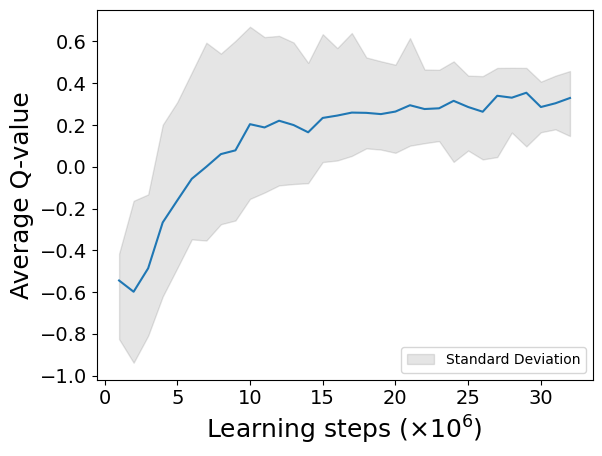

model updated


2024-07-20 10:58:12.189317: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:12:53.680453: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:33:34.961158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:36:07.939393: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6555.8

average moving queuetime :  69.9 118.2
average stay queuetime :  141.6 108.6
average total queuetime :  211.4 226.7
average chargecount :  1.8 1.9
average ordercount :  41.7 41.6
[26, 28, 7, 42, 43, 51, 32, 41, 70, 66, 57, 22]
[45, 52, 37, 38, 72, 28, 54, 42, 71, 67, 51, 17]
[51, 43, 47, 43, 57, 56, 41, 31, 70, 56, 57, 11]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.322164807579712
code start to now : 153919.5
episode_reward :  942.8311659176393
fit_count :  325899
TD max = 1.2957920114159585 TD min = 0.00010014841556550405

episode 9
day : 0


2024-07-20 11:41:47.260771: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:52:09.811178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:56:52.421185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:59:00.891207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:02:13.100112: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:12:10.497707: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


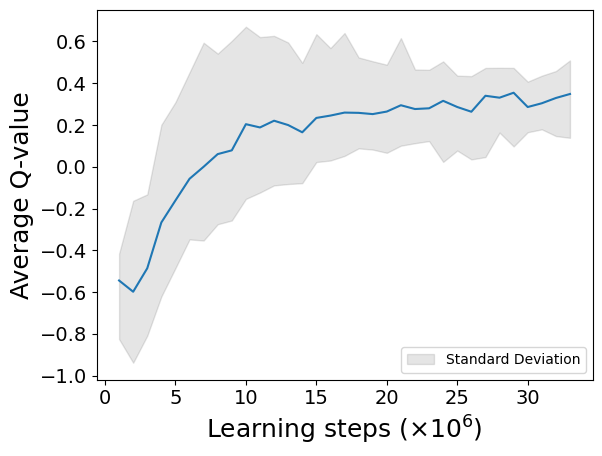

model updated


2024-07-20 12:19:24.290490: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:20:29.907079: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:31:43.431185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:09:08.540939: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:18:46.269694: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6351.1

average moving queuetime :  75.9 132.9
average stay queuetime :  113.1 197.9
average total queuetime :  189.0 330.8
average chargecount :  1.8 1.8
average ordercount :  41.7 41.7
day : 1


2024-07-20 13:28:40.541311: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


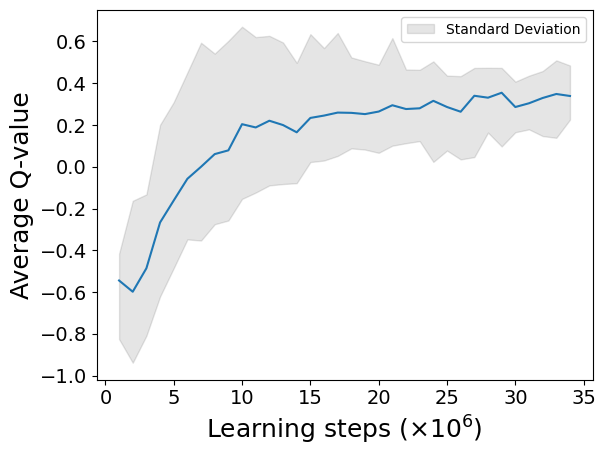

model updated


2024-07-20 13:37:46.516425: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:38:05.209110: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:50:46.040743: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:06:51.721125: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:39:47.138293: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


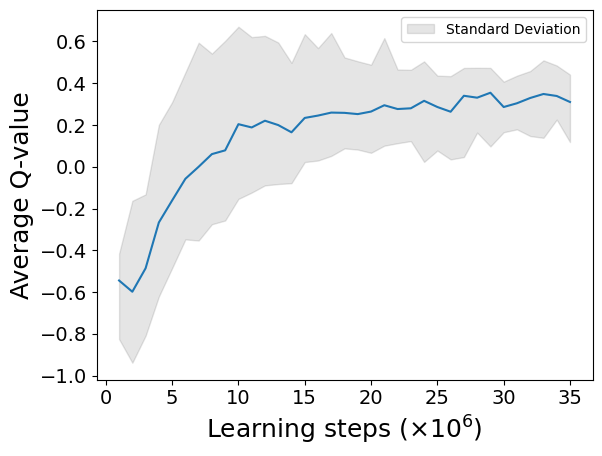

model updated


2024-07-20 15:00:37.298926: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:03:55.981135: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:13:48.695452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6584.1

average moving queuetime :  75.5 135.9
average stay queuetime :  80.1 87.2
average total queuetime :  155.6 223.1
average chargecount :  1.8 1.8
average ordercount :  41.9 42.0
day : 2


2024-07-20 15:18:15.520295: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:20:42.960885: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:41:25.917046: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:50:07.491156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


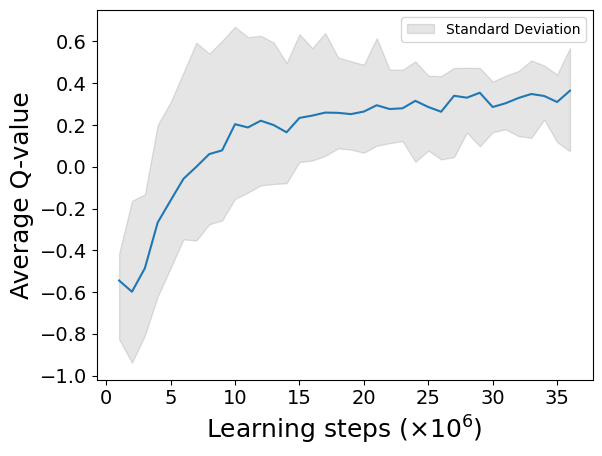

model updated


2024-07-20 16:15:19.579143: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 16:52:36.199800: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:00:28.681773: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6503.0

average moving queuetime :  76.5 149.1
average stay queuetime :  78.6 144.3
average total queuetime :  155.1 293.5
average chargecount :  1.8 1.9
average ordercount :  41.9 41.9
[38, 14, 9, 54, 51, 36, 41, 40, 71, 73, 41, 57]
[24, 54, 36, 49, 50, 47, 46, 45, 58, 60, 56, 18]
[49, 49, 59, 35, 42, 54, 21, 77, 59, 59, 58, 9]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.323521996681674
code start to now : 173370.9
episode_reward :  1048.769485846362
fit_count :  366689
TD max = 1.1715649200439453 TD min = 0.00010042676925660068

episode 10
day : 0


2024-07-20 17:05:36.193551: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:20:47.651263: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:23:41.027649: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


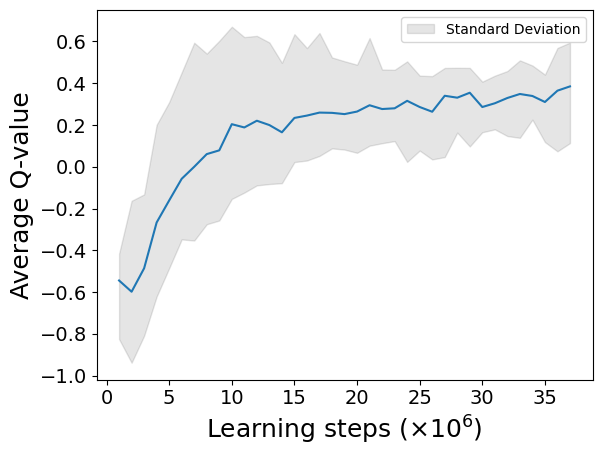

model updated


2024-07-20 18:07:58.269860: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 18:24:22.908046: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 18:28:20.053803: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6348.7

average moving queuetime :  81.4 153.4
average stay queuetime :  111.2 209.4
average total queuetime :  192.7 362.8
average chargecount :  1.9 1.9
average ordercount :  41.5 41.5
day : 1


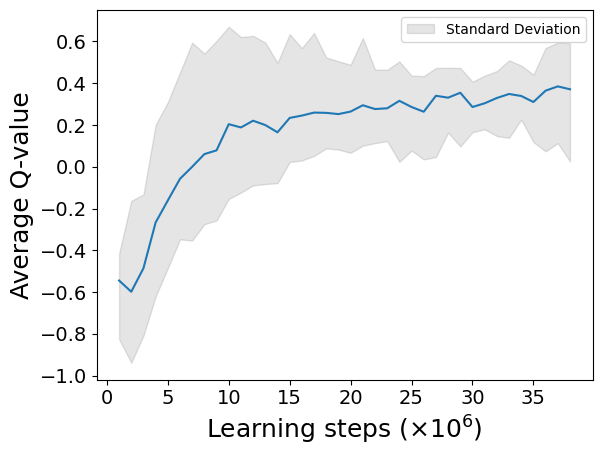

model updated


2024-07-20 19:20:23.597083: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:43:26.517990: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:46:50.801221: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:03:25.281153: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:05:43.881445: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:10:48.595920: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


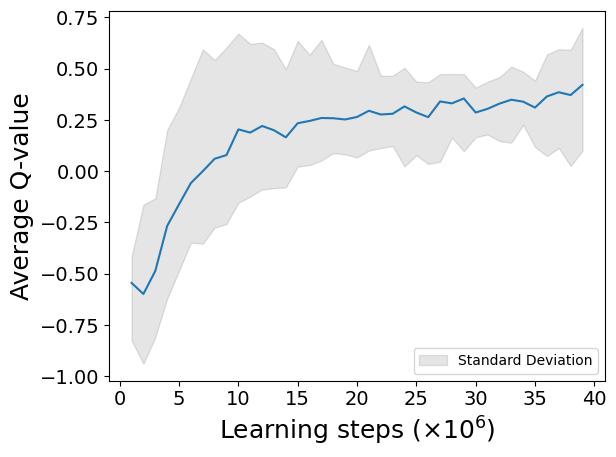

model updated


2024-07-20 20:14:30.652124: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:16:39.200125: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:25:51.061150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:26:08.559154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:31:36.641347: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6521.0

average moving queuetime :  79.2 142.3
average stay queuetime :  100.4 165.2
average total queuetime :  179.6 307.5
average chargecount :  1.9 1.9
average ordercount :  41.6 41.7
day : 2


2024-07-20 20:40:04.521278: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:41:32.818458: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:42:11.880553: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:04:35.440702: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:18:43.221138: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:20:14.544849: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:23:49.015862: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:26:28.436670: W tensorflow/core/data/root_dataset.cc:24

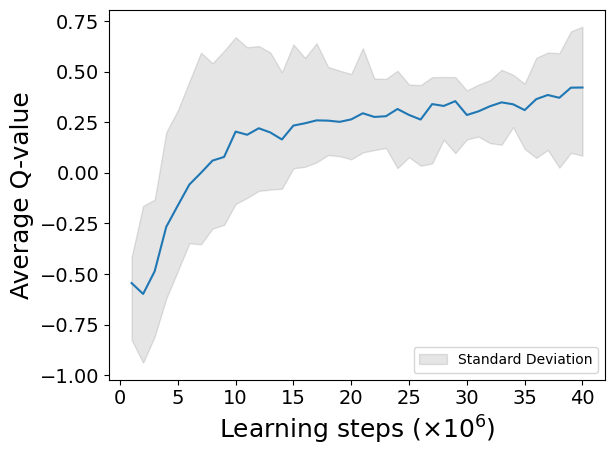

model updated


2024-07-20 21:45:05.984397: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:04:38.700638: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:11:10.679063: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:24:14.322993: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:30:10.030877: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6716.8

average moving queuetime :  77.2 141.4
average stay queuetime :  79.8 77.1
average total queuetime :  157.0 218.5
average chargecount :  1.9 1.9
average ordercount :  41.7 42.0
[30, 63, 71, 36, 45, 52, 25, 51, 62, 74, 40, 16]
[26, 58, 54, 54, 37, 64, 24, 45, 68, 72, 34, 19]
[49, 66, 30, 67, 40, 42, 47, 49, 64, 72, 36, 16]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.276467783417939
code start to now : 192970.3
episode_reward :  1004.4886479494518
fit_count :  407408
TD max = 1.204019347524643 TD min = 0.000100047385692592

episode 11
day : 0


2024-07-20 22:35:28.611104: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:38:40.121156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:40:28.985160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:01:09.342703: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:01:13.816429: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:10:04.334187: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


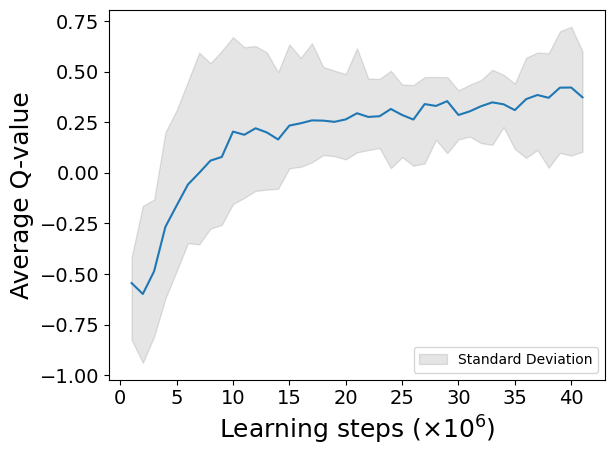

model updated


2024-07-21 00:15:05.321122: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:23:50.290491: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:31:39.644856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


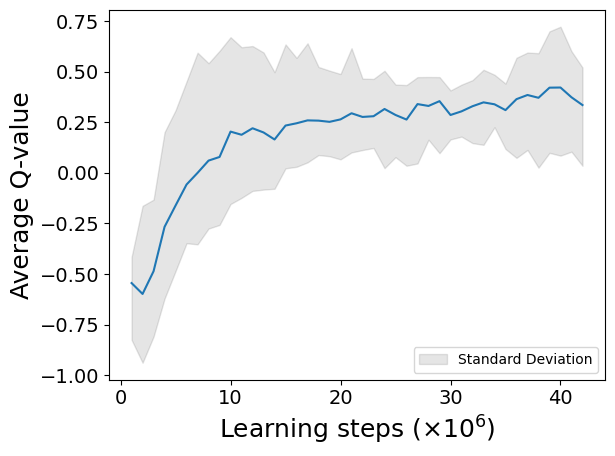

model updated


2024-07-21 00:34:57.997357: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7506.2

average moving queuetime :  83.7 134.2
average stay queuetime :  164.4 263.6
average total queuetime :  248.1 397.7
average chargecount :  1.6 1.6
average ordercount :  41.8 41.8
day : 1


2024-07-21 00:37:52.261881: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:44:45.261132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:48:20.648263: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:06:33.666915: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:10:19.998711: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:12:20.917803: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:14:50.938873: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


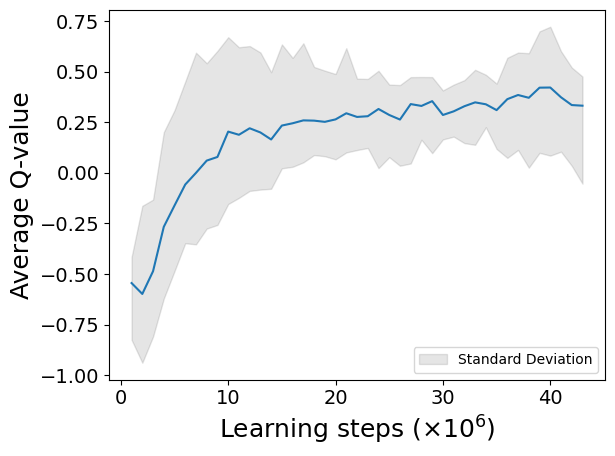

model updated


2024-07-21 01:51:41.985314: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:54:05.838851: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:54:09.762478: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:04:06.746383: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6526.6

average moving queuetime :  82.2 146.2
average stay queuetime :  140.5 215.5
average total queuetime :  222.7 361.7
average chargecount :  1.7 1.8
average ordercount :  41.7 41.5
day : 2


2024-07-21 02:44:14.619686: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:54:35.239167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:09:20.222981: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


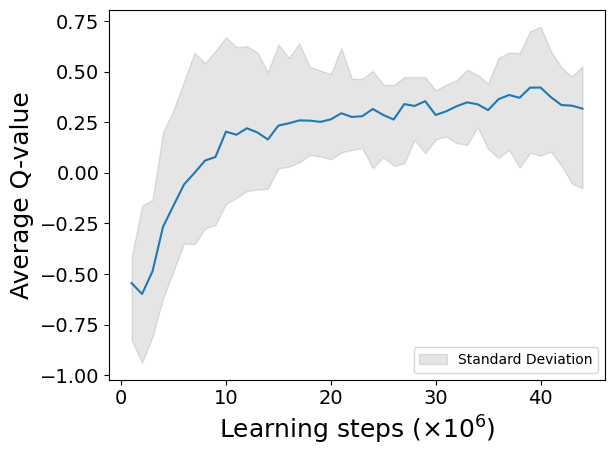

model updated


2024-07-21 03:19:04.412050: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:20:30.541468: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:22:24.479945: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:39:31.379059: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:42:21.693905: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:58:09.104661: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:05:11.594490: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6538.6

average moving queuetime :  87.0 179.4
average stay queuetime :  147.3 299.2
average total queuetime :  234.3 478.6
average chargecount :  1.8 1.9
average ordercount :  41.7 41.8
[31, 20, 9, 7, 42, 68, 36, 47, 74, 56, 62, 29]
[40, 32, 53, 63, 32, 71, 12, 32, 67, 72, 42, 26]
[16, 70, 48, 58, 42, 18, 54, 53, 69, 65, 40, 29]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.338019761915929
code start to now : 213554.8
episode_reward :  901.3297083811691
fit_count :  447971
TD max = 1.204019347524643 TD min = 0.000100047385692592

episode 12
day : 0


2024-07-21 04:29:12.047992: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


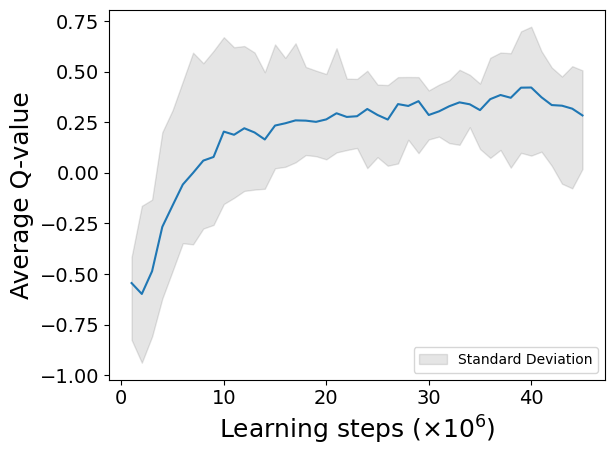

model updated


2024-07-21 04:35:36.668081: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:55:59.871805: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:56:00.141139: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:58:11.230122: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:58:34.026038: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:14:24.821596: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:15:07.741205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:17:10.681218: W tensorflow/core/data/root_dataset.cc:24

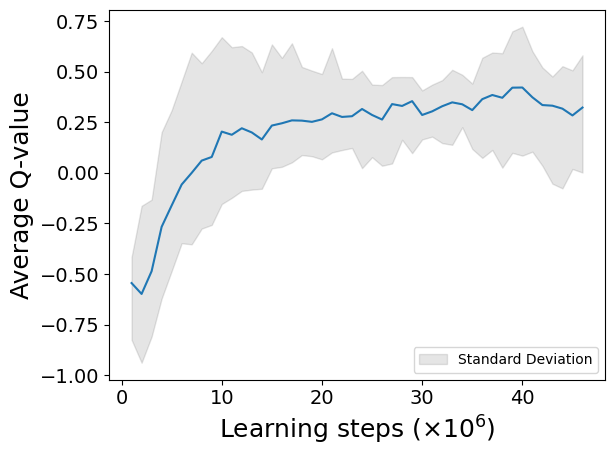

model updated


2024-07-21 05:56:12.277778: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6357.2

average moving queuetime :  75.8 121.6
average stay queuetime :  102.2 163.9
average total queuetime :  178.1 285.5
average chargecount :  1.6 1.6
average ordercount :  42.1 42.1
day : 1


2024-07-21 06:32:19.211725: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:32:55.121163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:39:03.700283: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:39:12.858115: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:45:39.623215: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:52:31.021090: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:55:59.031102: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:04:40.701314: W tensorflow/core/data/root_dataset.cc:24

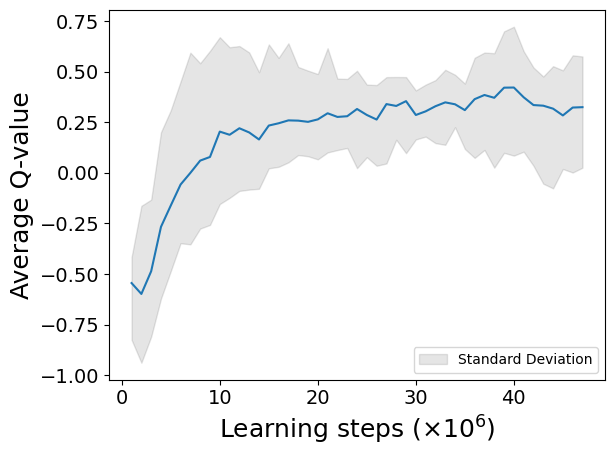

model updated


2024-07-21 07:24:31.017023: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:28:04.468255: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:39:26.611199: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6606.0

average moving queuetime :  84.1 170.6
average stay queuetime :  87.9 141.5
average total queuetime :  172.1 312.1
average chargecount :  1.7 1.9
average ordercount :  42.0 41.9
day : 2


2024-07-21 08:21:59.037619: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


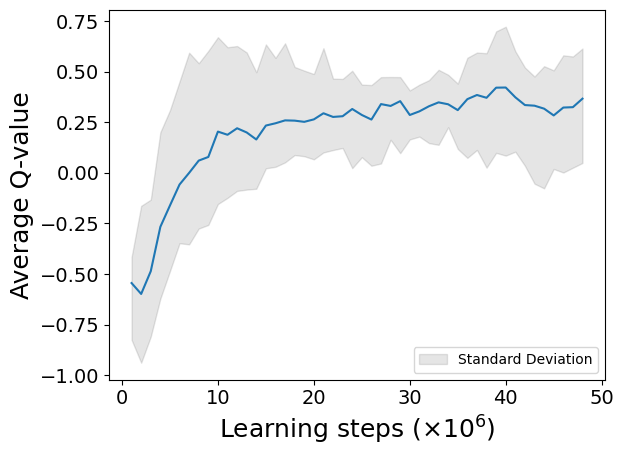

model updated


2024-07-21 08:36:01.991409: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:49:14.768770: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:58:26.651031: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:12:06.817626: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:18:19.111152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:22:49.891680: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6602.5

average moving queuetime :  84.2 161.2
average stay queuetime :  89.3 175.7
average total queuetime :  173.5 336.8
average chargecount :  1.8 1.9
average ordercount :  42.0 41.9
[23, 28, 8, 10, 87, 43, 36, 33, 72, 84, 36, 21]
[23, 72, 72, 35, 40, 19, 61, 51, 64, 56, 57, 11]
[54, 49, 47, 65, 33, 39, 25, 76, 76, 49, 54, 7]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.272630603547029
code start to now : 233133.3
episode_reward :  1015.6124715828488
fit_count :  488815
TD max = 1.3273522522354992 TD min = 0.0001005114078521773

episode 13
day : 0


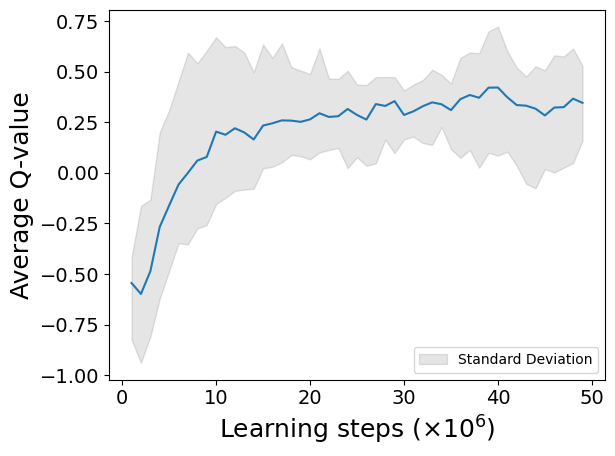

model updated


2024-07-21 10:20:13.240353: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:20:40.311320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:27:08.089117: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:30:15.451176: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:31:12.559112: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:43:04.345431: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:11:12.145154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


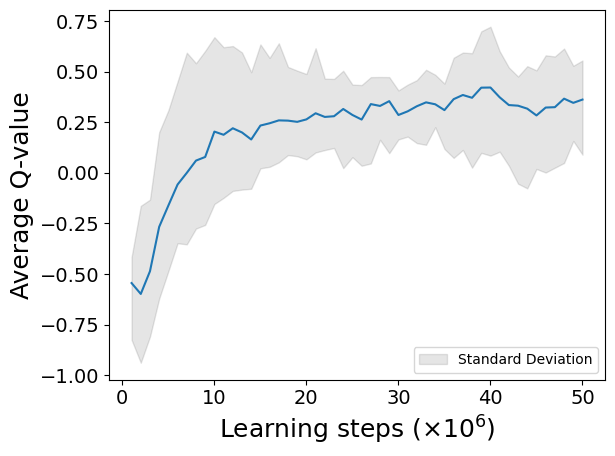

model updated


2024-07-21 11:20:40.897209: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:24:17.671097: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6546.8

average moving queuetime :  84.2 136.1
average stay queuetime :  172.9 279.5
average total queuetime :  257.1 415.6
average chargecount :  1.6 1.6
average ordercount :  41.8 41.8
day : 1


2024-07-21 11:41:07.041708: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:45:55.441262: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:54:18.559046: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 12:12:29.678260: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 12:14:25.761120: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 12:29:52.481165: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


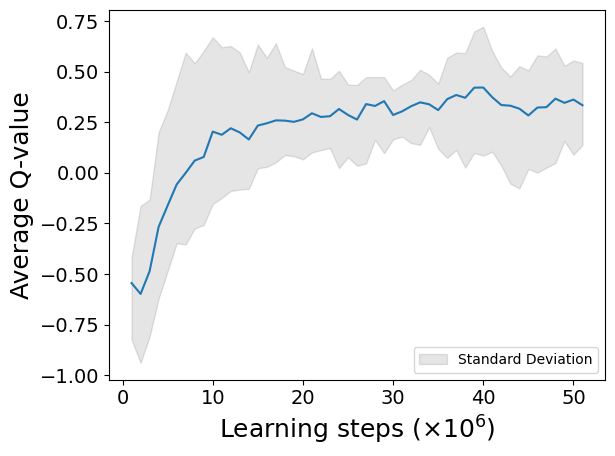

model updated


2024-07-21 12:35:07.195122: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 12:47:20.801327: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:10:06.341833: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6475.6

average moving queuetime :  79.6 148.5
average stay queuetime :  104.7 94.9
average total queuetime :  184.3 243.5
average chargecount :  1.8 2.0
average ordercount :  41.8 41.8
day : 2


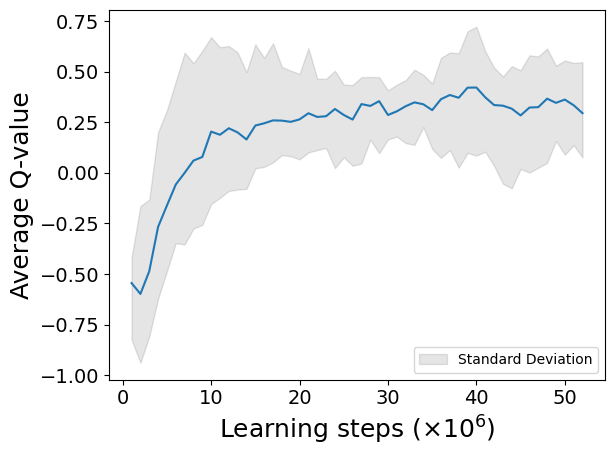

model updated


2024-07-21 14:14:36.092112: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:30:03.847166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:32:47.439264: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:37:07.218292: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:41:22.729355: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:03:33.699830: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6519.7

average moving queuetime :  75.6 128.6
average stay queuetime :  81.0 68.3
average total queuetime :  156.6 196.9
average chargecount :  1.8 1.9
average ordercount :  41.8 41.9
[27, 27, 5, 75, 11, 48, 22, 75, 42, 77, 59, 17]
[43, 43, 69, 39, 71, 36, 41, 40, 76, 56, 55, 19]
[33, 75, 40, 68, 25, 54, 61, 56, 34, 71, 39, 11]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.276918220696469
code start to now : 252688.4
episode_reward :  1064.3931423187062
fit_count :  529548
TD max = 1.2502843589544297 TD min = 0.00010053137540817483

episode 14
day : 0


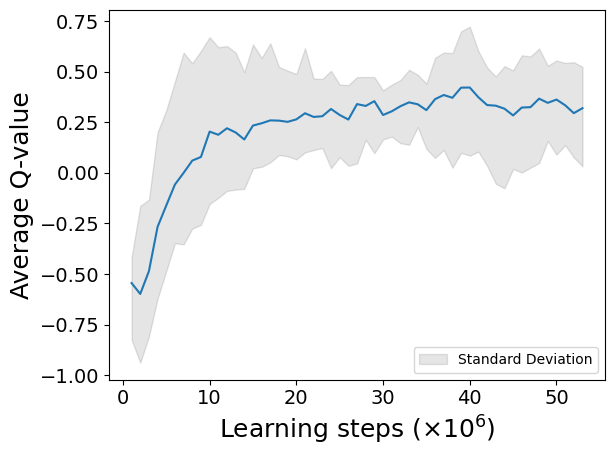

model updated


2024-07-21 15:15:07.748864: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:21:28.399395: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:40:10.489959: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:00:49.311209: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:05:56.111252: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:06:24.294312: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:10:16.832787: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:18:24.251702: W tensorflow/core/data/root_dataset.cc:24

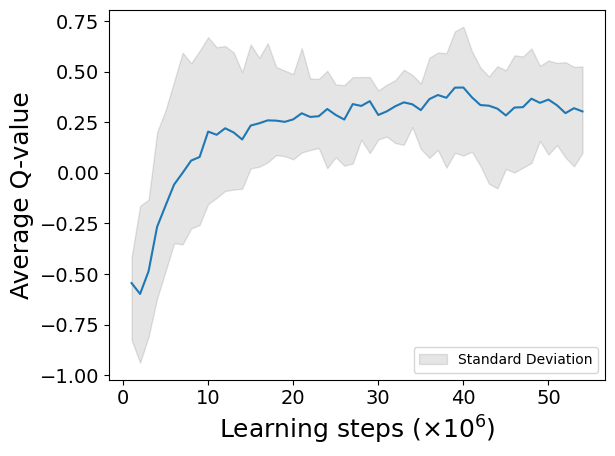

model updated


2024-07-21 16:38:12.639106: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6419.6

average moving queuetime :  63.0 107.3
average stay queuetime :  23.2 39.5
average total queuetime :  86.2 146.8
average chargecount :  1.7 1.7
average ordercount :  42.0 42.0
day : 1


2024-07-21 16:57:09.585213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:06:22.131268: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:23:02.587194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:40:47.781265: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


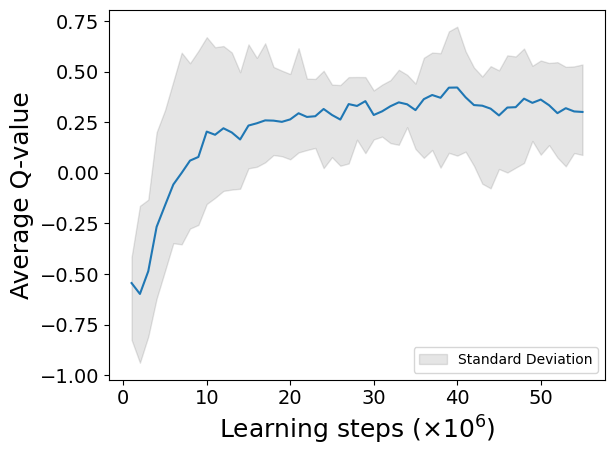

model updated


2024-07-21 18:04:30.180671: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:20:58.681305: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:41:17.648724: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:42:05.400564: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6619.6

average moving queuetime :  63.5 120.1
average stay queuetime :  12.9 6.6
average total queuetime :  76.4 126.7
average chargecount :  1.8 1.9
average ordercount :  41.9 41.8
day : 2


2024-07-21 18:48:45.206914: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:52:33.524017: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:58:53.840498: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


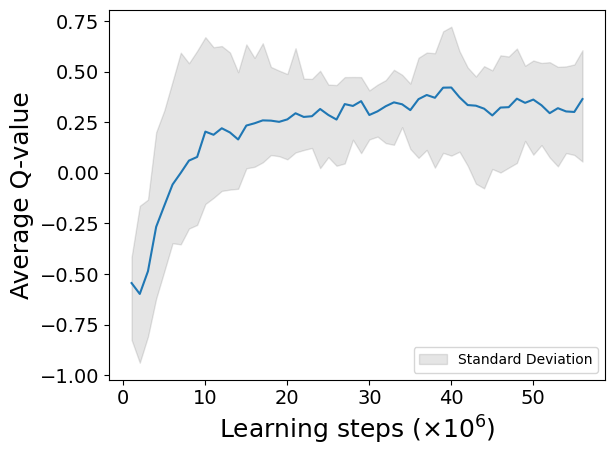

model updated


2024-07-21 19:29:27.656547: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 19:30:13.593226: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 19:49:18.929808: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:27:13.864562: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:31:15.225504: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


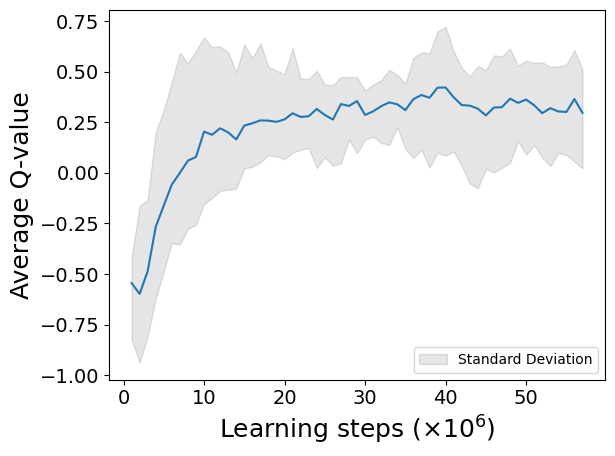

model updated

 time for simulate one day : 6609.7

average moving queuetime :  68.2 155.2
average stay queuetime :  30.0 122.3
average total queuetime :  98.2 277.5
average chargecount :  1.9 2.0
average ordercount :  41.9 41.8
[23, 24, 13, 75, 51, 25, 41, 68, 79, 37, 68, 7]
[37, 49, 52, 52, 50, 45, 68, 42, 50, 76, 31, 11]
[66, 65, 30, 72, 39, 37, 30, 74, 39, 72, 46, 39]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.277141435853384
code start to now : 272350.0
episode_reward :  1148.9292483816648
fit_count :  570394
TD max = 1.268574085330963 TD min = 0.00010051707029341542
best model updated

episode 15
day : 0


2024-07-21 20:42:26.670685: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:58:08.922313: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:03:27.352103: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:11:52.247552: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:16:09.373925: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:16:50.656047: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:33:55.336255: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:42:04.265907: W tensorflow/core/data/root_dataset.cc:24

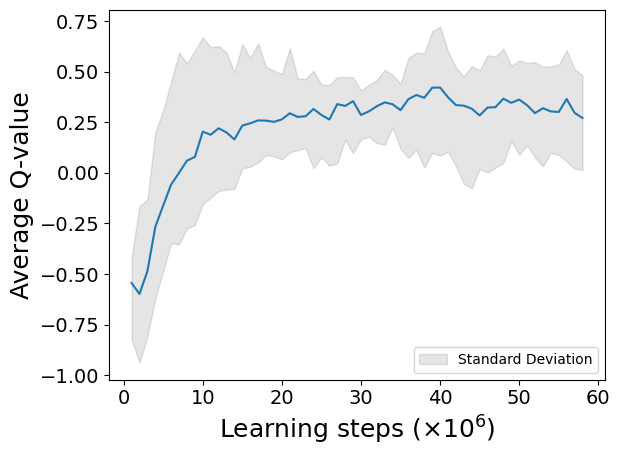

model updated


2024-07-21 22:11:46.141211: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:18:11.321113: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6339.9

average moving queuetime :  57.0 94.7
average stay queuetime :  2.5 4.1
average total queuetime :  59.4 98.8
average chargecount :  1.7 1.7
average ordercount :  41.9 41.9
day : 1


2024-07-21 22:30:58.521106: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:47:51.790921: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:58:04.565976: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


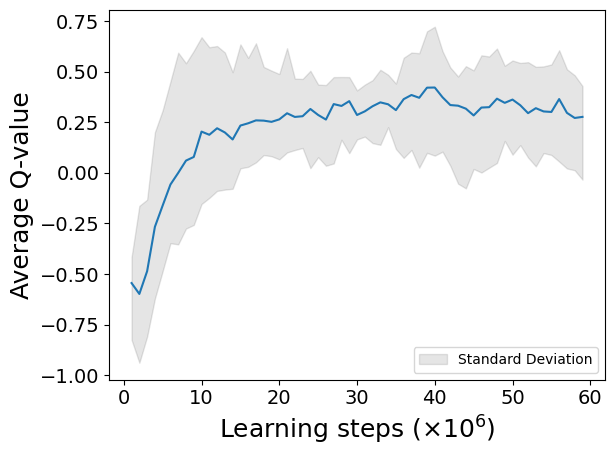

model updated

 time for simulate one day : 6550.6

average moving queuetime :  68.9 149.8
average stay queuetime :  29.6 100.7
average total queuetime :  98.5 250.5
average chargecount :  1.8 1.9
average ordercount :  41.8 41.7
day : 2


2024-07-22 00:24:20.649486: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


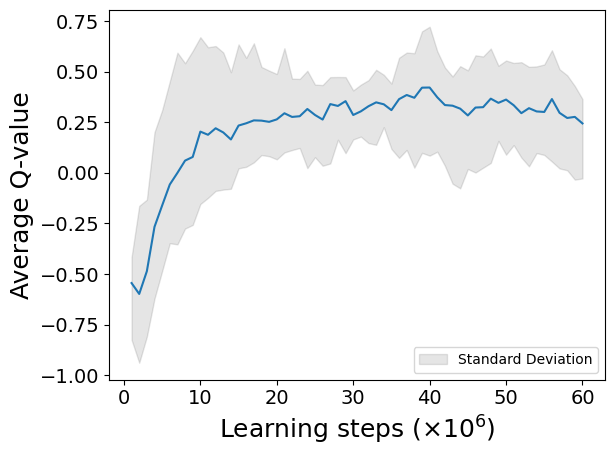

model updated


2024-07-22 00:46:19.841236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 00:56:43.263464: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:30:05.110993: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:46:19.858376: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:47:10.780028: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


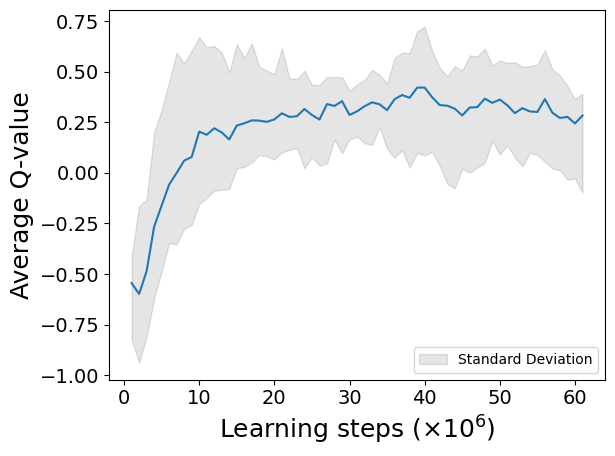

model updated

 time for simulate one day : 6792.7

average moving queuetime :  67.8 130.2
average stay queuetime :  22.8 20.8
average total queuetime :  90.6 151.1
average chargecount :  1.8 2.0
average ordercount :  41.8 41.9
day : 3


2024-07-22 02:08:01.688299: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:26:09.231178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:59:42.251159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 03:02:09.524670: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 03:14:31.875368: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


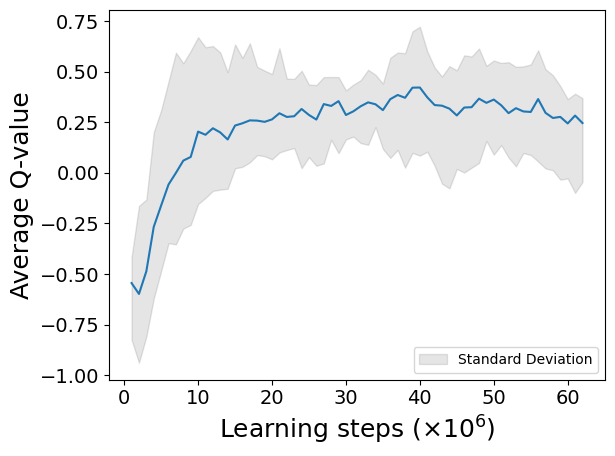

model updated


2024-07-22 03:47:19.213984: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 03:47:37.353223: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 03:51:33.710292: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6636.1

average moving queuetime :  68.3 134.7
average stay queuetime :  19.9 22.8
average total queuetime :  88.2 157.5
average chargecount :  1.9 1.9
average ordercount :  41.9 42.0
[25, 25, 10, 48, 48, 31, 78, 71, 49, 62, 45, 7]
[29, 77, 35, 53, 53, 36, 50, 57, 73, 42, 44, 16]
[46, 74, 35, 64, 53, 34, 62, 34, 71, 81, 16, 23]
[47, 50, 53, 50, 53, 59, 39, 75, 70, 32, 47, 6]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.645971273173772
code start to now : 298686.4
episode_reward :  1675.095059025993
fit_count :  624923
TD max = 1.268574085330963 TD min = 0.00010073689283636158
best model updated

episode 16
day : 0


2024-07-22 03:59:31.349542: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:01:47.143217: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:03:32.951298: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:10:00.782178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:19:51.778538: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


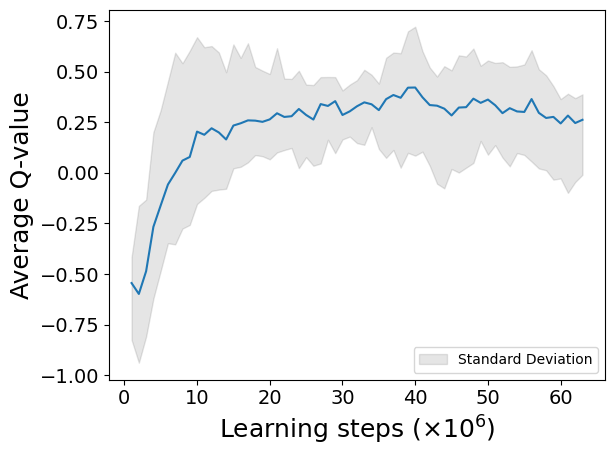

model updated


2024-07-22 04:46:22.668445: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:08:05.388523: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:22:50.895204: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:27:02.030505: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:27:32.648794: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:38:29.180964: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6436.3

average moving queuetime :  44.9 74.0
average stay queuetime :  0.5 0.9
average total queuetime :  45.5 74.9
average chargecount :  1.6 1.6
average ordercount :  41.9 41.9
day : 1


2024-07-22 05:47:19.861264: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


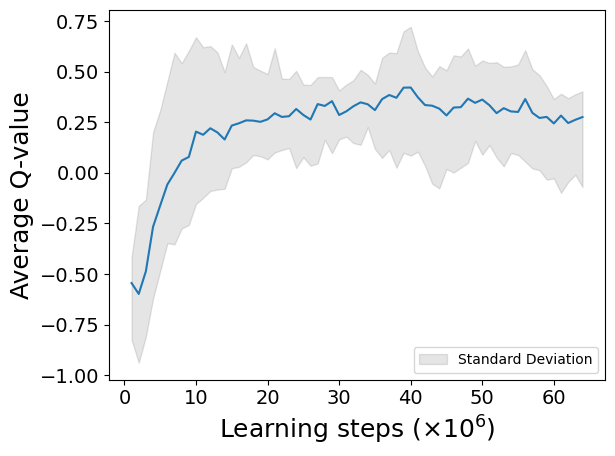

model updated


2024-07-22 06:31:36.896798: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 06:33:41.641502: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 06:45:19.936164: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 06:49:08.712053: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


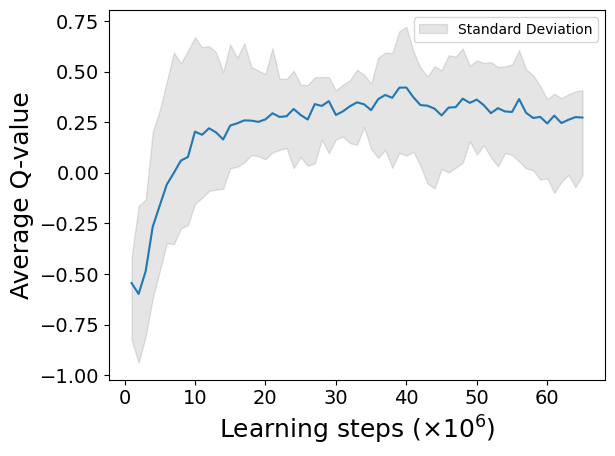

model updated


2024-07-22 07:17:15.028600: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 07:18:52.268830: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 07:27:35.560693: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6685.6

average moving queuetime :  56.3 125.0
average stay queuetime :  10.1 35.0
average total queuetime :  66.4 159.9
average chargecount :  1.8 1.9
average ordercount :  42.0 42.1
day : 2


2024-07-22 07:41:24.489526: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 07:41:29.760053: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:32:56.517548: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


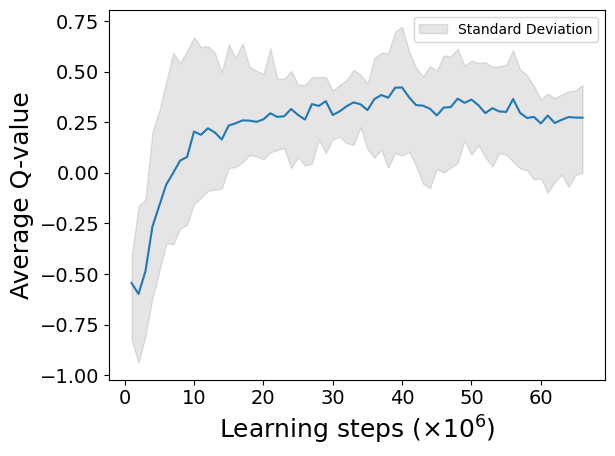

model updated


2024-07-22 08:44:03.695422: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:16:48.489192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6692.1

average moving queuetime :  60.2 126.1
average stay queuetime :  7.2 3.0
average total queuetime :  67.4 129.1
average chargecount :  1.8 1.9
average ordercount :  42.0 42.0
day : 3


2024-07-22 09:28:31.241299: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:32:05.594566: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:52:48.028336: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:53:41.157622: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


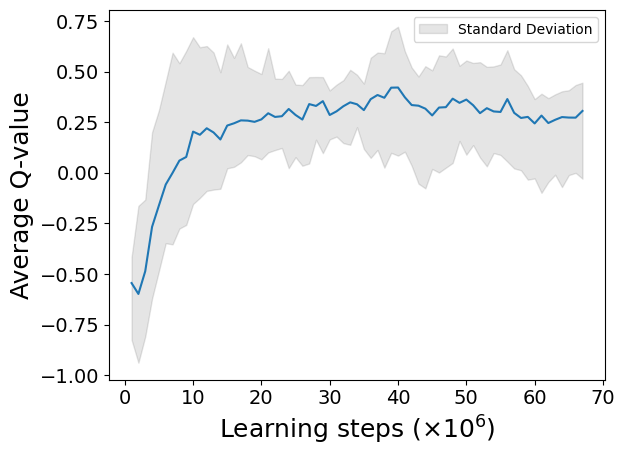

model updated


2024-07-22 10:58:04.374047: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:02:11.058349: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6645.3

average moving queuetime :  65.3 148.8
average stay queuetime :  23.2 129.1
average total queuetime :  88.5 277.9
average chargecount :  1.8 1.9
average ordercount :  42.0 41.8
[33, 23, 12, 68, 52, 46, 30, 69, 72, 48, 29, 12]
[58, 52, 60, 35, 53, 25, 66, 40, 67, 60, 32, 19]
[33, 68, 51, 50, 44, 49, 56, 46, 73, 54, 20, 15]
[35, 67, 49, 55, 41, 29, 65, 34, 62, 68, 28, 23]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.703387519652141
code start to now : 325162.8
episode_reward :  1672.3358366481166
fit_count :  679509
TD max = 1.194422594874818 TD min = 0.00010028938055038342

episode 17
day : 0


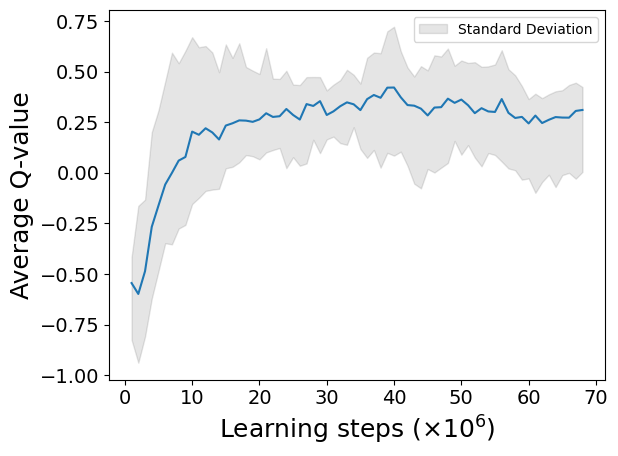

model updated


2024-07-22 11:19:39.521119: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:21:24.248839: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:35:23.668611: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:11:56.200225: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:20:29.227156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:25:15.565888: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


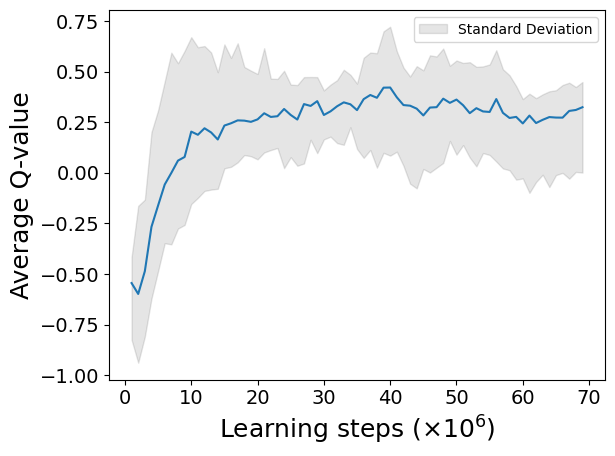

model updated


2024-07-22 12:51:07.292601: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:59:42.512059: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6482.5

average moving queuetime :  71.4 112.1
average stay queuetime :  78.3 122.9
average total queuetime :  149.7 235.0
average chargecount :  1.6 1.6
average ordercount :  41.8 41.8
day : 1


2024-07-22 13:28:38.289777: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


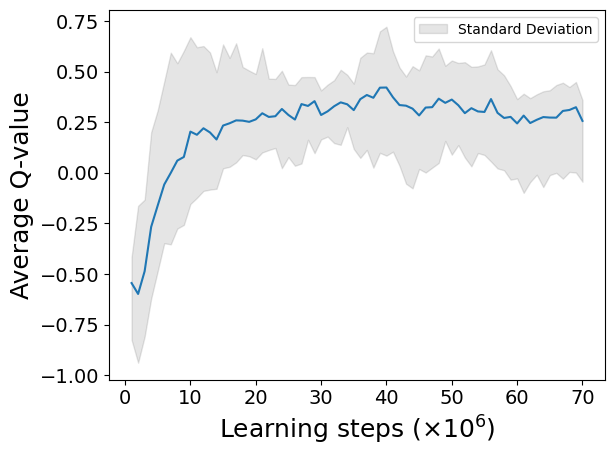

model updated


2024-07-22 14:28:45.941502: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:29:24.969215: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:29:49.069990: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:34:54.157077: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:38:38.340707: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:48:52.600715: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6759.0

average moving queuetime :  67.3 120.3
average stay queuetime :  42.5 24.0
average total queuetime :  109.7 144.3
average chargecount :  1.7 1.9
average ordercount :  41.8 41.8
day : 2


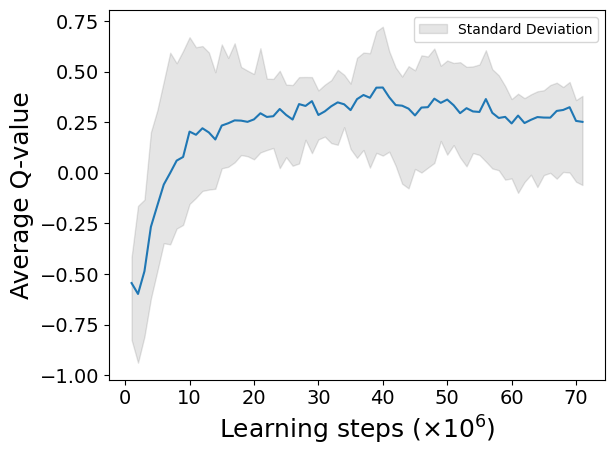

model updated


2024-07-22 15:39:38.683915: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:24:23.267281: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:36:06.161322: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


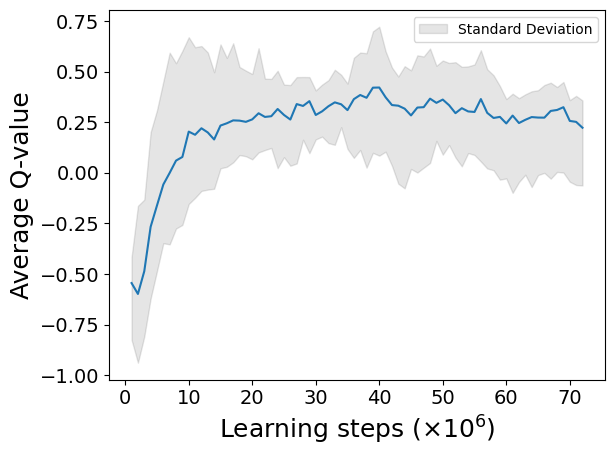

model updated

 time for simulate one day : 6681.1

average moving queuetime :  68.7 130.2
average stay queuetime :  37.9 53.3
average total queuetime :  106.6 183.5
average chargecount :  1.8 1.8
average ordercount :  41.9 42.0
day : 3


2024-07-22 17:05:02.473856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:11:45.732209: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:15:34.251589: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:16:16.032244: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:18:18.409518: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:58:06.341330: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 18:03:05.261141: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


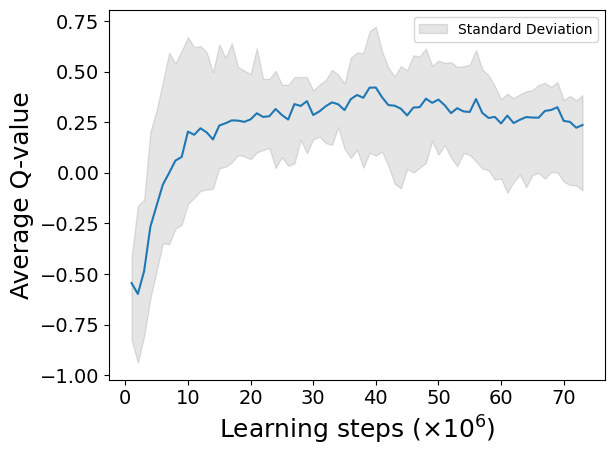

model updated

 time for simulate one day : 6625.5

average moving queuetime :  66.1 109.6
average stay queuetime :  31.6 25.5
average total queuetime :  97.7 135.1
average chargecount :  1.8 1.9
average ordercount :  41.9 41.9
[25, 25, 11, 9, 58, 69, 28, 41, 71, 75, 34, 25]
[60, 46, 56, 28, 28, 73, 23, 80, 44, 55, 34, 39]
[52, 54, 46, 22, 69, 35, 33, 51, 54, 55, 59, 17]
[53, 53, 39, 62, 44, 23, 68, 39, 69, 64, 23, 22]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.744959394230092
code start to now : 351727.6
episode_reward :  1660.9903946600868
fit_count :  733987
TD max = 1.1265305114746094 TD min = 0.00010008583068844548

episode 18
day : 0


2024-07-22 19:06:42.659041: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 19:12:27.052930: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 19:16:03.963456: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


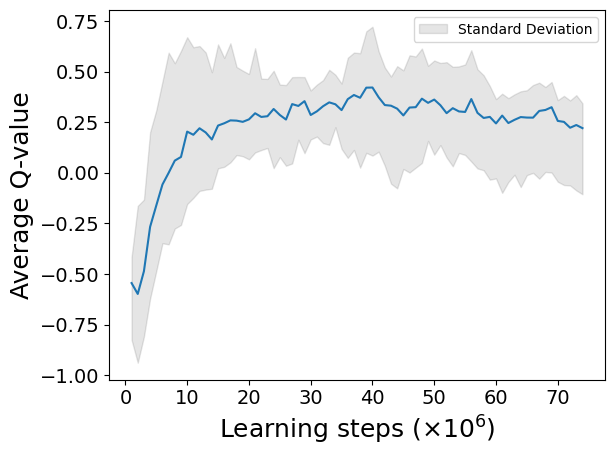

model updated


2024-07-22 19:34:29.112128: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 20:07:58.677154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6462.6

average moving queuetime :  68.2 108.3
average stay queuetime :  20.7 32.9
average total queuetime :  89.0 141.2
average chargecount :  1.6 1.6
average ordercount :  41.9 41.9
day : 1


2024-07-22 20:34:26.481194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


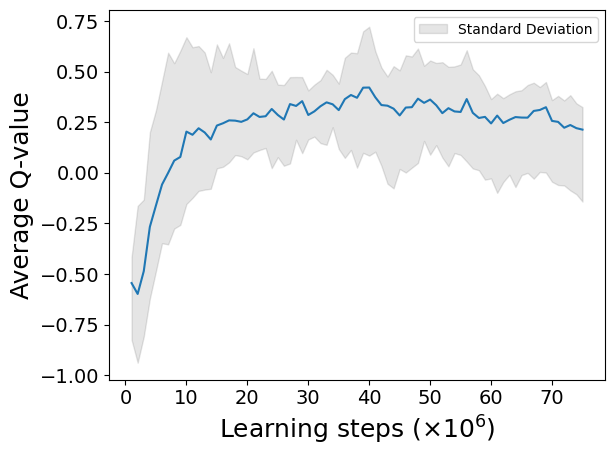

model updated


2024-07-22 20:59:24.752737: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 21:23:53.751896: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 21:41:48.861185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


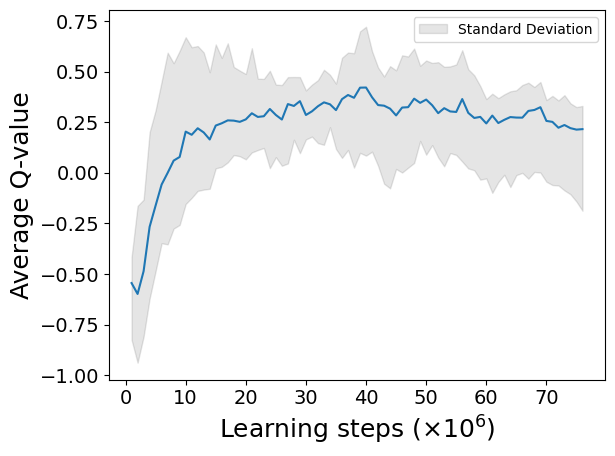

model updated

 time for simulate one day : 6665.1

average moving queuetime :  69.0 121.6
average stay queuetime :  29.8 66.5
average total queuetime :  98.8 188.1
average chargecount :  1.7 1.7
average ordercount :  42.0 42.0
day : 2


2024-07-22 22:18:34.092597: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:45:28.247150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:48:36.541174: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:08:24.731200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:15:49.869085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


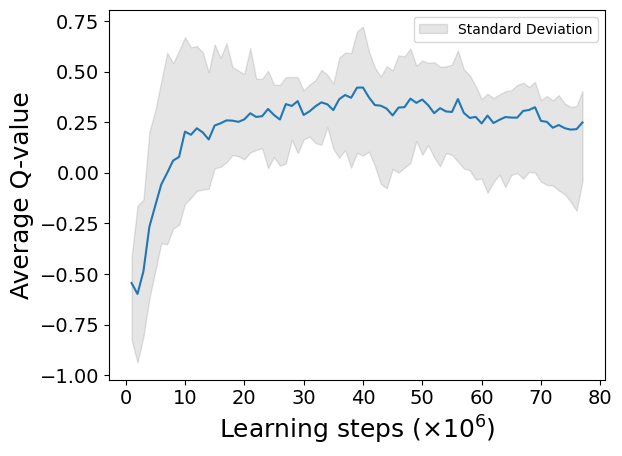

model updated


2024-07-22 23:44:05.939089: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:47:58.932731: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:48:07.924095: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:52:04.567856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:01:53.219277: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6735.0

average moving queuetime :  66.7 121.7
average stay queuetime :  23.3 23.3
average total queuetime :  90.0 145.1
average chargecount :  1.8 1.9
average ordercount :  42.1 42.3
day : 3


2024-07-23 00:26:18.451137: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:30:34.718293: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:30:35.487879: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:39:38.207838: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:42:38.490662: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:46:20.749702: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


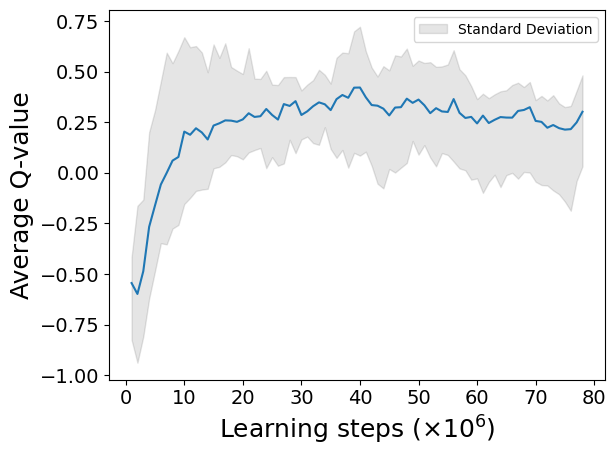

model updated


2024-07-23 01:26:34.591162: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 01:47:01.470745: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6616.9

average moving queuetime :  65.1 111.2
average stay queuetime :  23.7 45.7
average total queuetime :  88.8 156.8
average chargecount :  1.8 1.8
average ordercount :  42.0 42.0
[29, 23, 8, 12, 42, 65, 33, 62, 71, 45, 67, 19]
[39, 47, 39, 41, 63, 21, 52, 47, 74, 42, 47, 12]
[63, 53, 37, 46, 32, 66, 42, 54, 70, 44, 63, 11]
[43, 63, 39, 43, 53, 47, 41, 41, 71, 43, 48, 20]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.6823377318832735
code start to now : 378224.1
episode_reward :  1652.819025832283
fit_count :  788615
TD max = 1.1265305114746094 TD min = 0.00010008583068844548

episode 19
day : 0


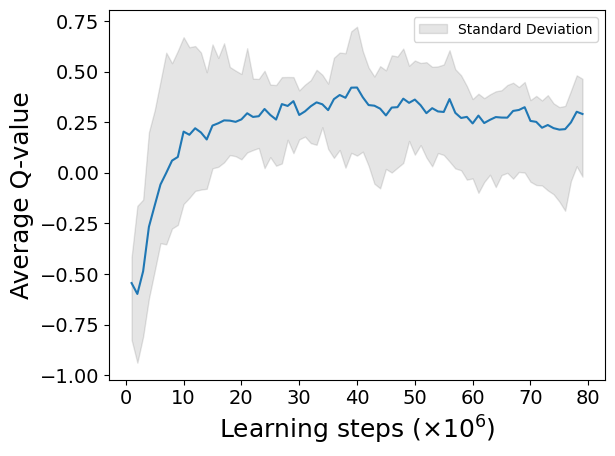

model updated


2024-07-23 02:31:34.546470: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:47:33.491769: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:01:49.350997: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:05:57.220251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:21:17.501537: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:21:38.962853: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:31:48.889374: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


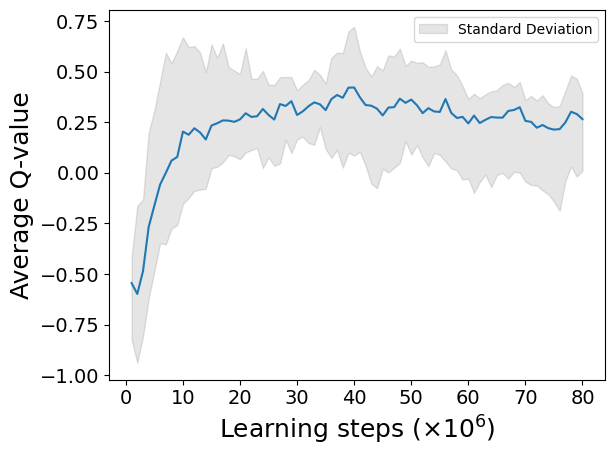

model updated


2024-07-23 03:35:15.424610: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6605.0

average moving queuetime :  80.2 121.1
average stay queuetime :  29.0 43.8
average total queuetime :  109.2 164.9
average chargecount :  1.5 1.5
average ordercount :  42.1 42.1
day : 1


2024-07-23 03:51:12.783959: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:58:09.232137: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:15:50.896470: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:37:55.595387: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:44:54.011173: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:50:10.444736: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


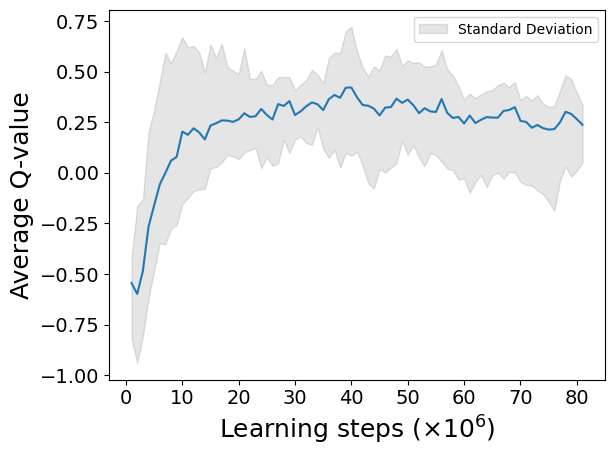

model updated


2024-07-23 05:07:22.013932: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:08:55.276195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:09:14.830474: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:15:29.417697: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:18:17.514460: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:29:59.100852: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:35:50.707307: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:37:45.151215: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6645.5

average moving queuetime :  74.7 123.9
average stay queuetime :  36.1 74.7
average total queuetime :  110.8 198.6
average chargecount :  1.6 1.8
average ordercount :  42.0 42.0
day : 2


2024-07-23 05:40:43.297827: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:44:02.677707: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:54:02.854965: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


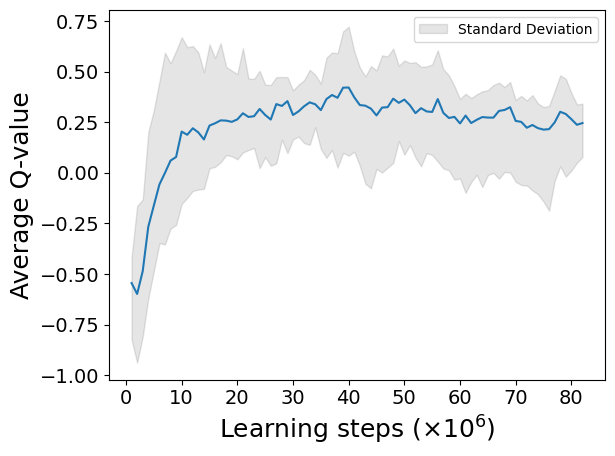

model updated


2024-07-23 06:32:28.720461: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:20:11.478899: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6655.4

average moving queuetime :  69.6 110.6
average stay queuetime :  23.9 3.4
average total queuetime :  93.5 114.0
average chargecount :  1.7 1.8
average ordercount :  42.1 42.2
day : 3


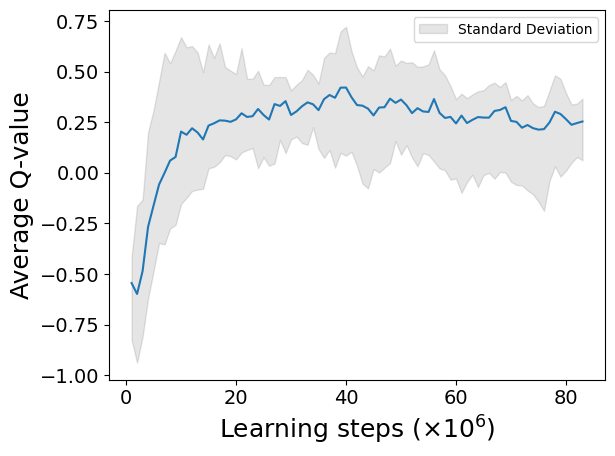

model updated


2024-07-23 07:51:18.490722: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:54:45.028758: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:37:15.358513: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:40:23.317641: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:46:34.528843: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:51:56.273311: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


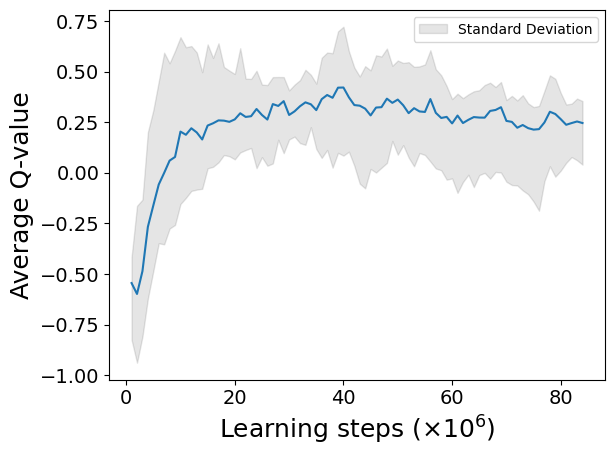

model updated


2024-07-23 08:57:40.371295: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6684.8

average moving queuetime :  66.7 108.4
average stay queuetime :  17.8 2.1
average total queuetime :  84.5 110.5
average chargecount :  1.7 1.8
average ordercount :  42.1 42.1
[21, 36, 3, 28, 5, 68, 38, 59, 64, 47, 64, 20]
[31, 58, 38, 43, 46, 46, 44, 39, 76, 59, 39, 12]
[38, 68, 29, 54, 52, 41, 54, 46, 54, 59, 36, 18]
[45, 60, 33, 49, 39, 51, 35, 54, 67, 41, 59, 21]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.716711997993182
code start to now : 404831.6
episode_reward :  1651.5564526703522
fit_count :  843218
TD max = 1.1581686569213867 TD min = 0.00010017523765566408

episode 20
day : 0


2024-07-23 10:07:15.498104: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 10:08:25.871084: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 10:14:37.396765: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


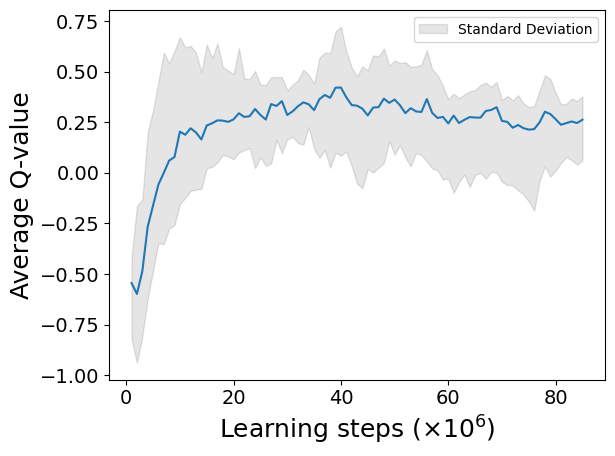

model updated


2024-07-23 10:25:40.747219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 10:37:50.207749: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6503.5

average moving queuetime :  68.0 119.5
average stay queuetime :  26.4 46.3
average total queuetime :  94.4 165.8
average chargecount :  1.8 1.8
average ordercount :  42.0 42.0
day : 1


2024-07-23 11:10:43.114148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


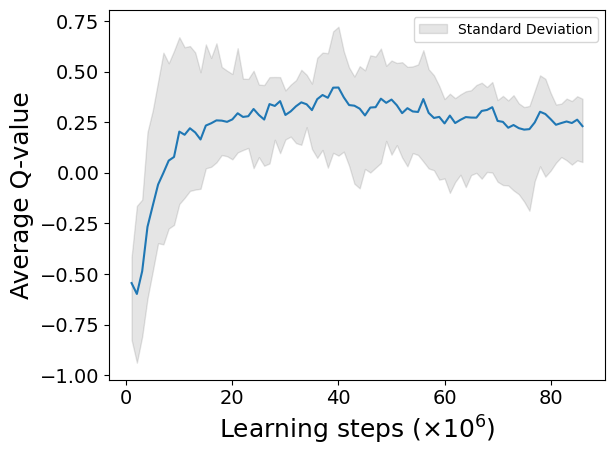

model updated


2024-07-23 12:01:09.000405: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:02:41.378032: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:04:14.911329: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:10:21.410982: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:12:52.808234: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


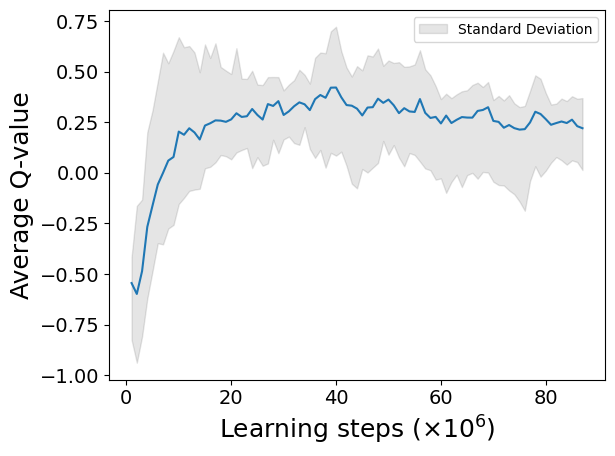

model updated

 time for simulate one day : 6588.8

average moving queuetime :  67.0 117.5
average stay queuetime :  46.8 119.1
average total queuetime :  113.8 236.6
average chargecount :  1.8 1.8
average ordercount :  41.8 41.6
day : 2


2024-07-23 13:05:55.941185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:21:56.411229: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:26:47.063307: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:30:34.951177: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:19:25.549688: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


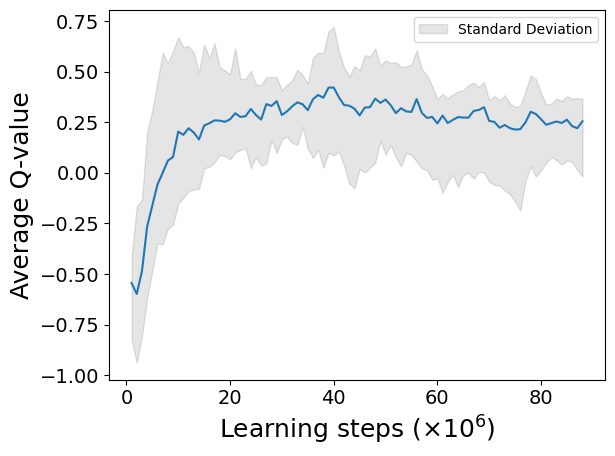

model updated


2024-07-23 14:38:38.437201: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6648.4

average moving queuetime :  67.0 117.0
average stay queuetime :  34.8 18.8
average total queuetime :  101.8 135.8
average chargecount :  1.8 1.8
average ordercount :  41.9 42.0
day : 3


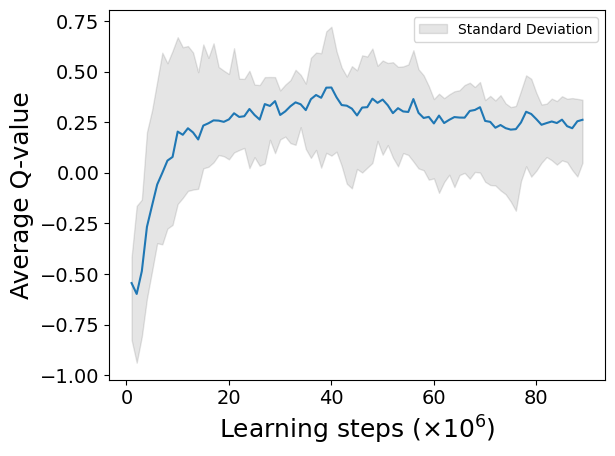

model updated


2024-07-23 15:42:14.871070: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:01:00.831253: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:14:28.109760: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:27:29.391148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:27:47.592038: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:36:23.649902: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6703.2

average moving queuetime :  64.1 102.5
average stay queuetime :  26.1 1.9
average total queuetime :  90.2 104.4
average chargecount :  1.8 1.8
average ordercount :  41.9 42.1
[23, 56, 39, 40, 48, 58, 44, 25, 67, 59, 42, 26]
[52, 57, 40, 37, 32, 54, 25, 54, 56, 59, 49, 19]
[70, 32, 20, 31, 68, 34, 46, 63, 57, 50, 38, 16]
[72, 41, 51, 30, 39, 63, 39, 56, 54, 55, 40, 12]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.733410782769335
code start to now : 431292.3
episode_reward :  1669.1687681555238
fit_count :  897690
TD max = 1.1581686569213867 TD min = 0.00010017523765566408

episode 21
day : 0


2024-07-23 16:49:50.803404: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:53:41.340622: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:53:55.761253: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:57:05.591820: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


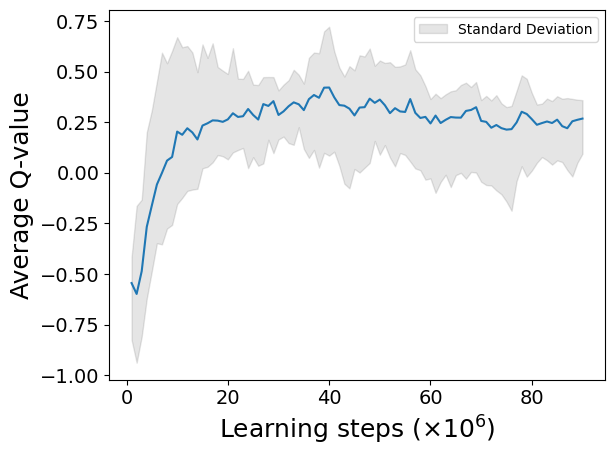

model updated


2024-07-23 17:15:17.606208: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:16:55.671196: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:17:45.331169: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:21:09.769045: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:07:43.675582: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:11:43.771301: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:13:14.753094: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:13:34.075089: W tensorflow/core/data/root_dataset.cc:24

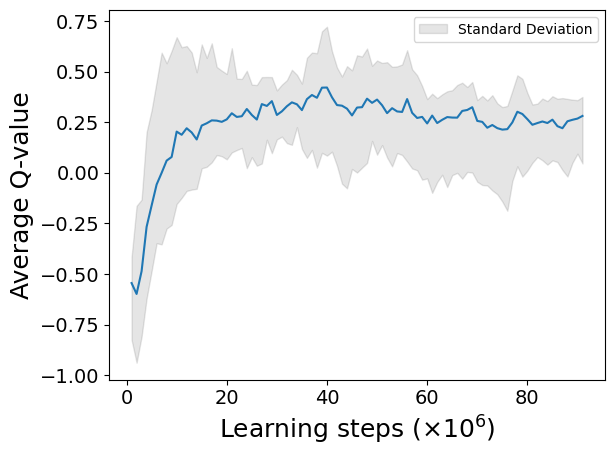

model updated

 time for simulate one day : 6599.4

average moving queuetime :  71.7 108.0
average stay queuetime :  77.6 117.0
average total queuetime :  149.3 225.0
average chargecount :  1.5 1.5
average ordercount :  42.1 42.1
day : 1


2024-07-23 18:52:54.563698: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:57:27.539354: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:07:06.954778: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:11:48.851579: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:14:20.280902: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:14:43.010815: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:17:39.131160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:46:06.258070: W tensorflow/core/data/root_dataset.cc:24

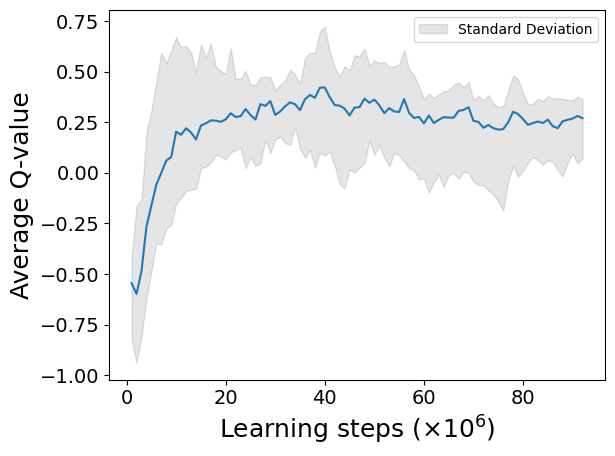

model updated

 time for simulate one day : 6654.0

average moving queuetime :  66.3 105.7
average stay queuetime :  39.0 9.0
average total queuetime :  105.3 114.7
average chargecount :  1.6 1.7
average ordercount :  42.0 41.9
day : 2


2024-07-23 20:25:39.776185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:31:41.881273: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:34:21.379847: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:45:55.497586: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


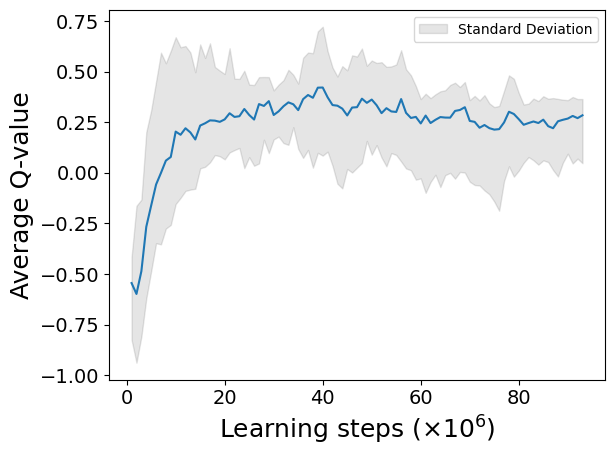

model updated


2024-07-23 21:15:49.561196: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:19:40.417251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:20:41.587685: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:25:34.270750: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:29:08.741009: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:32:51.636096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:40:01.728428: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:49:07.361161: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6602.8

average moving queuetime :  68.3 125.2
average stay queuetime :  33.3 39.4
average total queuetime :  101.6 164.6
average chargecount :  1.7 1.7
average ordercount :  42.0 41.9
day : 3


2024-07-23 22:25:06.011145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


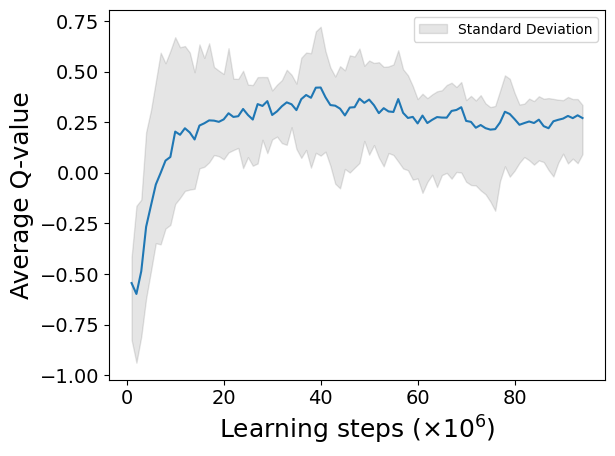

model updated


2024-07-23 22:34:19.221400: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 22:53:45.031192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 22:59:09.191183: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:02:01.650471: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:19:19.391599: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:36:29.911151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:37:15.788575: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:39:55.531158: W tensorflow/core/data/root_dataset.cc:24

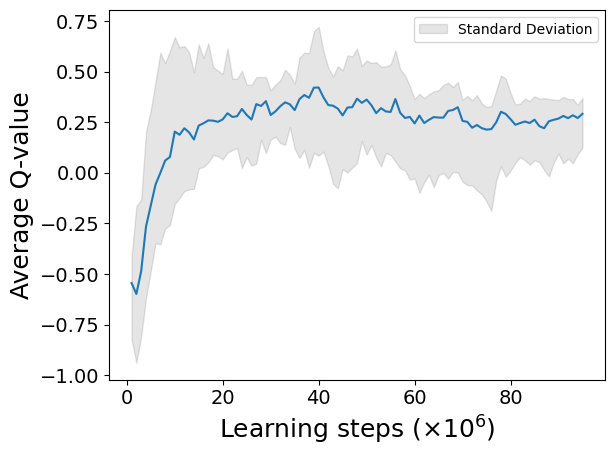

model updated


2024-07-23 23:55:44.756251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6628.5

average moving queuetime :  71.9 144.8
average stay queuetime :  48.4 160.4
average total queuetime :  120.2 305.2
average chargecount :  1.7 1.8
average ordercount :  41.9 41.8
[27, 24, 10, 13, 44, 56, 22, 66, 48, 66, 51, 25]
[23, 41, 50, 38, 59, 35, 59, 29, 67, 54, 49, 12]
[52, 44, 44, 45, 40, 24, 65, 38, 63, 66, 26, 14]
[36, 61, 52, 48, 30, 27, 41, 55, 54, 61, 47, 19]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.735257037574319
code start to now : 457794.1
episode_reward :  1609.564908303587
fit_count :  952032
TD max = 1.1420696807861328 TD min = 0.00010034362077711015

episode 22
day : 0


2024-07-24 00:09:40.190332: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:14:17.895129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:22:46.758473: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:28:33.889962: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:28:55.431446: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:45:00.671188: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:08:23.181136: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:20:48.463387: W tensorflow/core/data/root_dataset.cc:24

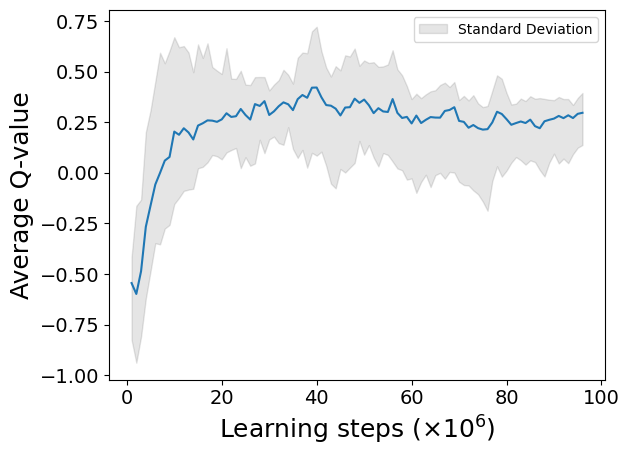

model updated


2024-07-24 01:30:18.646109: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:50:16.144783: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7517.2

average moving queuetime :  83.7 121.4
average stay queuetime :  172.7 250.3
average total queuetime :  256.4 371.8
average chargecount :  1.4 1.4
average ordercount :  41.8 41.8
day : 1


2024-07-24 02:19:16.908276: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:19:52.264288: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:31:23.129024: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:48:28.847027: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


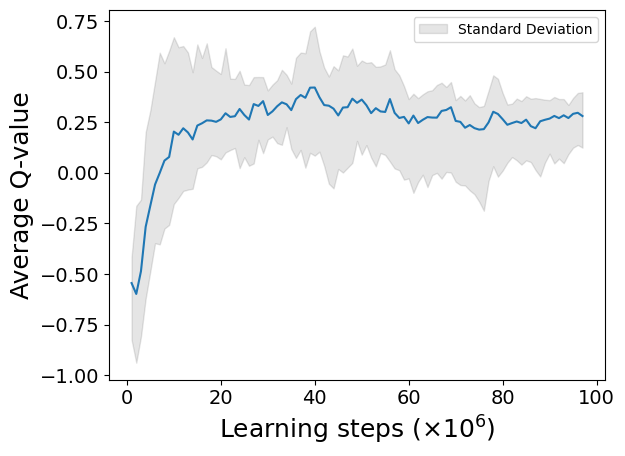

model updated


2024-07-24 03:02:48.619539: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:16.690863: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:27.716031: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:57.598190: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:40:45.267781: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:56:10.449463: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:59:47.641199: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6688.1

average moving queuetime :  75.2 123.4
average stay queuetime :  82.9 19.6
average total queuetime :  158.0 142.9
average chargecount :  1.6 1.8
average ordercount :  41.9 42.0
day : 2


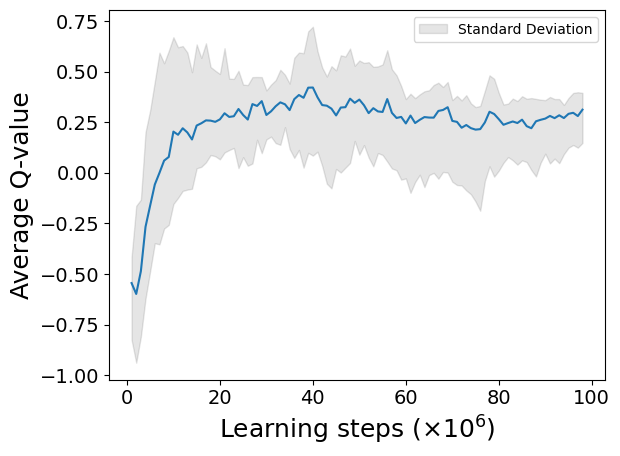

model updated


2024-07-24 04:10:20.569547: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 04:14:20.148623: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 04:21:47.744652: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 04:22:48.561205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 04:55:58.081322: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:06:46.121190: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


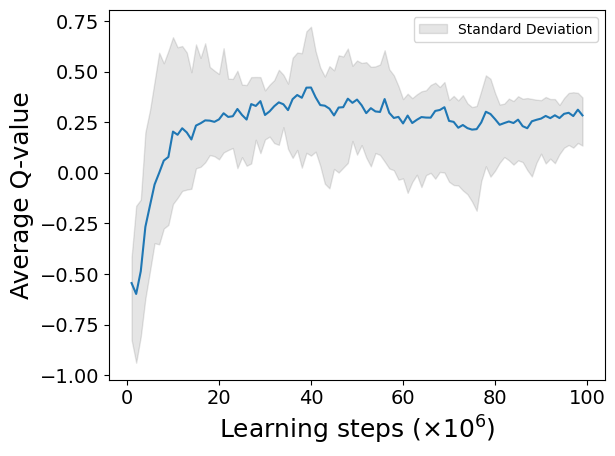

model updated


2024-07-24 05:35:55.848775: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:53:40.471242: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6724.3

average moving queuetime :  71.1 111.8
average stay queuetime :  54.3 2.4
average total queuetime :  125.4 114.2
average chargecount :  1.7 1.8
average ordercount :  42.0 42.1
day : 3


2024-07-24 06:25:20.781277: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:29:51.996784: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:35:37.971213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:48:19.168204: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:53:03.540738: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


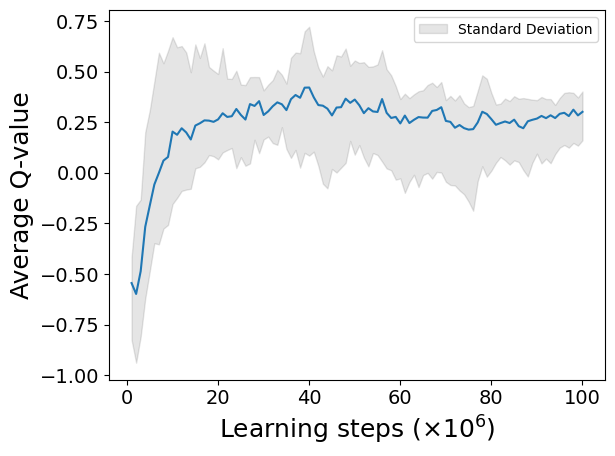

2024-07-24 07:04:41.411331: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:05:25.227761: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:35:14.721143: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:37:01.958094: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:39:15.407793: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6778.0

average moving queuetime :  69.2 115.1
average stay queuetime :  41.2 9.0
average total queuetime :  110.4 124.0
average chargecount :  1.7 1.8
average ordercount :  42.0 42.0
[38, 16, 6, 8, 23, 56, 37, 55, 61, 53, 62, 20]
[37, 45, 51, 42, 35, 60, 32, 68, 46, 57, 48, 21]
[26, 39, 58, 39, 53, 54, 36, 63, 41, 68, 31, 19]
[39, 49, 47, 53, 41, 52, 32, 52, 60, 67, 31, 19]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.751774938889113
code start to now : 485518.6
episode_reward :  1652.4986530621409
fit_count :  1006502
TD max = 1.1413330865859985 TD min = 0.00010003457069386315
model updated

episode 23
day : 0


2024-07-24 07:56:27.644255: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 08:08:48.396991: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


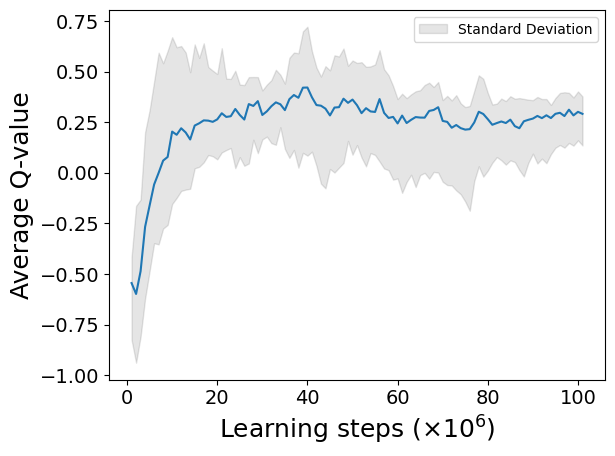

2024-07-24 08:25:48.977882: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 08:27:06.861145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 08:42:53.456449: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 08:50:38.722171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:04:56.931254: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:14:04.341565: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6523.2

average moving queuetime :  61.6 93.2
average stay queuetime :  3.1 4.7
average total queuetime :  64.7 98.0
average chargecount :  1.5 1.5
average ordercount :  42.1 42.1
day : 1


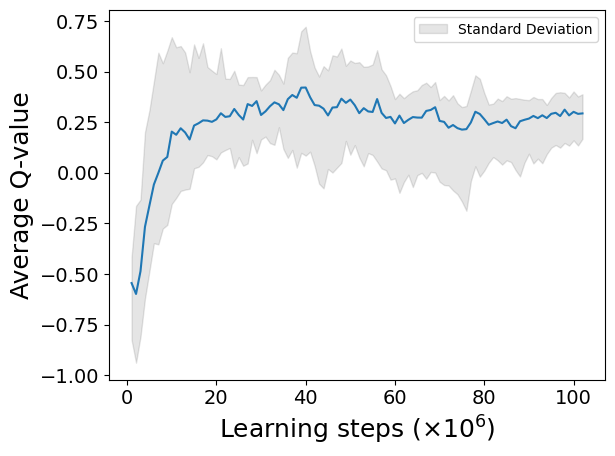

2024-07-24 09:37:22.107658: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:58:13.527649: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 10:18:47.214313: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 10:44:33.585504: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


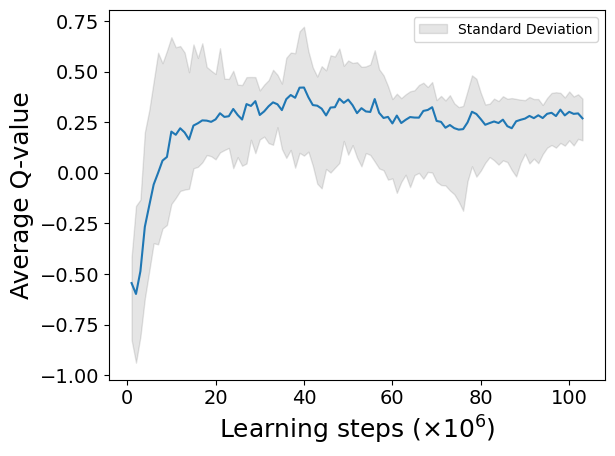

2024-07-24 11:11:07.983860: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:19:57.721241: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6678.6

average moving queuetime :  61.4 108.2
average stay queuetime :  5.6 13.5
average total queuetime :  66.9 121.8
average chargecount :  1.6 1.8
average ordercount :  42.0 42.0
day : 2


2024-07-24 12:10:30.229441: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:15:06.021396: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


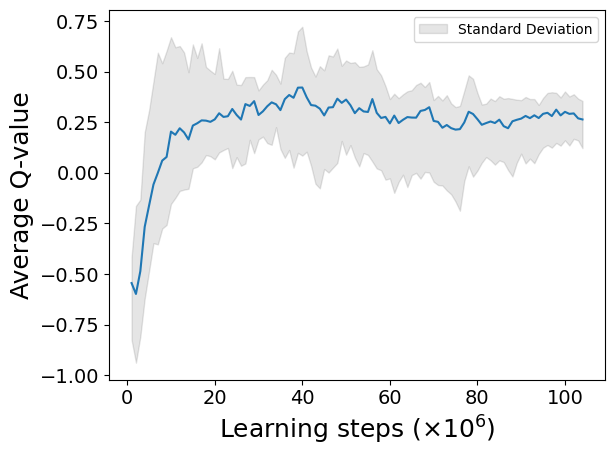

2024-07-24 12:25:08.288887: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:30:14.736149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:31:40.021210: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:41:12.678768: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:50:47.777924: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:52:04.471311: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:54:39.949724: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6669.5

average moving queuetime :  62.4 117.6
average stay queuetime :  5.0 7.3
average total queuetime :  67.4 124.8
average chargecount :  1.7 1.8
average ordercount :  42.1 42.2
day : 3


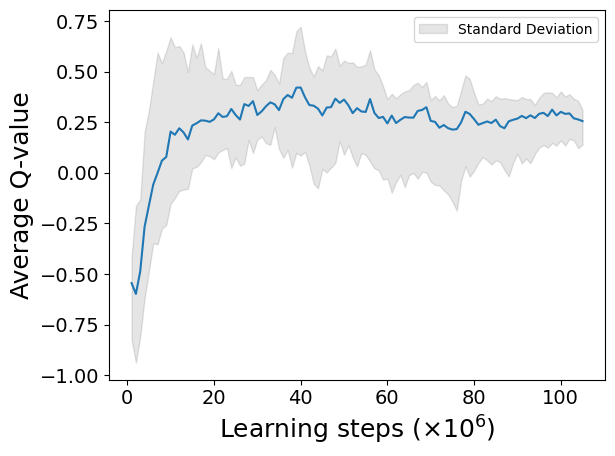

2024-07-24 14:09:37.200824: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:21:52.022828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:24:46.197461: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:54:46.869018: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


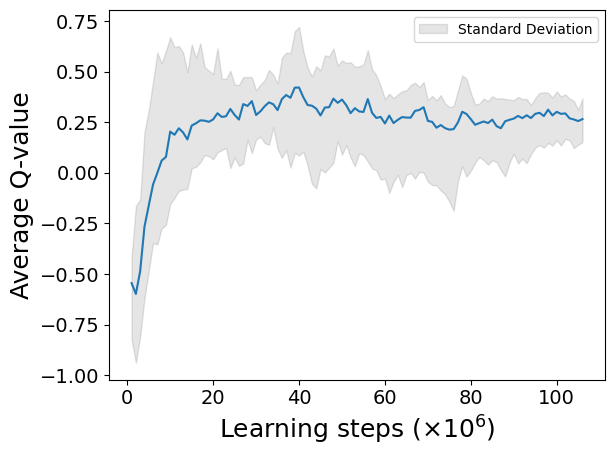

2024-07-24 15:04:03.847149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:08:02.331233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6669.9

average moving queuetime :  61.3 106.0
average stay queuetime :  4.1 2.9
average total queuetime :  65.4 108.8
average chargecount :  1.7 1.8
average ordercount :  42.1 41.9
[58, 2, 0, 26, 21, 71, 40, 48, 65, 47, 51, 25]
[73, 14, 55, 48, 35, 42, 36, 54, 61, 62, 37, 14]
[41, 53, 59, 44, 51, 34, 39, 56, 63, 55, 45, 8]
[48, 64, 36, 49, 31, 63, 56, 49, 52, 69, 17, 13]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.692311504763189
code start to now : 512076.8
episode_reward :  1710.6714335280028
fit_count :  1061080
TD max = 1.1544484926223755 TD min = 0.00010003457069386315
best model updated
model updated

episode 24
day : 0


2024-07-24 15:27:03.238504: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:27:12.811243: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:52:57.139447: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:11:38.572259: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:33:53.232616: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:37:09.426365: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


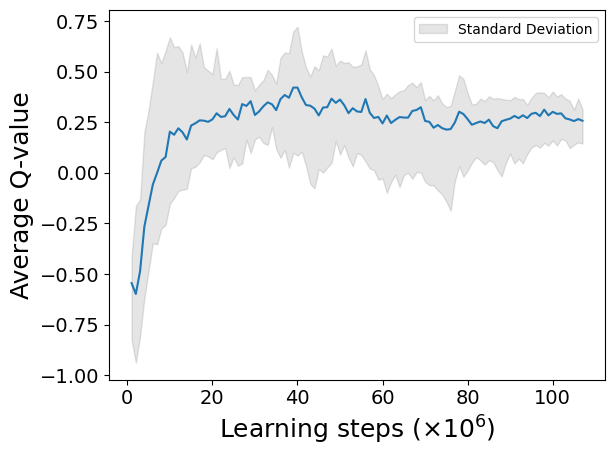

2024-07-24 16:45:09.886597: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:46:56.902939: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:55:34.239123: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:06:32.817038: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7546.3

average moving queuetime :  72.6 110.4
average stay queuetime :  20.3 30.8
average total queuetime :  92.9 141.2
average chargecount :  1.5 1.5
average ordercount :  42.1 42.1
day : 1


2024-07-24 17:19:24.534298: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:22:30.696264: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:24:17.227632: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:34:49.080349: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:52:14.732038: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


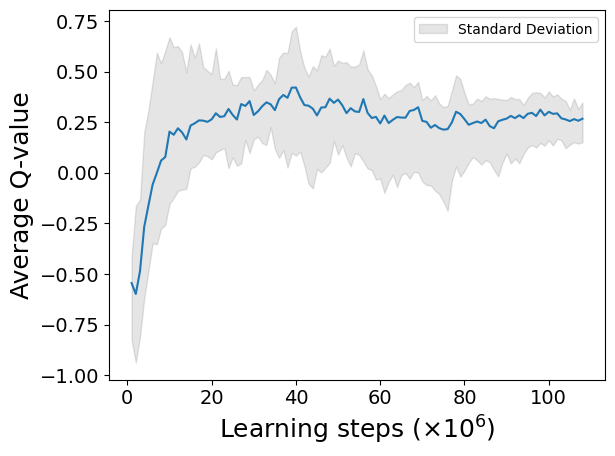

2024-07-24 18:11:02.112511: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 18:16:11.589485: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 18:29:34.901271: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 18:30:18.021589: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 18:43:20.234851: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 18:53:12.571187: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 18:59:25.837421: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:00:58.636834: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6621.5

average moving queuetime :  64.2 101.9
average stay queuetime :  12.3 10.0
average total queuetime :  76.5 111.9
average chargecount :  1.7 1.8
average ordercount :  42.0 42.0
day : 2


2024-07-24 19:15:58.539917: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:16:20.467277: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:16:39.456359: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:19:20.515416: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:19:43.970811: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:20:03.791161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


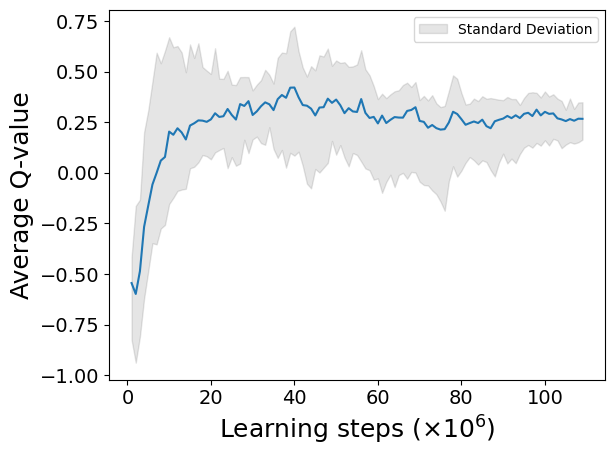

2024-07-24 19:43:32.681032: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:58:36.961310: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:00:43.851362: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:18:45.881240: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:21:30.551170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:27:28.679501: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


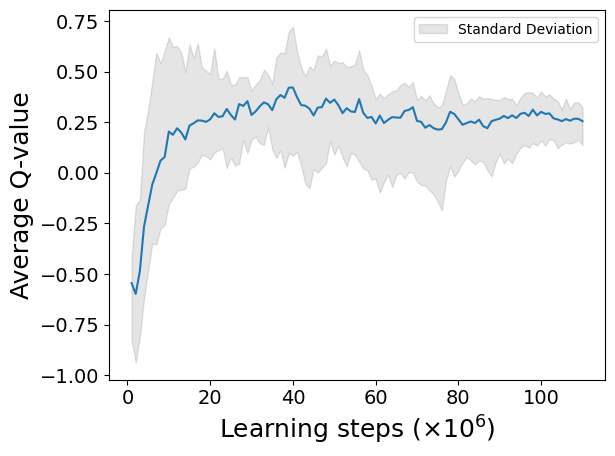


 time for simulate one day : 6809.9

average moving queuetime :  64.6 122.2
average stay queuetime :  13.2 27.7
average total queuetime :  77.8 150.0
average chargecount :  1.7 1.9
average ordercount :  42.1 42.1
day : 3


2024-07-24 21:00:14.964785: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 21:18:44.290980: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 21:42:15.118261: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 21:43:47.767677: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


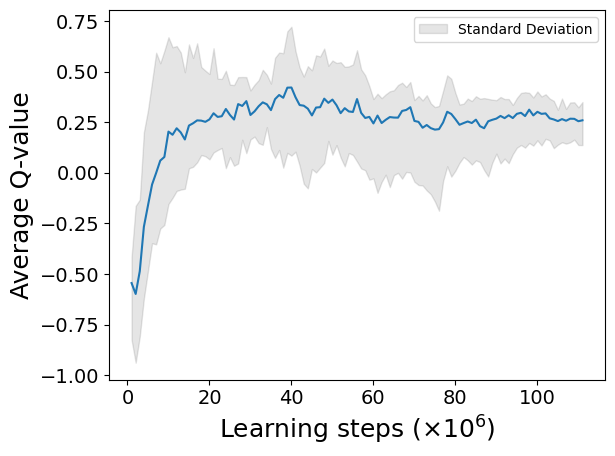

2024-07-24 22:14:54.141255: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:38:21.316627: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:41:31.860894: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6660.6

average moving queuetime :  63.3 107.3
average stay queuetime :  10.9 7.5
average total queuetime :  74.3 114.8
average chargecount :  1.7 1.8
average ordercount :  42.1 42.1
[54, 5, 1, 17, 24, 66, 52, 37, 77, 53, 46, 24]
[78, 26, 24, 43, 39, 63, 35, 63, 51, 54, 42, 18]
[88, 24, 35, 47, 33, 60, 51, 49, 66, 52, 52, 5]
[56, 34, 55, 39, 48, 42, 56, 69, 51, 46, 27, 15]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.6967095539751895
code start to now : 539731.6
episode_reward :  1706.309398303988
fit_count :  1115671
TD max = 1.1544484926223755 TD min = 0.00010020074556994488
model updated

episode 25
day : 0


2024-07-24 22:50:57.777443: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:59:54.558100: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


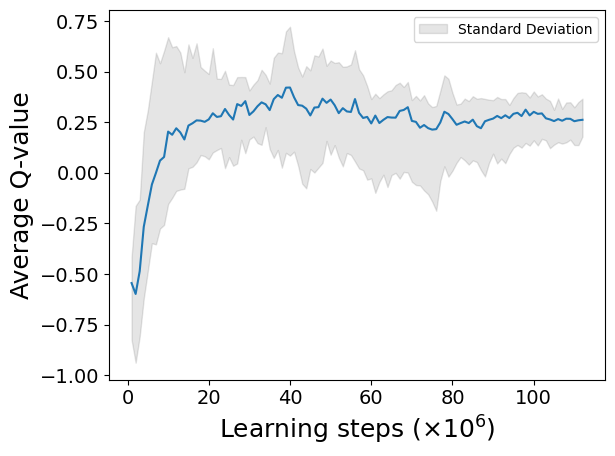

2024-07-24 23:32:15.639850: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 23:56:12.428543: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:01:50.446600: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:34:40.627203: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6519.8

average moving queuetime :  72.4 107.6
average stay queuetime :  33.5 49.8
average total queuetime :  105.9 157.5
average chargecount :  1.5 1.5
average ordercount :  42.0 42.0
day : 1


2024-07-25 00:40:06.641287: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


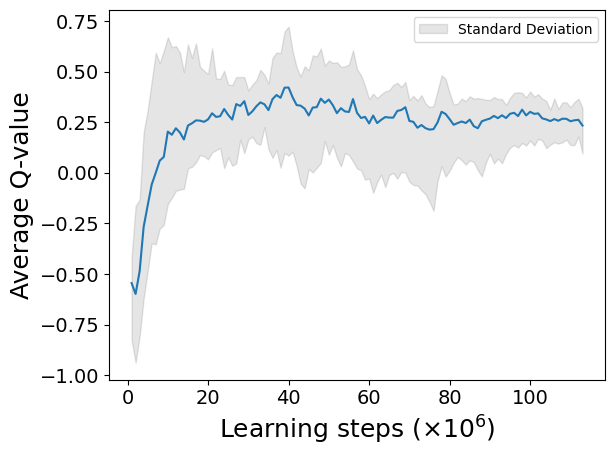

2024-07-25 00:58:12.483219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:05:26.981216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:08:35.737517: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:02:21.100499: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


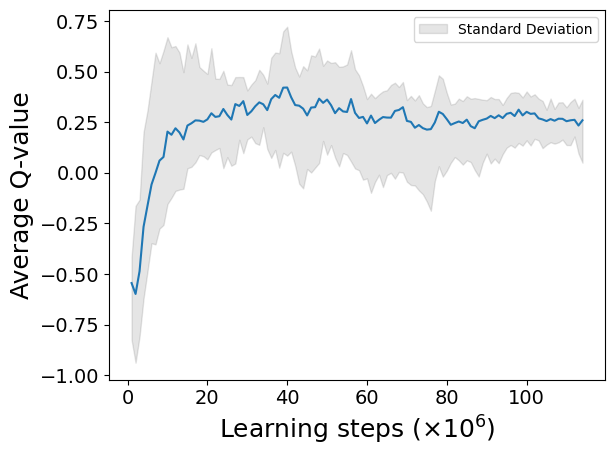

2024-07-25 02:14:53.040427: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:26:52.819487: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:27:51.991839: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6658.4

average moving queuetime :  66.4 113.8
average stay queuetime :  15.6 2.3
average total queuetime :  82.0 116.0
average chargecount :  1.7 1.9
average ordercount :  41.9 41.9
day : 2


2024-07-25 02:34:13.431299: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:42:51.172012: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:02:21.268283: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:04:55.599260: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:14:01.591111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:14:22.500859: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:20:04.044600: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:27:57.988538: W tensorflow/core/data/root_dataset.cc:24

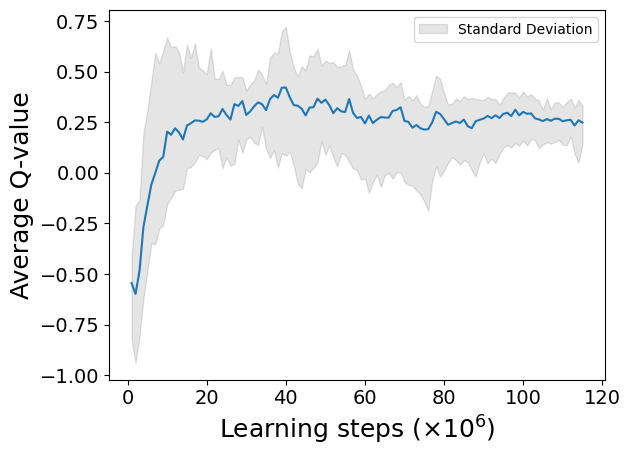

2024-07-25 03:33:17.371682: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:33:33.745926: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:02:05.121157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:02:50.301128: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:10:08.812860: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6709.4

average moving queuetime :  65.0 119.0
average stay queuetime :  10.5 2.7
average total queuetime :  75.5 121.8
average chargecount :  1.7 1.9
average ordercount :  42.0 42.1
day : 3


2024-07-25 04:27:52.671157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:48:04.430590: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


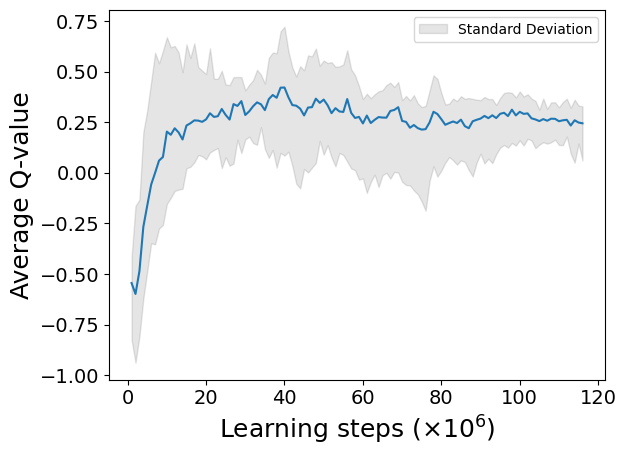

2024-07-25 04:57:34.445893: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:08:05.463054: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:11:17.264664: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:32:52.301132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:38:04.535612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:59:22.905062: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:03:45.411168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


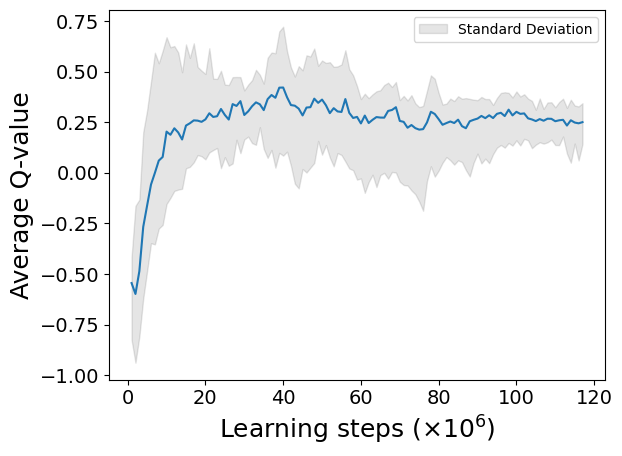


 time for simulate one day : 6681.3

average moving queuetime :  63.8 111.7
average stay queuetime :  7.8 0.4
average total queuetime :  71.6 112.1
average chargecount :  1.8 1.9
average ordercount :  42.1 42.3
[49, 10, 1, 24, 18, 54, 52, 52, 53, 59, 52, 22]
[57, 38, 36, 36, 55, 56, 48, 58, 58, 65, 36, 12]
[56, 37, 51, 43, 47, 51, 48, 65, 51, 46, 47, 28]
[54, 34, 47, 42, 39, 56, 47, 47, 57, 60, 40, 32]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.7069918236497985
code start to now : 566317.4
episode_reward :  1720.4239443662127
fit_count :  1170318
TD max = 1.1432297063827515 TD min = 0.00010041902065273103
best model updated
model updated

episode 26
day : 0


2024-07-25 06:27:17.596656: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:53:02.201215: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:02:55.121973: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:09:34.938343: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:11:39.465919: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:15:42.661160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:29:58.115562: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


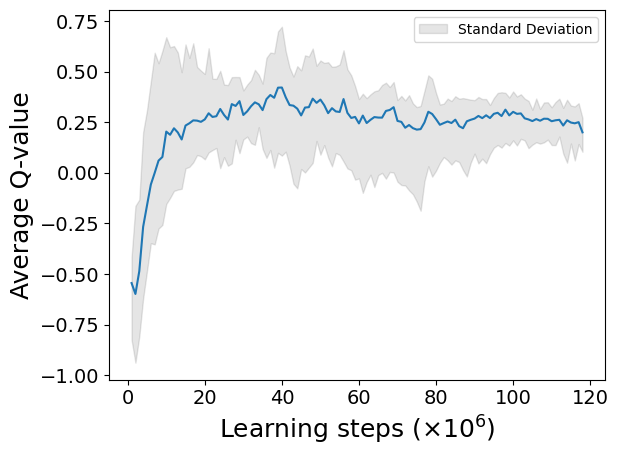

2024-07-25 07:54:07.609076: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6372.2

average moving queuetime :  99.3 141.6
average stay queuetime :  285.0 406.6
average total queuetime :  384.3 548.2
average chargecount :  1.4 1.4
average ordercount :  41.5 41.5
day : 1


2024-07-25 08:01:52.686779: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:05:48.409143: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:39:49.728821: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:49:52.767341: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:49:56.419367: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


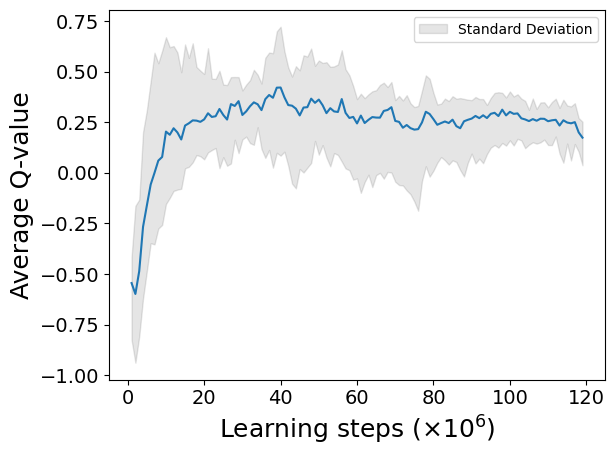

2024-07-25 09:07:15.451143: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 09:44:04.951215: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6623.7

average moving queuetime :  83.8 128.1
average stay queuetime :  189.9 204.4
average total queuetime :  273.8 332.5
average chargecount :  1.6 1.8
average ordercount :  41.6 41.7
day : 2


2024-07-25 09:59:22.271316: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:13:04.309969: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


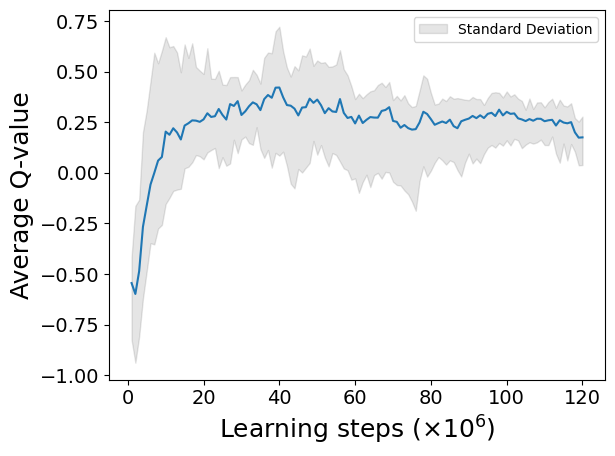

2024-07-25 11:12:31.210048: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:14:45.491155: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:20:41.211226: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:32:50.015415: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


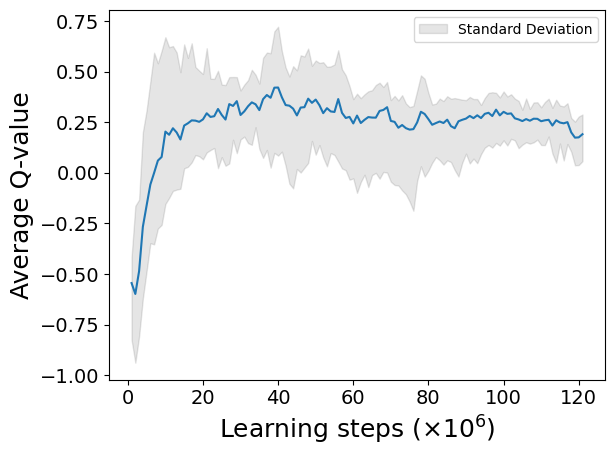


 time for simulate one day : 6795.7

average moving queuetime :  77.2 118.7
average stay queuetime :  129.1 38.4
average total queuetime :  206.3 157.1
average chargecount :  1.7 1.8
average ordercount :  41.7 41.8
day : 3


2024-07-25 12:28:33.037084: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:34:30.822650: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:39:06.501171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:39:46.571170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:51:05.801727: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:53:24.429189: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:55:39.078998: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


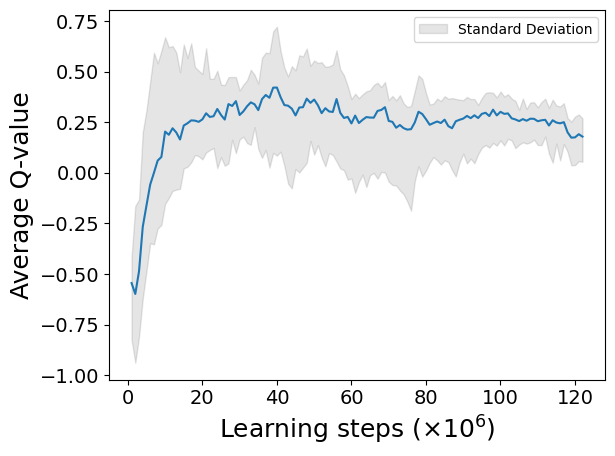


 time for simulate one day : 6643.7

average moving queuetime :  77.1 142.0
average stay queuetime :  112.5 124.2
average total queuetime :  189.6 266.2
average chargecount :  1.7 1.8
average ordercount :  41.8 42.0
[49, 10, 2, 14, 11, 39, 52, 56, 56, 62, 51, 26]
[88, 32, 17, 34, 29, 46, 38, 63, 45, 63, 60, 22]
[78, 35, 20, 30, 51, 35, 54, 53, 60, 44, 64, 20]
[90, 28, 30, 27, 33, 57, 38, 59, 52, 55, 56, 29]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.83356759629519
code start to now : 592770.1
episode_reward :  1503.098258711334
fit_count :  1224560
TD max = 1.2220784696372744 TD min = 0.00010041902065273103
model updated

episode 27
day : 0


2024-07-25 13:44:22.468944: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:45:46.739309: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:29:17.490866: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


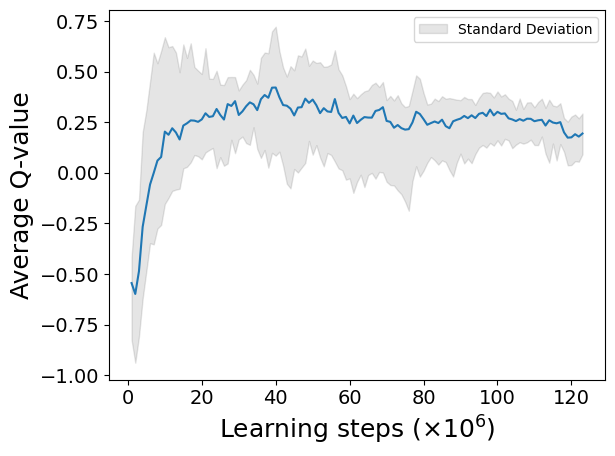

2024-07-25 15:03:38.006450: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:04:48.586647: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:09:13.109509: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:26:29.954519: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:28:11.794285: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:37:38.600475: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7581.7

average moving queuetime :  61.2 96.4
average stay queuetime :  40.1 63.0
average total queuetime :  101.3 159.4
average chargecount :  1.6 1.6
average ordercount :  41.9 41.9
day : 1
so long waited in  7
day start to termianl : 3980.7

 time for simulate one day : 465.1
so long waited in  29
day start to termianl : 3980.7

average moving queuetime :  60.7 20.5
average stay queuetime :  56.9 46.4
average total queuetime :  117.7 66.9
average chargecount :  1.0 0.3
average ordercount :  21.8 1.8
[60, 0, 1, 31, 29, 50, 43, 67, 54, 54, 51, 32]
[98, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.639986996169779
code start to now : 600825.8
episode_reward :  500.9448310938014
fit_count :  1238824
TD max = 1.4092362199187278 TD min = 0.00010041902065273103
model updated

episode 28
day : 0


2024-07-25 15:49:12.861165: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:59:41.879463: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:05:14.621195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:15:16.871144: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


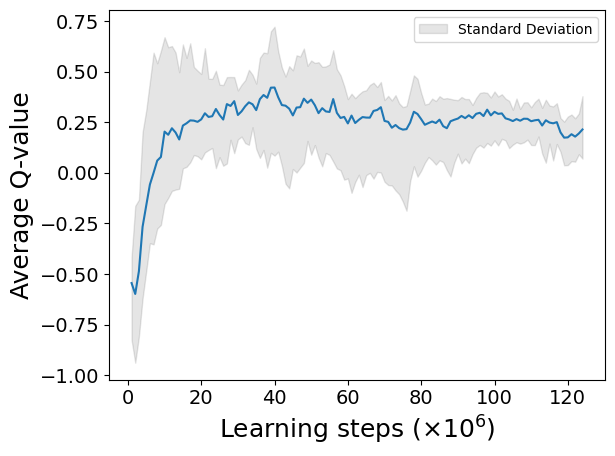

2024-07-25 16:53:51.586516: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:54:12.622831: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:08:34.789726: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:13:08.041187: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:34:02.643711: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


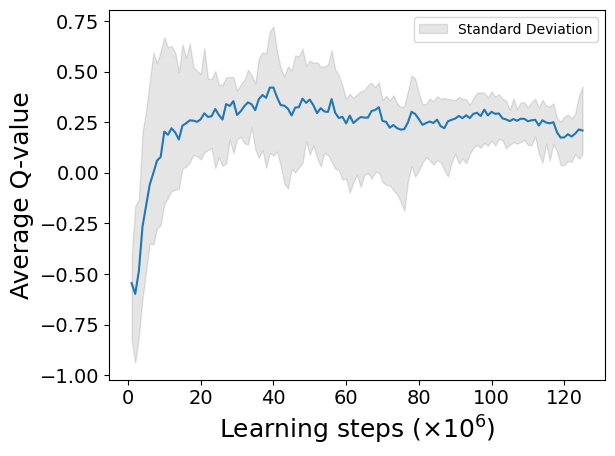


 time for simulate one day : 7618.4

average moving queuetime :  82.4 121.1
average stay queuetime :  81.4 119.6
average total queuetime :  163.8 240.8
average chargecount :  1.5 1.5
average ordercount :  42.0 42.0
day : 1


2024-07-25 18:04:27.465346: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:10:33.539023: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:10:57.821226: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:22:40.761195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:55:50.600460: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:58:08.310221: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


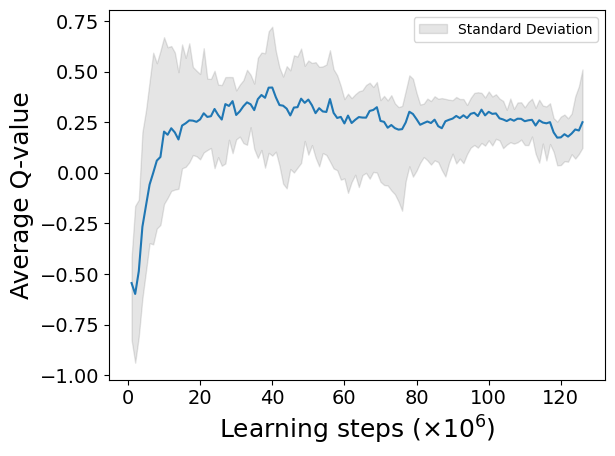

2024-07-25 19:03:25.139975: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 19:07:52.261462: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 19:10:52.762421: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 19:14:07.162410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 19:14:40.501356: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6722.3

average moving queuetime :  70.3 115.2
average stay queuetime :  37.8 7.5
average total queuetime :  108.1 122.7
average chargecount :  1.7 1.9
average ordercount :  42.0 42.1
day : 2


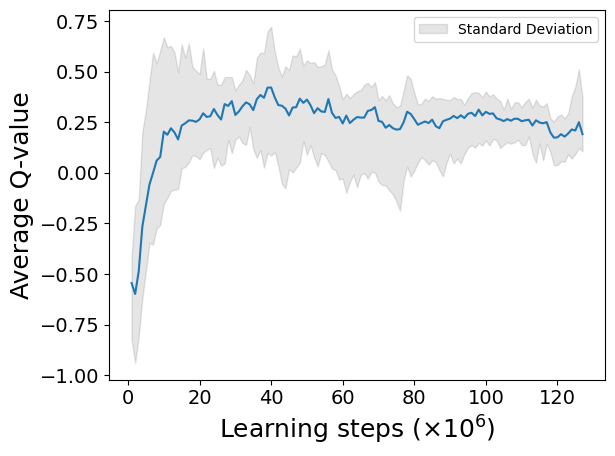

2024-07-25 20:34:33.865524: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:39:03.180530: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:18:58.319309: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:30:53.171118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:32:09.253947: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6670.0

average moving queuetime :  67.0 111.5
average stay queuetime :  39.7 78.9
average total queuetime :  106.7 190.3
average chargecount :  1.7 1.8
average ordercount :  42.0 42.0
day : 3


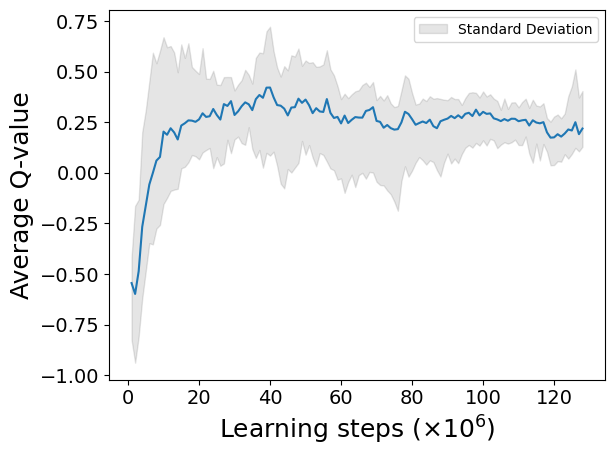

2024-07-25 21:54:05.242020: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:08:25.119391: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:57:02.834336: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


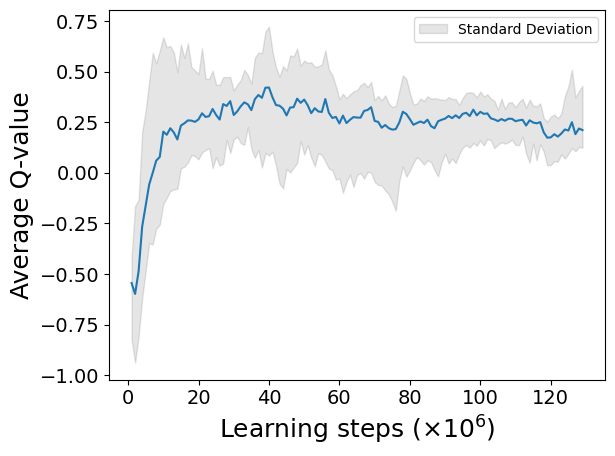

2024-07-25 23:19:47.050806: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 23:24:46.281288: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6625.6

average moving queuetime :  66.5 113.8
average stay queuetime :  30.5 6.1
average total queuetime :  97.0 119.9
average chargecount :  1.7 1.8
average ordercount :  42.0 41.9
[54, 3, 3, 12, 30, 41, 53, 49, 60, 57, 51, 28]
[82, 28, 24, 45, 43, 34, 59, 58, 46, 60, 43, 46]
[89, 12, 54, 24, 30, 55, 55, 36, 59, 66, 40, 28]
[74, 24, 32, 32, 50, 38, 50, 50, 58, 54, 49, 16]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.778623455321387
code start to now : 628478.6
episode_reward :  1669.0479152192624
fit_count :  1293353
TD max = 1.4092362199187278 TD min = 0.00010059902668003709
model updated

episode 29
day : 0


2024-07-25 23:30:27.479273: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 23:38:22.971270: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 23:58:28.805512: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


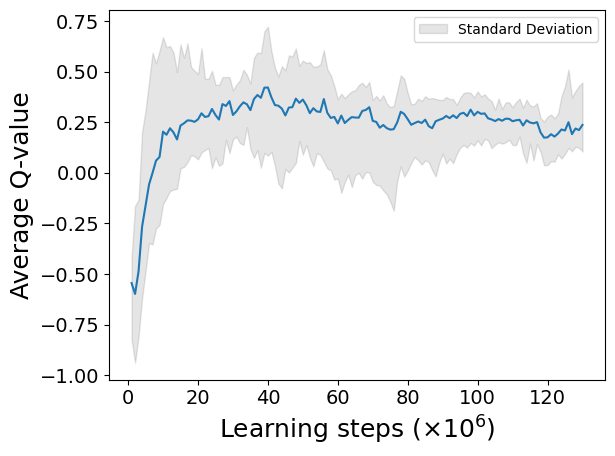

2024-07-26 01:00:53.862455: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:08:09.691671: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:18:14.641178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:20:12.801241: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6648.0

average moving queuetime :  57.6 98.8
average stay queuetime :  2.2 3.7
average total queuetime :  59.7 102.6
average chargecount :  1.7 1.7
average ordercount :  42.2 42.2
day : 1


2024-07-26 01:29:14.470995: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


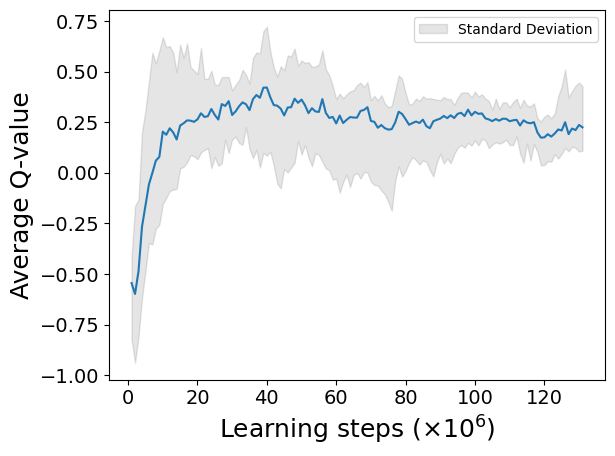

2024-07-26 01:48:42.017077: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 02:01:28.281260: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 02:15:37.333756: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 02:44:45.747867: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 02:49:15.321245: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


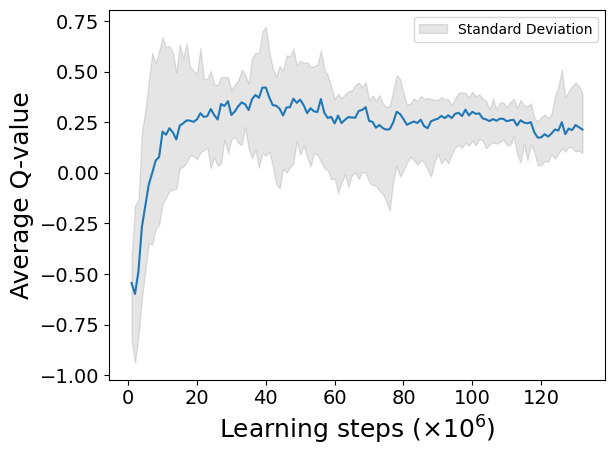


 time for simulate one day : 6674.1

average moving queuetime :  57.1 100.1
average stay queuetime :  3.8 9.4
average total queuetime :  60.9 109.5
average chargecount :  1.7 1.8
average ordercount :  42.2 42.1
day : 2


2024-07-26 03:24:19.190877: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:27:46.277555: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:32:49.818397: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:51:57.358440: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:52:00.260916: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:52:10.101411: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:55:48.421144: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:58:39.581173: W tensorflow/core/data/root_dataset.cc:24

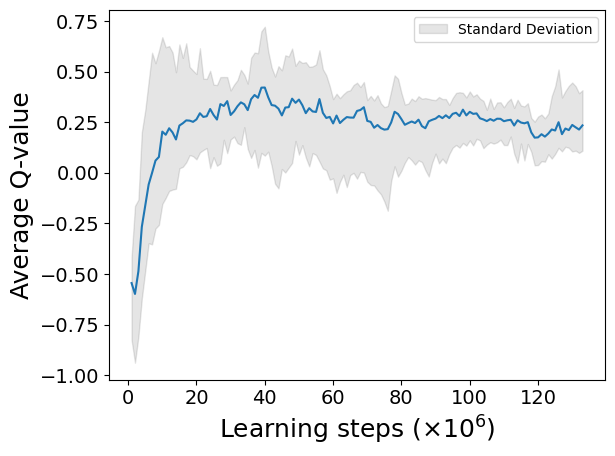

2024-07-26 04:38:11.799814: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 04:59:46.091245: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6708.0

average moving queuetime :  61.5 132.7
average stay queuetime :  5.6 16.9
average total queuetime :  67.1 149.5
average chargecount :  1.8 1.9
average ordercount :  42.1 42.1
day : 3


2024-07-26 05:06:19.927579: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:32:33.269016: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:35:47.932738: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:46:42.090424: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


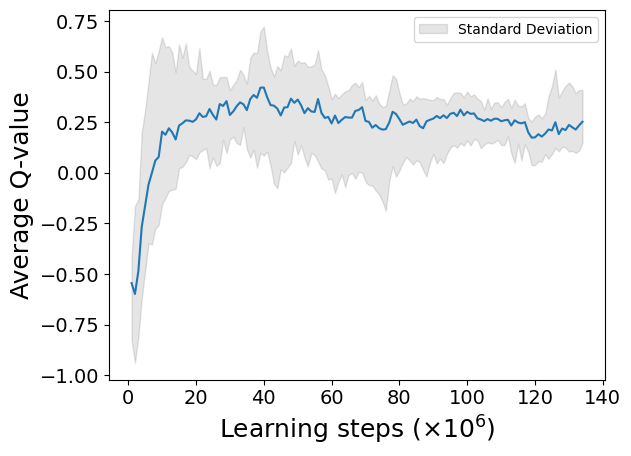

2024-07-26 06:04:45.663165: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:06:23.261173: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:09:44.041586: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:21:50.101391: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:37:12.181183: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:48:51.039684: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6767.9

average moving queuetime :  62.7 127.6
average stay queuetime :  7.2 22.7
average total queuetime :  69.9 150.4
average chargecount :  1.8 1.9
average ordercount :  42.2 42.2
[51, 3, 6, 33, 68, 20, 64, 54, 47, 66, 35, 68]
[71, 13, 42, 33, 40, 57, 57, 39, 58, 64, 36, 20]
[75, 46, 30, 36, 38, 54, 34, 66, 48, 52, 56, 37]
[77, 27, 52, 51, 27, 55, 37, 57, 65, 54, 55, 22]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.782321121749635
code start to now : 655293.6
episode_reward :  1734.2765373706618
fit_count :  1348186
TD max = 1.1198354793548584 TD min = 0.00010035583972934905
best model updated
model updated

episode 30
day : 0


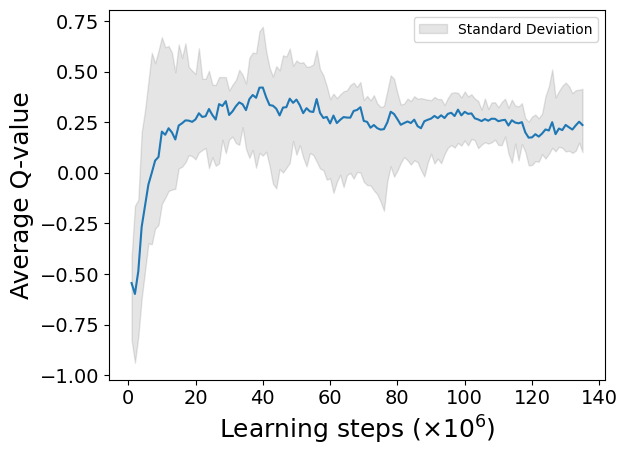

2024-07-26 07:17:14.779237: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:21:07.761163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:24:30.974100: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


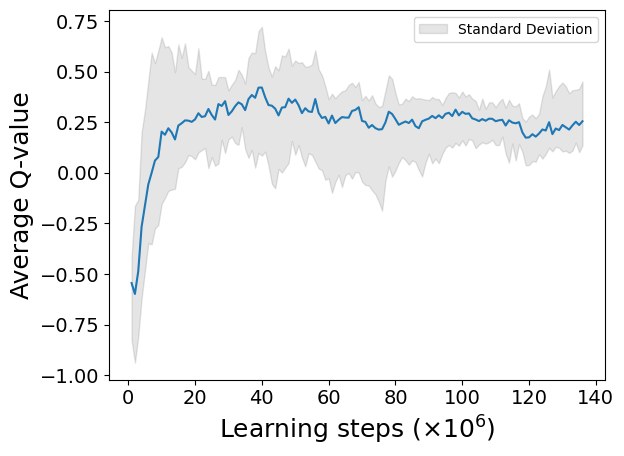

2024-07-26 08:37:42.357400: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:44:04.361730: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6523.3

average moving queuetime :  62.6 117.5
average stay queuetime :  11.7 21.9
average total queuetime :  74.3 139.4
average chargecount :  1.9 1.9
average ordercount :  42.2 42.2
day : 1


2024-07-26 09:14:29.629861: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:21:15.625537: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:40:52.563454: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:43:18.428798: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


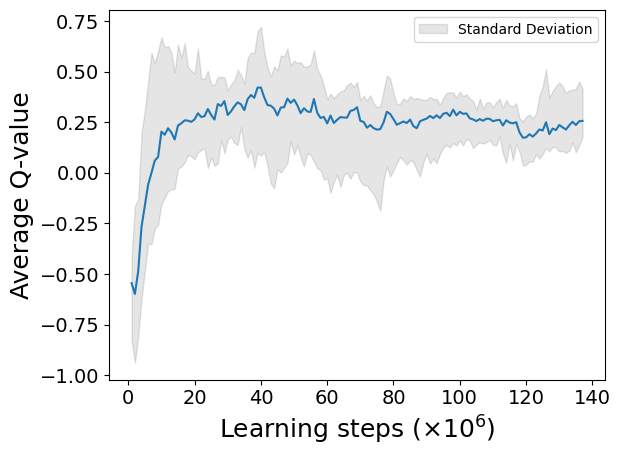

2024-07-26 09:54:33.455556: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:54:48.762565: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 10:09:47.624140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 10:14:48.681283: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6703.4

average moving queuetime :  64.7 124.3
average stay queuetime :  12.4 24.3
average total queuetime :  77.1 148.6
average chargecount :  1.9 1.9
average ordercount :  42.2 42.2
day : 2


2024-07-26 11:00:28.189092: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


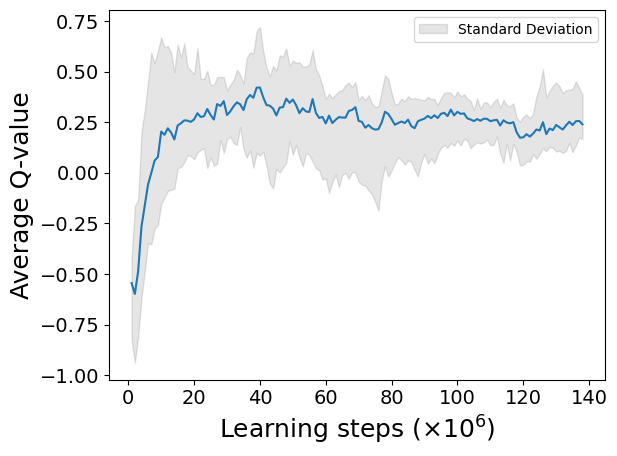

2024-07-26 11:16:21.319274: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 11:32:38.917462: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 11:39:18.143079: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:11:00.499489: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:22:43.001953: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6801.8

average moving queuetime :  64.4 114.2
average stay queuetime :  8.9 2.8
average total queuetime :  73.2 117.0
average chargecount :  1.8 1.8
average ordercount :  42.2 42.3
day : 3


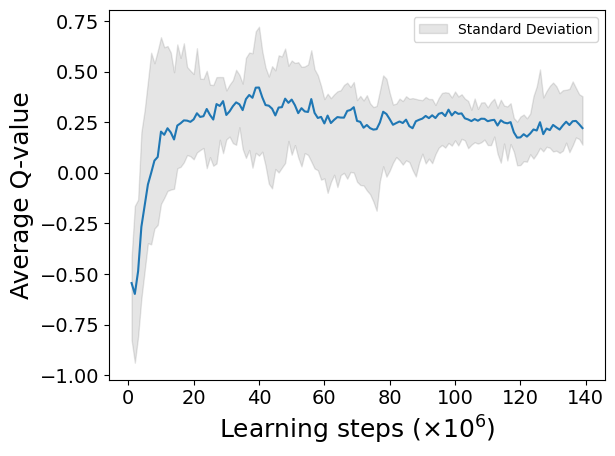

2024-07-26 12:37:27.831213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:54:14.014500: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:06:02.086050: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:14:14.609125: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:35:18.105407: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:45:36.668407: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:48:16.853741: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


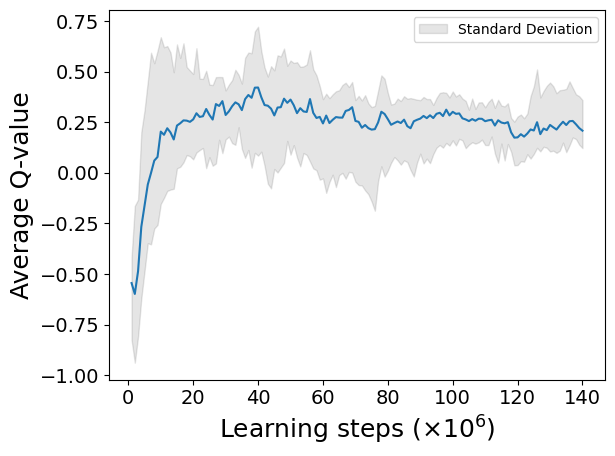

2024-07-26 14:02:43.534405: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6885.9

average moving queuetime :  62.9 112.1
average stay queuetime :  6.7 1.2
average total queuetime :  69.6 113.2
average chargecount :  1.9 1.9
average ordercount :  42.2 42.0
day : 4


2024-07-26 14:56:06.922990: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:17:01.379774: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


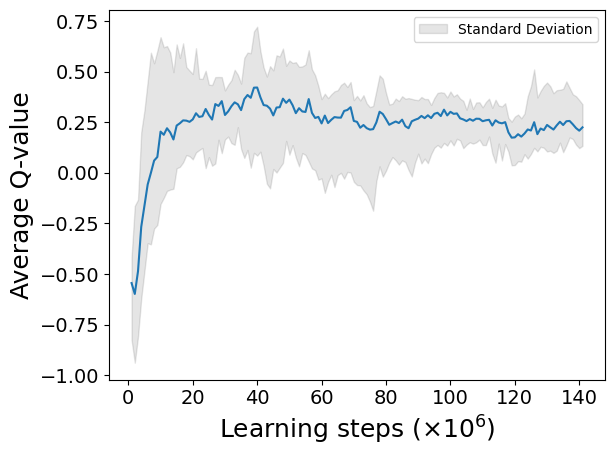

2024-07-26 15:27:38.107002: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:35:35.161286: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:37:44.871230: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:37:48.856028: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:40:27.305754: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:40:47.479651: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:41:29.569875: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 16:06:48.777373: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6793.7

average moving queuetime :  64.5 151.7
average stay queuetime :  7.9 25.6
average total queuetime :  72.4 177.3
average chargecount :  1.9 2.2
average ordercount :  42.2 42.1
[68, 27, 43, 33, 39, 56, 51, 49, 59, 55, 61, 22]
[73, 29, 32, 34, 37, 69, 31, 63, 48, 64, 51, 27]
[64, 35, 25, 35, 42, 67, 33, 69, 53, 50, 47, 19]
[80, 33, 35, 39, 71, 40, 49, 66, 55, 56, 44, 6]
[81, 47, 22, 52, 55, 58, 55, 62, 42, 67, 43, 63]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.181028549454484
code start to now : 689022.8
episode_reward :  2205.7418458318407
fit_count :  1416931
TD max = 1.106213076210022 TD min = 0.0001002890825271662
best model updated
model updated

episode 31
day : 0


2024-07-26 16:25:17.260278: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 16:26:48.137608: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 16:36:53.280642: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 16:43:58.050199: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


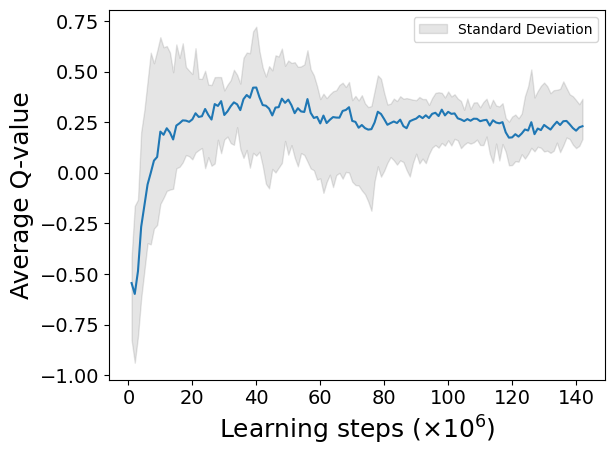

2024-07-26 16:44:29.439482: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 17:14:59.258234: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 17:17:55.865704: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 17:36:28.370822: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 17:45:55.265273: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 17:49:24.161227: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 18:04:54.223206: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


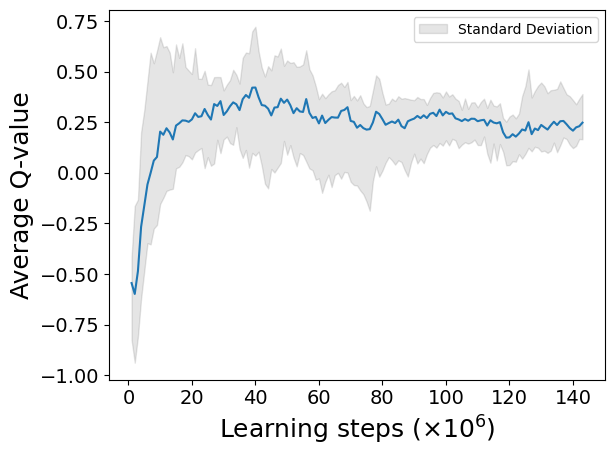


 time for simulate one day : 6555.4

average moving queuetime :  78.4 135.7
average stay queuetime :  48.6 84.0
average total queuetime :  127.0 219.7
average chargecount :  1.7 1.7
average ordercount :  42.0 42.0
day : 1


2024-07-26 18:14:45.471154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:08:04.171337: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


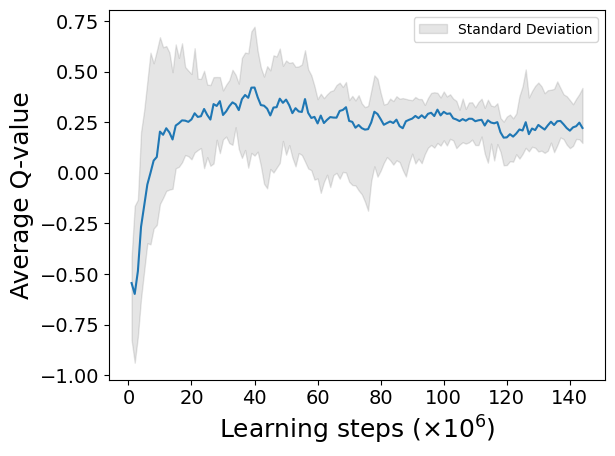

2024-07-26 19:30:13.560476: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:44:55.472421: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6751.7

average moving queuetime :  70.2 110.5
average stay queuetime :  25.1 4.1
average total queuetime :  95.3 114.5
average chargecount :  1.8 1.8
average ordercount :  42.2 42.4
day : 2


2024-07-26 20:09:51.416820: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:35:37.092977: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:39:27.131201: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:43:29.341173: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:44:29.596103: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


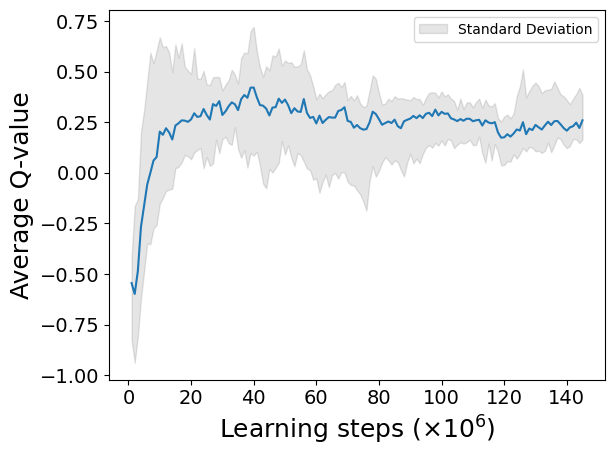

2024-07-26 21:15:28.211558: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:37:15.979030: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:39:37.378573: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6784.2

average moving queuetime :  67.3 128.0
average stay queuetime :  16.3 2.7
average total queuetime :  83.7 130.6
average chargecount :  1.9 2.0
average ordercount :  42.2 42.2
day : 3


2024-07-26 21:54:52.528187: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 22:09:58.430711: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


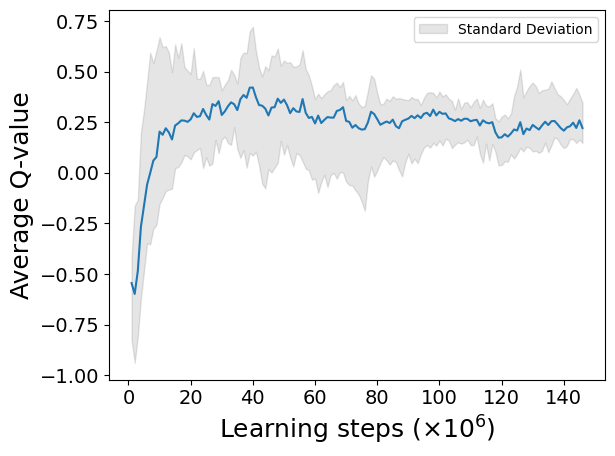

2024-07-26 22:27:22.049080: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 22:35:40.378194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 22:44:14.116360: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:08:49.260535: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:24:45.656965: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:26:51.562560: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:29:36.278394: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


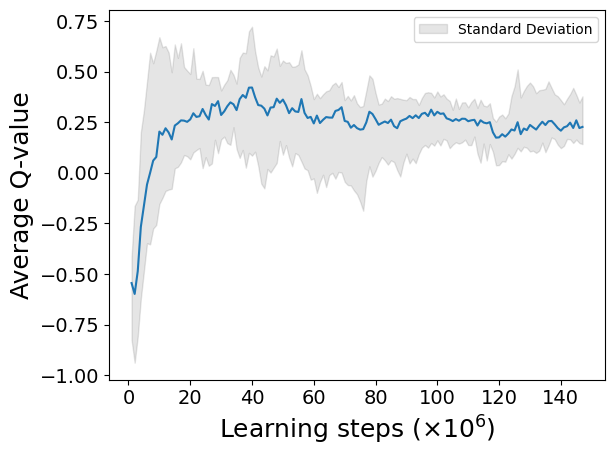

2024-07-26 23:35:53.238689: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6686.9

average moving queuetime :  65.9 125.8
average stay queuetime :  14.0 15.7
average total queuetime :  80.0 141.5
average chargecount :  1.9 2.0
average ordercount :  42.2 42.1
day : 4


2024-07-26 23:48:32.162807: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:04:33.036677: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:04:48.901330: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:08:05.091261: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:17:41.942857: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:36:06.310985: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:40:40.622420: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:51:48.581127: W tensorflow/core/data/root_dataset.cc:24

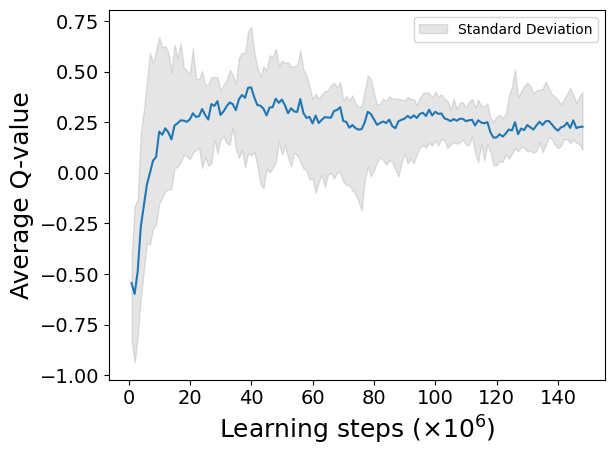

2024-07-27 00:53:09.088734: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:54:20.756965: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:59:03.370943: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6668.8

average moving queuetime :  65.6 135.2
average stay queuetime :  11.9 8.8
average total queuetime :  77.6 144.0
average chargecount :  1.9 2.1
average ordercount :  42.1 42.1
[60, 0, 0, 34, 14, 77, 41, 57, 69, 63, 50, 54]
[55, 20, 38, 49, 43, 39, 67, 55, 48, 62, 39, 18]
[82, 20, 70, 17, 74, 25, 66, 66, 48, 57, 70, 20]
[82, 35, 30, 45, 65, 27, 73, 39, 45, 67, 41, 59]
[69, 44, 6, 50, 70, 70, 58, 47, 75, 66, 40, 32]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.196330001323352
code start to now : 722490.8
episode_reward :  2186.6051178416724
fit_count :  1485665
TD max = 1.0893890691757202 TD min = 0.0001002890825271662
model updated

episode 32
day : 0


2024-07-27 01:48:41.548679: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:55:58.169420: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:04:56.981177: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:09:22.261852: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


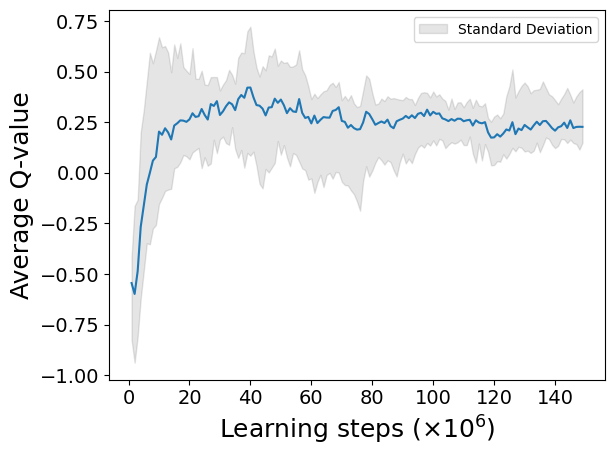

2024-07-27 02:21:53.968488: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:29:13.183343: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:04:49.482977: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:09:32.749233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:10:20.327612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:13:34.531170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6593.2

average moving queuetime :  61.8 107.9
average stay queuetime :  41.3 72.1
average total queuetime :  103.0 179.9
average chargecount :  1.7 1.7
average ordercount :  42.0 42.0
day : 1


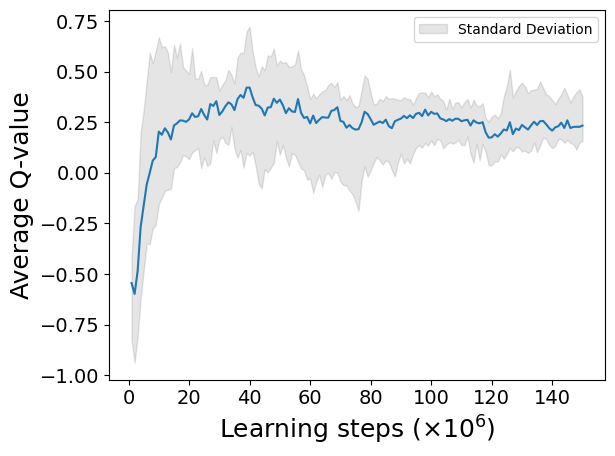

2024-07-27 03:39:47.279858: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:17:16.620006: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:24:19.551160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:26:47.443095: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:26:51.918984: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:30:29.671082: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:49:01.171172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


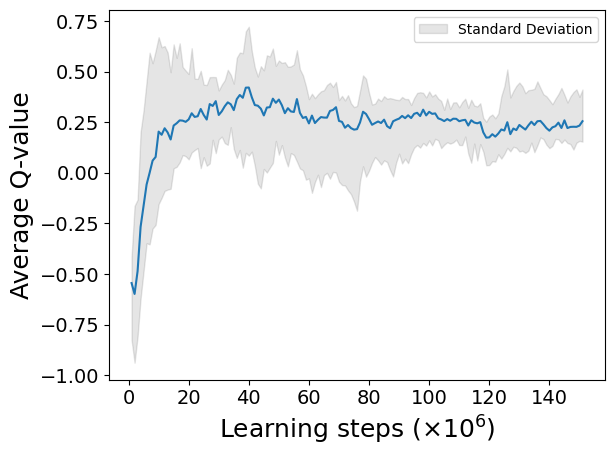

2024-07-27 05:05:54.686962: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6790.1

average moving queuetime :  58.5 107.3
average stay queuetime :  22.8 11.9
average total queuetime :  81.4 119.2
average chargecount :  1.8 1.9
average ordercount :  41.9 41.8
day : 2


2024-07-27 05:28:18.071148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:31:04.980251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:37:55.334085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:47:48.275144: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:01:33.737881: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:11:04.478085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


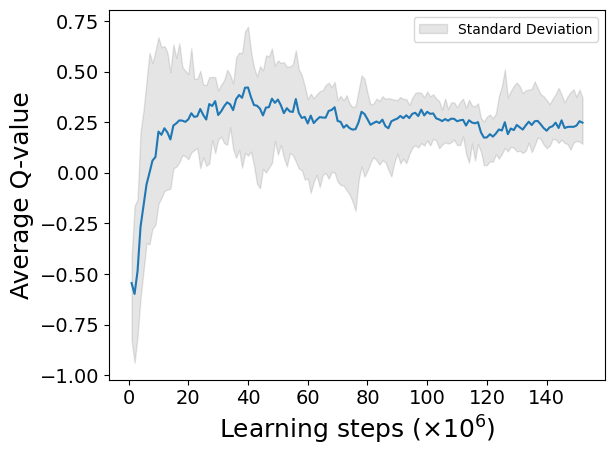

2024-07-27 06:24:48.611239: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:59:28.061135: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:04:50.639433: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6597.9

average moving queuetime :  61.2 118.2
average stay queuetime :  30.9 84.6
average total queuetime :  92.1 202.7
average chargecount :  1.8 1.8
average ordercount :  41.9 41.8
day : 3


2024-07-27 07:22:37.066615: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:23:40.530391: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


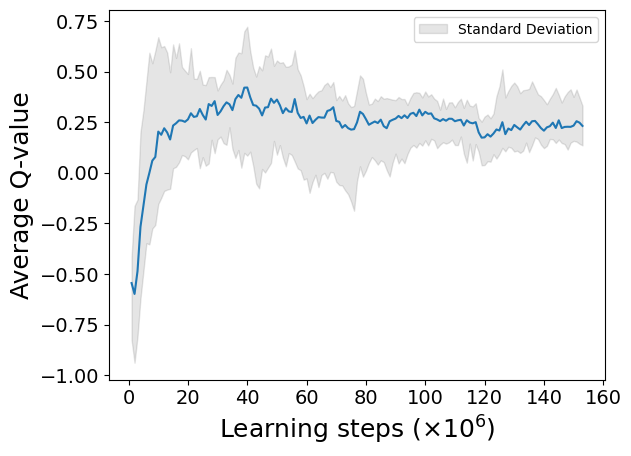

2024-07-27 07:43:32.650892: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:13:20.177951: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:18:07.321153: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:42:00.690591: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:42:49.881878: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:42:50.421194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:47:19.929316: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


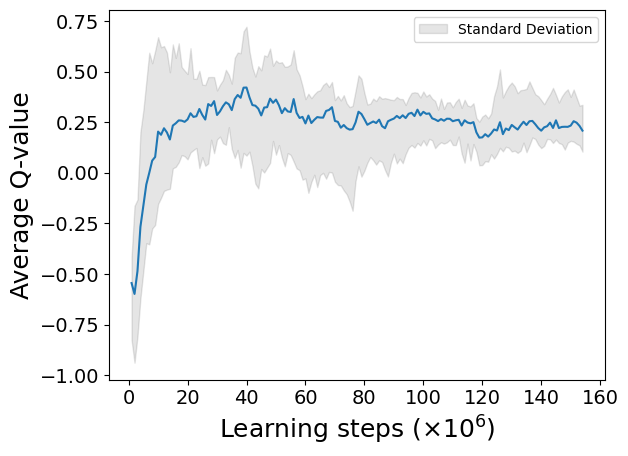

2024-07-27 09:00:59.971144: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6745.4

average moving queuetime :  63.1 135.6
average stay queuetime :  28.2 40.9
average total queuetime :  91.3 176.5
average chargecount :  1.9 2.0
average ordercount :  41.9 41.9
day : 4


2024-07-27 09:11:50.101150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 09:15:16.247523: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 09:23:48.518080: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 09:53:36.379920: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:11:01.983378: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


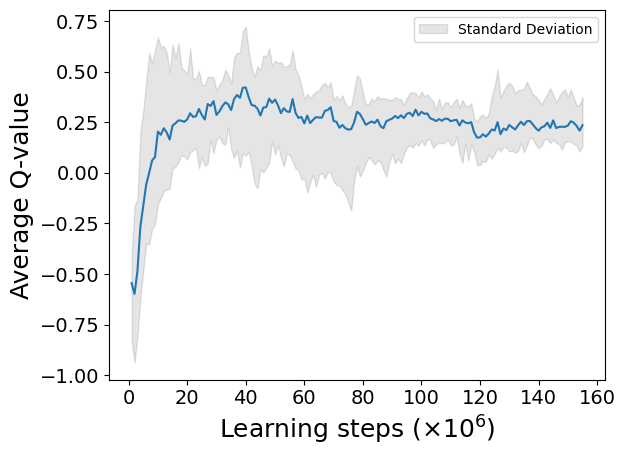

2024-07-27 10:31:59.154755: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:34:47.751306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:36:19.781392: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:37:55.756737: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:43:12.422726: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6619.8

average moving queuetime :  64.8 131.5
average stay queuetime :  33.0 96.7
average total queuetime :  97.8 228.2
average chargecount :  1.9 1.8
average ordercount :  41.9 41.8
[60, 0, 1, 59, 38, 38, 63, 60, 57, 34, 69, 45]
[69, 61, 3, 40, 53, 64, 59, 23, 89, 49, 36, 33]
[68, 31, 20, 49, 40, 60, 53, 40, 41, 64, 47, 18]
[94, 41, 22, 42, 40, 66, 41, 60, 51, 51, 54, 34]
[78, 51, 6, 24, 50, 54, 34, 68, 51, 48, 61, 25]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.243122690926702
code start to now : 755857.7
episode_reward :  2207.5581051688314
fit_count :  1553880
TD max = 1.0275732112884521 TD min = 0.00010066876411436434
best model updated
model updated

episode 33
day : 0


2024-07-27 11:03:09.529537: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 11:17:36.180157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 11:20:22.228644: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 11:31:33.366244: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 11:44:27.123257: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:01:35.801965: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


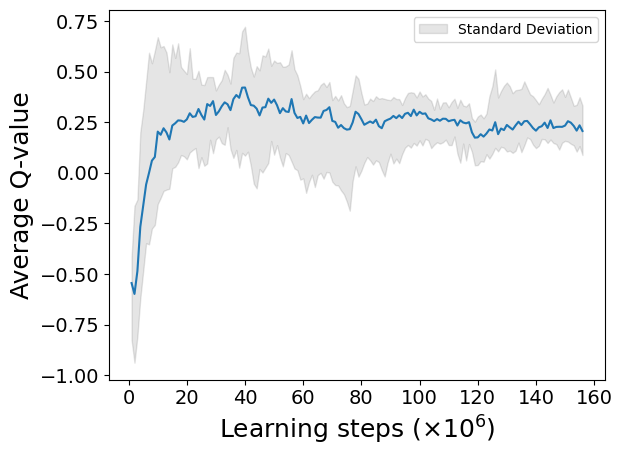

2024-07-27 12:22:29.465377: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:25:12.897393: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:43:55.721164: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7671.2

average moving queuetime :  58.7 98.9
average stay queuetime :  5.9 9.9
average total queuetime :  64.6 108.8
average chargecount :  1.7 1.7
average ordercount :  42.1 42.1
day : 1


2024-07-27 13:13:52.683156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


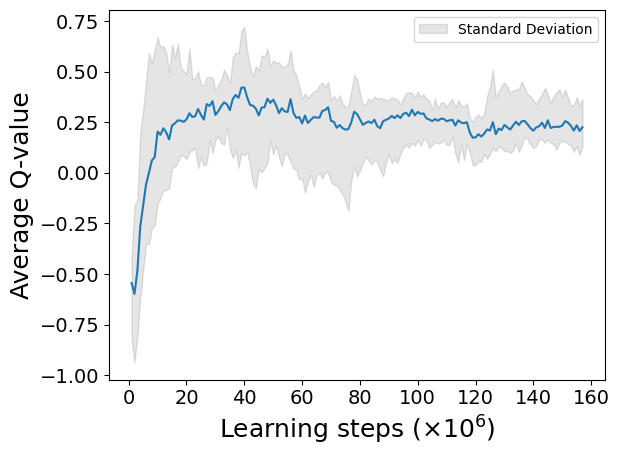

2024-07-27 13:34:55.769205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 14:16:20.501168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 14:22:20.341222: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 14:22:56.275182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 14:26:10.739543: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 14:27:37.951171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


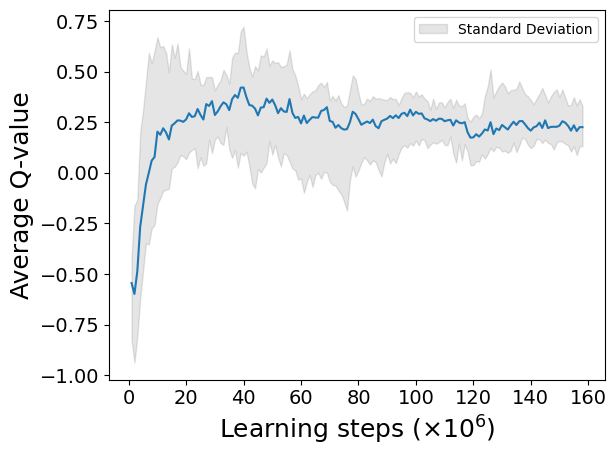


 time for simulate one day : 6877.9

average moving queuetime :  61.0 127.9
average stay queuetime :  9.3 24.7
average total queuetime :  70.3 152.7
average chargecount :  1.9 2.0
average ordercount :  42.0 41.9
day : 2


2024-07-27 15:08:13.798474: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:36:08.181231: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:37:43.058344: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:42:15.026194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:42:33.887456: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


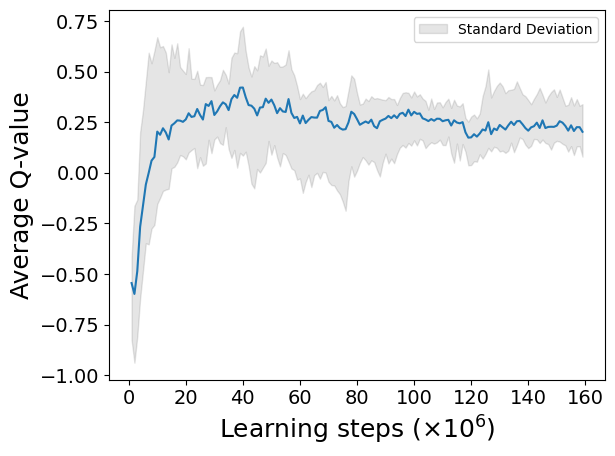


 time for simulate one day : 6922.8

average moving queuetime :  59.9 112.2
average stay queuetime :  6.5 2.1
average total queuetime :  66.3 114.3
average chargecount :  1.9 1.9
average ordercount :  42.0 42.1
day : 3


2024-07-27 16:54:34.661196: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 16:56:06.199968: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:17:51.879205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:27:41.741222: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


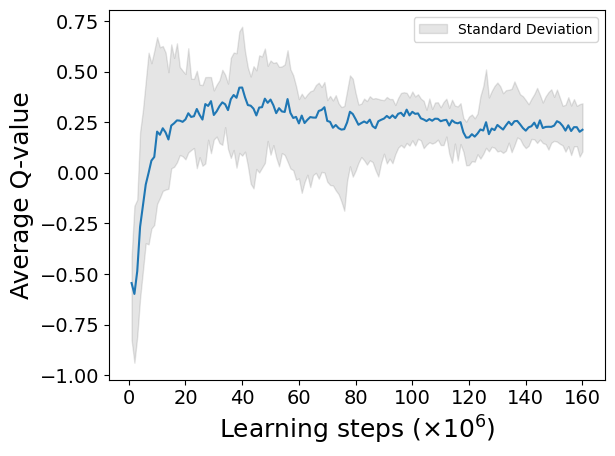

2024-07-27 18:16:02.425050: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:20:37.351206: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:40:01.391165: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:43:14.359577: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6891.3

average moving queuetime :  61.0 129.2
average stay queuetime :  18.0 101.2
average total queuetime :  79.0 230.5
average chargecount :  1.9 2.0
average ordercount :  42.0 42.0
day : 4


2024-07-27 18:46:06.305529: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:48:56.841160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


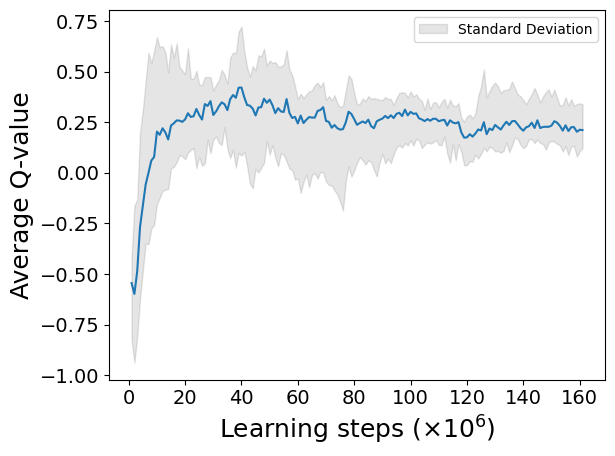

2024-07-27 19:01:18.559469: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:08:33.870872: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:09:10.189640: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:22:24.728733: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:27:00.041151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:27:07.881193: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:38:40.193577: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:45:44.065163: W tensorflow/core/data/root_dataset.cc:24

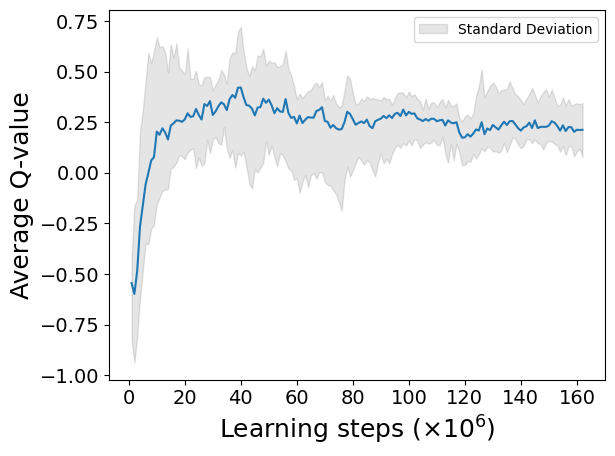

2024-07-27 20:21:48.191131: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:23:26.696446: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6722.0

average moving queuetime :  59.4 99.1
average stay queuetime :  14.8 3.8
average total queuetime :  74.3 102.9
average chargecount :  1.9 1.9
average ordercount :  42.1 42.1
[54, 6, 0, 29, 35, 70, 72, 40, 56, 54, 52, 37]
[84, 22, 29, 45, 47, 66, 40, 76, 47, 54, 42, 59]
[76, 21, 22, 63, 30, 62, 63, 49, 60, 48, 40, 49]
[87, 23, 23, 55, 26, 63, 61, 40, 64, 44, 48, 69]
[80, 20, 25, 57, 31, 54, 62, 55, 62, 39, 54, 24]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.282517957377173
code start to now : 790963.9
episode_reward :  2250.0773975812326
fit_count :  1622449
TD max = 1.1196917129516601 TD min = 0.00010028401613233476
best model updated
model updated

episode 34
day : 0


2024-07-27 20:40:25.371202: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:46:48.708911: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:16:00.781232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


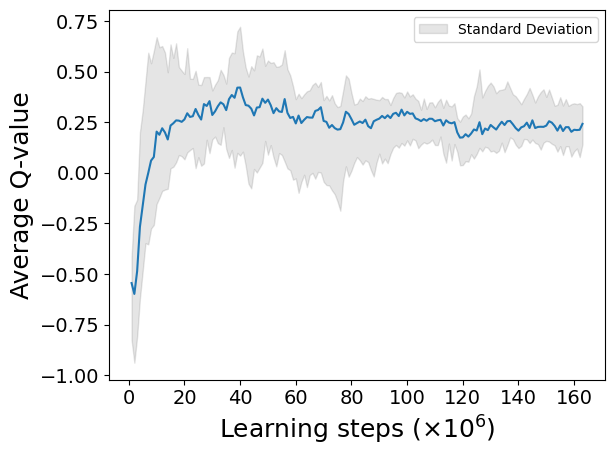

2024-07-27 21:43:56.610339: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:51:43.201219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:00:59.271157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:25:15.221221: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6537.5

average moving queuetime :  77.8 121.1
average stay queuetime :  31.5 49.0
average total queuetime :  109.3 170.1
average chargecount :  1.6 1.6
average ordercount :  42.2 42.2
day : 1


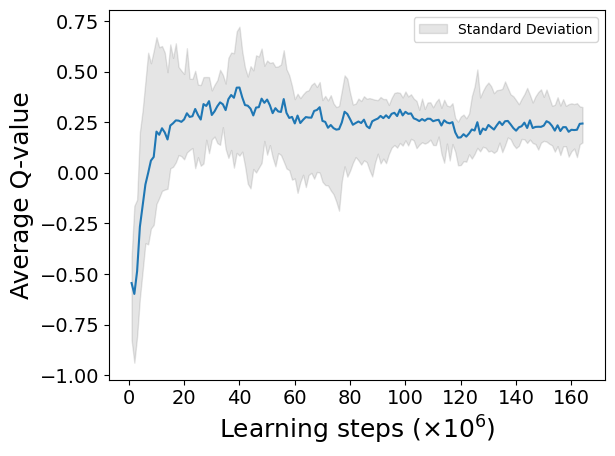

2024-07-27 23:10:22.381163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:23:59.911132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:53:57.956688: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:06:48.470023: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6780.9

average moving queuetime :  67.1 108.9
average stay queuetime :  49.5 120.8
average total queuetime :  116.7 229.7
average chargecount :  1.7 1.9
average ordercount :  42.2 42.1
day : 2


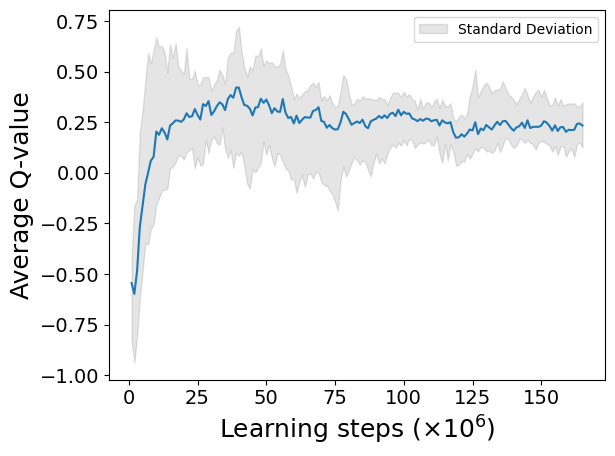

2024-07-28 00:24:16.333547: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:25:03.774384: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:47:00.339916: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:05:04.355633: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:07:09.981195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:34:33.149232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


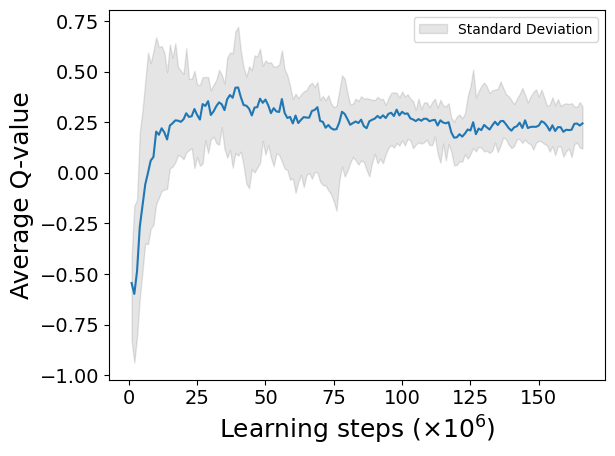


 time for simulate one day : 6739.3

average moving queuetime :  68.4 131.2
average stay queuetime :  46.0 73.4
average total queuetime :  114.4 204.6
average chargecount :  1.8 1.9
average ordercount :  42.1 42.1
day : 3


2024-07-28 02:37:49.796035: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 02:49:21.460443: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 02:53:43.735758: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 02:56:43.985282: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


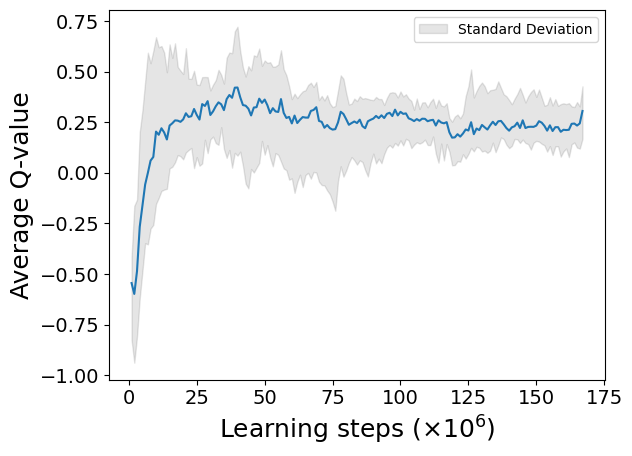


 time for simulate one day : 6725.0

average moving queuetime :  67.7 132.3
average stay queuetime :  41.3 58.3
average total queuetime :  109.0 190.6
average chargecount :  1.8 2.0
average ordercount :  42.1 41.9
day : 4


2024-07-28 04:13:59.746860: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:24:59.708410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:27:23.878632: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


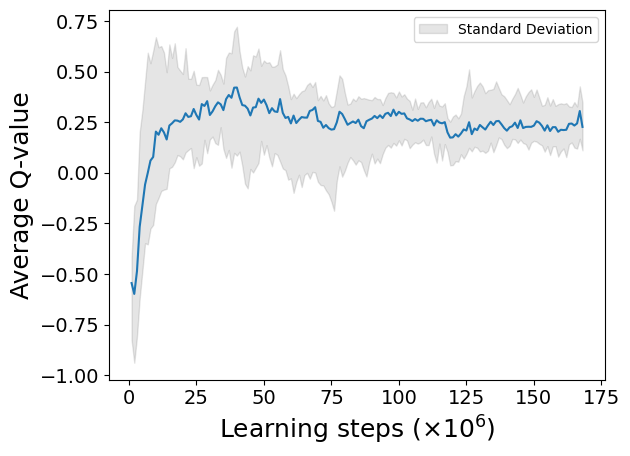

2024-07-28 04:54:58.404669: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:07:54.143342: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:40:09.413387: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


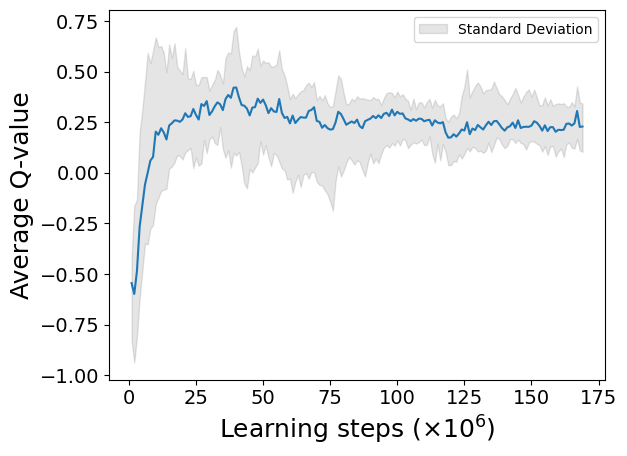

2024-07-28 05:53:11.734156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6810.6

average moving queuetime :  68.1 128.3
average stay queuetime :  41.9 81.5
average total queuetime :  110.0 209.8
average chargecount :  1.8 1.8
average ordercount :  42.1 42.1
[59, 1, 0, 22, 21, 58, 48, 60, 54, 50, 63, 31]
[74, 28, 34, 43, 49, 52, 41, 56, 51, 55, 59, 19]
[93, 17, 27, 30, 44, 50, 60, 44, 53, 58, 54, 27]
[92, 15, 29, 37, 53, 56, 55, 52, 41, 59, 51, 62]
[70, 22, 15, 32, 56, 53, 53, 56, 38, 61, 47, 50]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.281816067821275
code start to now : 824583.5
episode_reward :  2155.0496214797254
fit_count :  1690910
TD max = 1.1196917129516601 TD min = 0.0001002397292474532
model updated

episode 35
day : 0


2024-07-28 06:13:29.191111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 06:27:47.111752: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 06:33:30.980988: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:04:52.761125: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


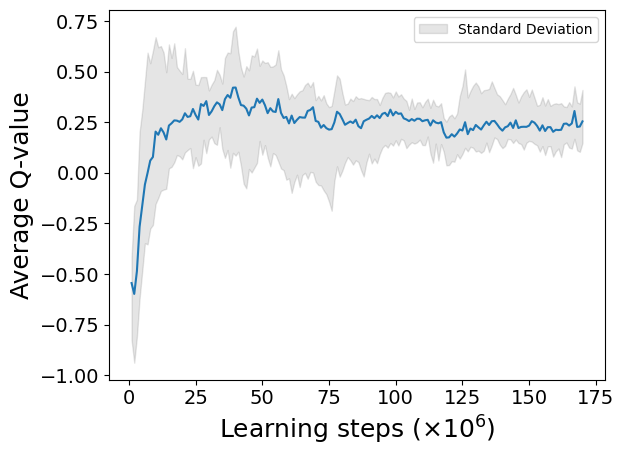

2024-07-28 07:26:40.451171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6673.4

average moving queuetime :  63.4 99.7
average stay queuetime :  2.6 4.2
average total queuetime :  66.0 103.9
average chargecount :  1.6 1.6
average ordercount :  42.2 42.2
day : 1


2024-07-28 07:53:18.763738: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:55:14.660777: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


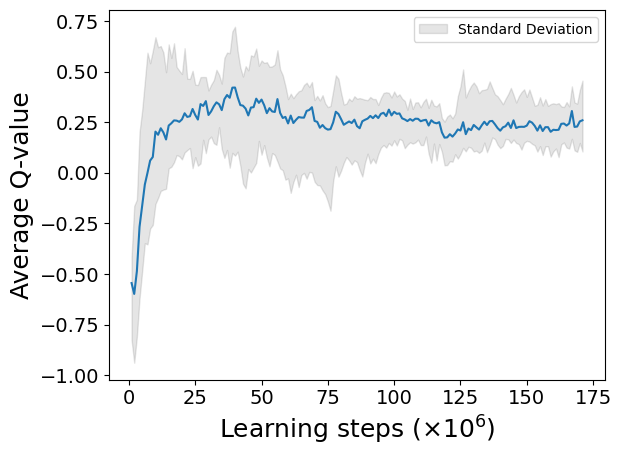

2024-07-28 08:51:27.052799: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 08:55:36.551208: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 09:04:56.421255: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 09:08:21.500408: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6709.0

average moving queuetime :  61.0 109.8
average stay queuetime :  2.5 4.5
average total queuetime :  63.5 114.3
average chargecount :  1.7 1.9
average ordercount :  42.1 42.0
day : 2


2024-07-28 09:54:48.339768: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


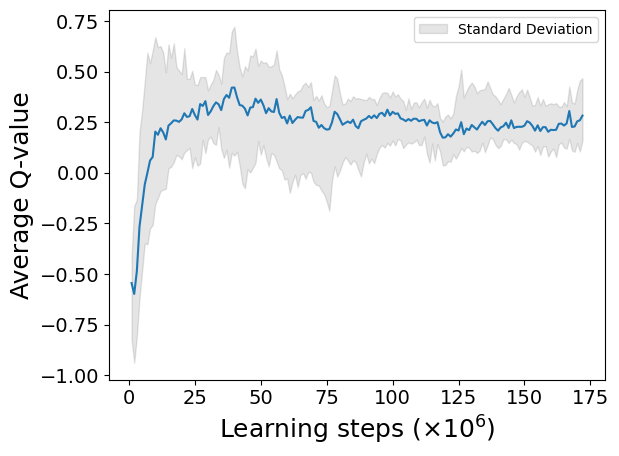

2024-07-28 09:58:52.836565: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:21:13.044671: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:34:48.905364: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:54:58.884338: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:02:37.742834: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


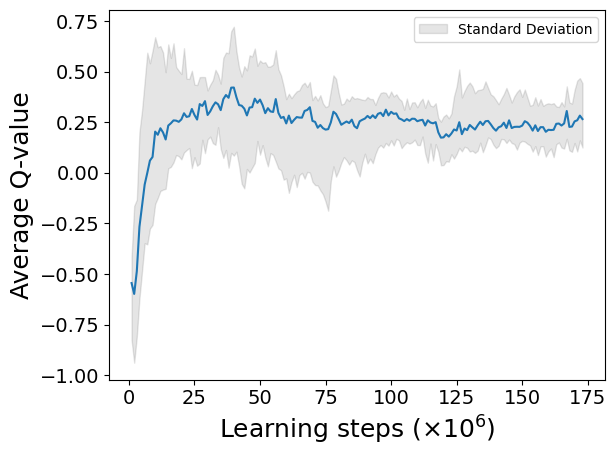


 time for simulate one day : 6675.2

average moving queuetime :  59.9 107.5
average stay queuetime :  7.4 30.7
average total queuetime :  67.4 138.2
average chargecount :  1.8 1.9
average ordercount :  42.1 41.9
day : 3


2024-07-28 11:42:22.795287: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:43:04.611145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:47:24.977210: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:52:25.296939: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:55:22.731212: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:11:32.307688: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:24:06.281114: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:36:16.591171: W tensorflow/core/data/root_dataset.cc:24

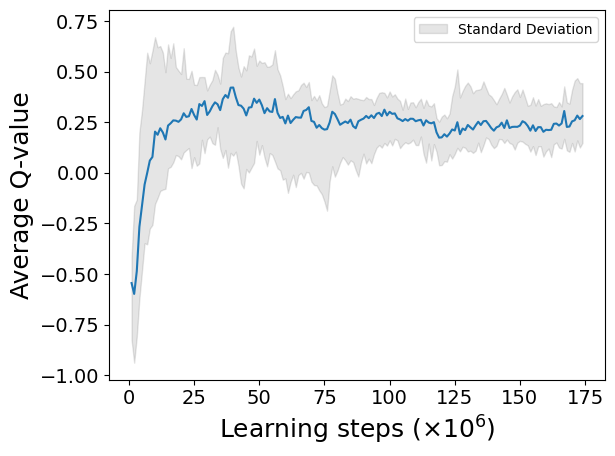

2024-07-28 12:59:07.667953: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:15:17.725469: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6630.6

average moving queuetime :  61.9 130.9
average stay queuetime :  11.5 44.0
average total queuetime :  73.4 174.9
average chargecount :  1.8 1.9
average ordercount :  42.0 42.0
day : 4


2024-07-28 13:37:03.483284: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:38:18.130066: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:44:54.821139: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:47:53.188334: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:48:44.550222: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:51:45.441185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:52:29.122313: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


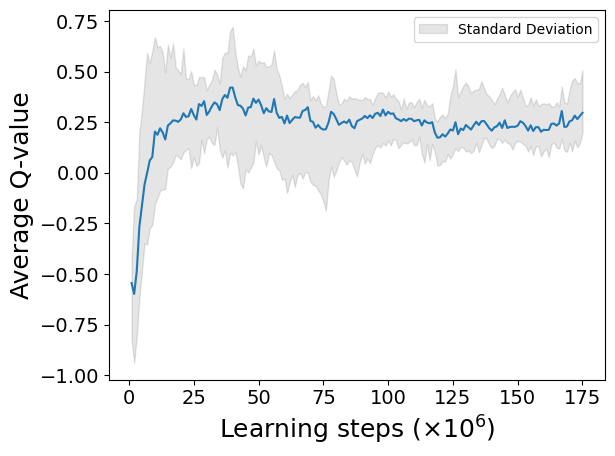

2024-07-28 14:28:19.760870: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 14:38:00.644323: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 14:55:08.972794: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 15:01:43.232039: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6656.1

average moving queuetime :  62.4 124.0
average stay queuetime :  13.5 40.2
average total queuetime :  75.9 164.1
average chargecount :  1.8 1.9
average ordercount :  42.0 41.9
[56, 4, 0, 18, 38, 65, 41, 56, 64, 45, 63, 22]
[77, 26, 50, 30, 28, 51, 69, 39, 62, 54, 41, 31]
[85, 22, 34, 35, 40, 68, 37, 53, 47, 62, 39, 35]
[90, 26, 19, 52, 51, 36, 65, 61, 41, 52, 66, 25]
[86, 12, 44, 33, 56, 59, 53, 52, 36, 69, 49, 28]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.216741599971182
code start to now : 857948.7
episode_reward :  2222.5638960936926
fit_count :  1759303
TD max = 1.328800304031372 TD min = 0.00010007271766666595
model updated

episode 36
day : 0


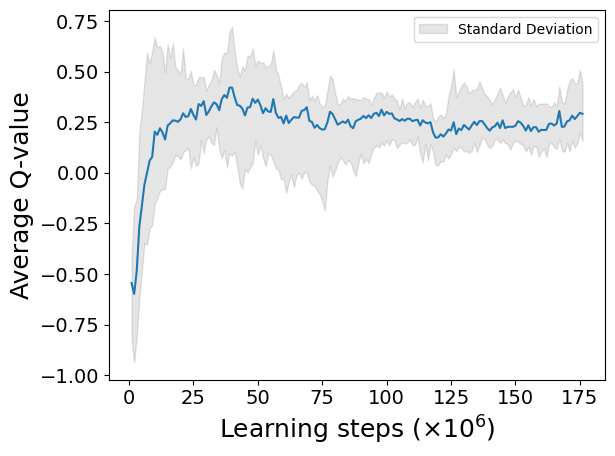

2024-07-28 15:28:51.283085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 15:55:10.130369: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:04:45.161193: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:21:16.101267: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:31:01.220251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:32:41.381173: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:37:57.851021: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


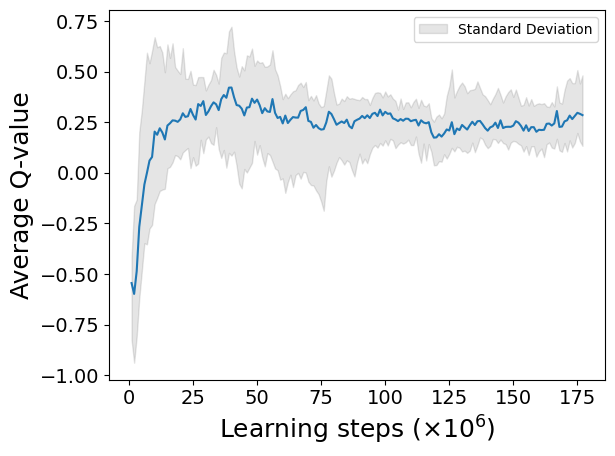

2024-07-28 16:43:47.402645: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6556.9

average moving queuetime :  63.1 106.2
average stay queuetime :  8.8 14.9
average total queuetime :  71.9 121.0
average chargecount :  1.7 1.7
average ordercount :  42.1 42.1
day : 1


2024-07-28 17:32:57.183404: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 17:35:29.246593: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


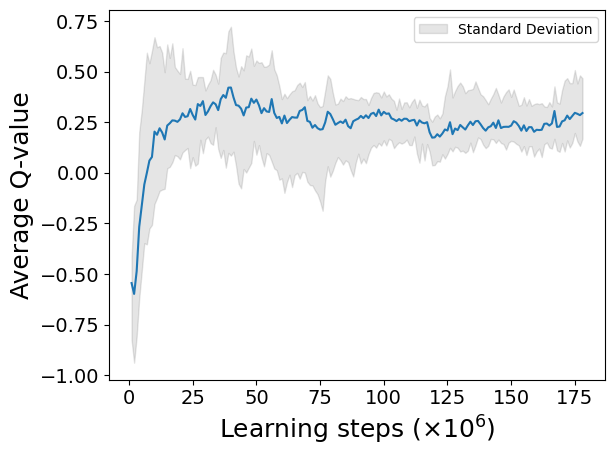

2024-07-28 18:18:10.116702: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:24:31.835521: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:35:54.709511: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:43:04.264898: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6646.3

average moving queuetime :  63.2 118.7
average stay queuetime :  6.3 7.5
average total queuetime :  69.4 126.2
average chargecount :  1.8 1.9
average ordercount :  42.1 42.1
day : 2


2024-07-28 19:01:52.693764: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 19:21:08.265589: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


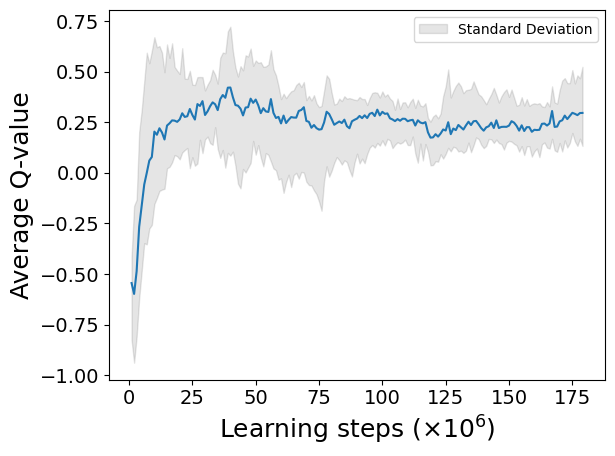

2024-07-28 19:39:26.057439: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 19:40:51.440507: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:03:14.053198: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:33:39.727970: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


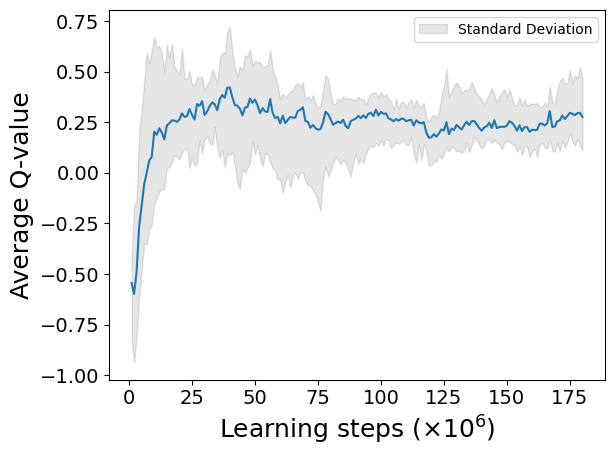

2024-07-28 20:46:59.950969: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6822.3

average moving queuetime :  67.0 142.7
average stay queuetime :  15.6 62.9
average total queuetime :  82.5 205.7
average chargecount :  1.8 1.9
average ordercount :  42.1 42.1
day : 3


2024-07-28 21:15:52.986617: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:40:04.083957: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:52:10.920331: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:56:49.350882: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


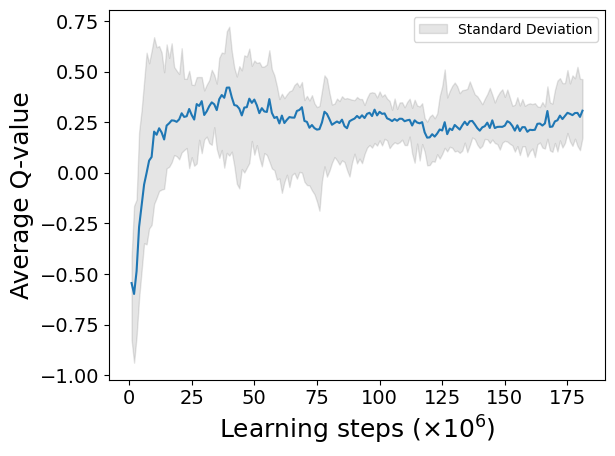

2024-07-28 22:20:39.130545: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:39:32.590452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6695.2

average moving queuetime :  69.4 142.2
average stay queuetime :  20.4 64.6
average total queuetime :  89.8 206.8
average chargecount :  1.8 1.9
average ordercount :  42.1 42.1
day : 4


2024-07-28 23:04:28.053191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:13:59.887941: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:16:08.890079: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


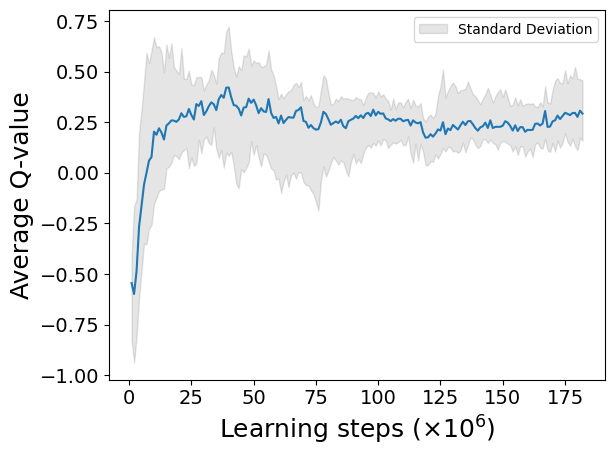

2024-07-28 23:56:58.501149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6706.4

average moving queuetime :  69.4 131.5
average stay queuetime :  18.9 25.1
average total queuetime :  88.3 156.6
average chargecount :  1.8 1.9
average ordercount :  42.1 42.1
[58, 2, 1, 41, 45, 39, 69, 65, 40, 53, 56, 36]
[91, 8, 39, 26, 49, 48, 63, 50, 46, 60, 47, 36]
[91, 22, 24, 41, 49, 54, 52, 41, 50, 53, 53, 48]
[84, 9, 11, 44, 48, 49, 59, 50, 47, 66, 36, 56]
[85, 7, 28, 26, 52, 58, 56, 55, 52, 61, 42, 46]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.301674358991865
code start to now : 891397.1
episode_reward :  2202.5447096946687
fit_count :  1827822
TD max = 1.328800304031372 TD min = 0.00010013515353203264
model updated

episode 37
day : 0


2024-07-29 00:46:44.851529: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


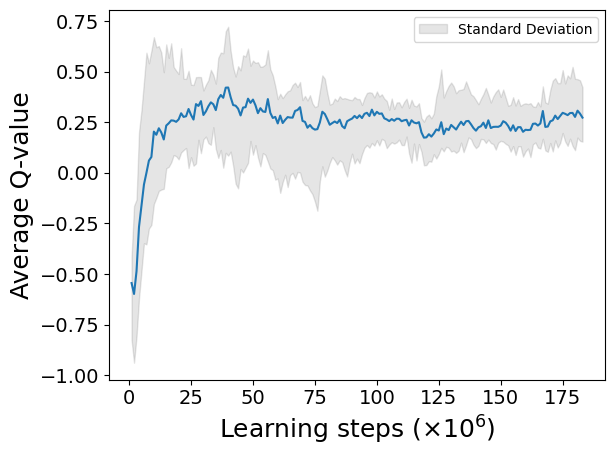

2024-07-29 01:22:55.267696: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:28:35.807299: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:30:01.890001: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:30:36.981195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:38:07.071174: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:38:39.050170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:40:04.403698: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:56:18.881194: W tensorflow/core/data/root_dataset.cc:24

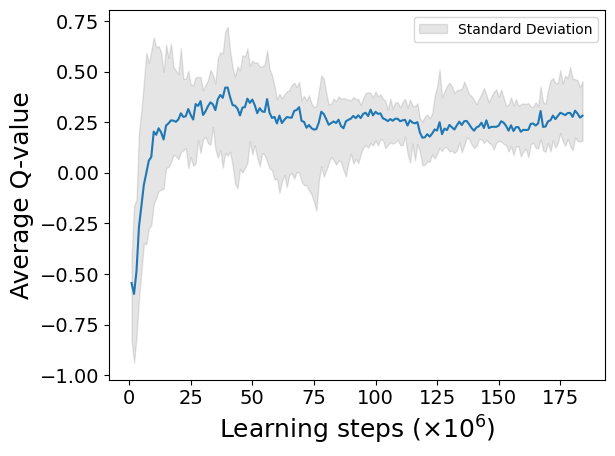


 time for simulate one day : 6518.1

average moving queuetime :  71.3 112.0
average stay queuetime :  58.2 91.4
average total queuetime :  129.5 203.4
average chargecount :  1.6 1.6
average ordercount :  42.1 42.1
day : 1


2024-07-29 02:38:01.208898: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 02:44:08.488450: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 02:53:54.227983: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 03:04:11.706831: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 03:09:24.302417: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


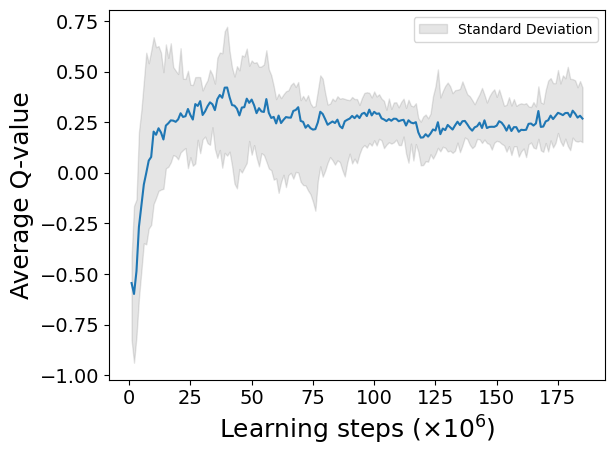

2024-07-29 03:40:39.638695: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:01:01.379561: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:05:47.377928: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:07:07.728419: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6713.2

average moving queuetime :  68.3 123.4
average stay queuetime :  32.8 21.5
average total queuetime :  101.1 145.0
average chargecount :  1.7 1.9
average ordercount :  42.0 41.9
day : 2


2024-07-29 04:23:02.781166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:23:13.484304: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:28:50.561163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:36:33.437718: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:47:33.111163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:53:39.171301: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


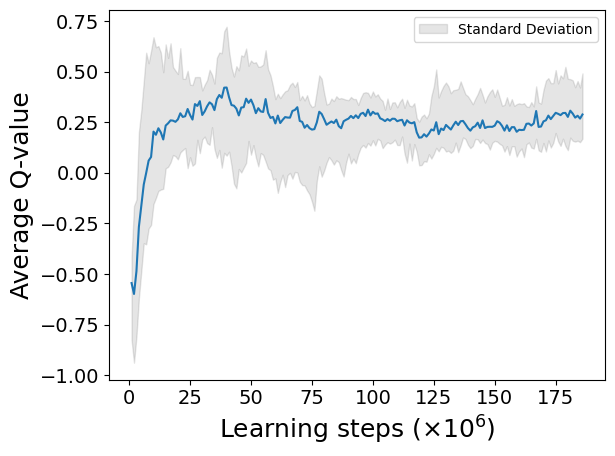

2024-07-29 05:02:36.191487: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:10:30.694719: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:26:46.918806: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:28:04.126963: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:31:59.011191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:40:44.661127: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 06:02:26.738936: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6788.6

average moving queuetime :  67.1 122.7
average stay queuetime :  32.2 59.2
average total queuetime :  99.4 181.9
average chargecount :  1.8 1.9
average ordercount :  42.1 42.2
day : 3


2024-07-29 06:13:07.770908: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


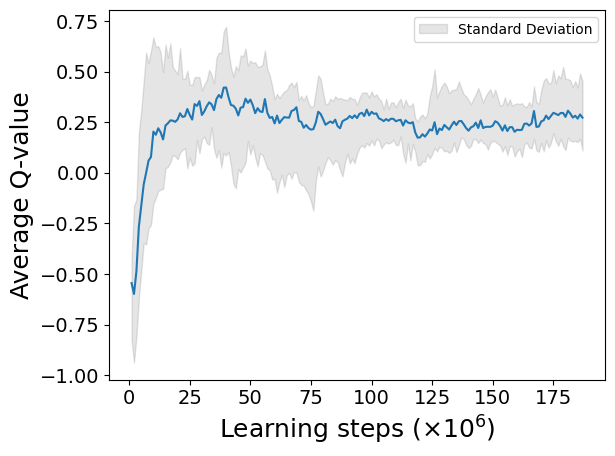

2024-07-29 06:55:01.251191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:25:54.526400: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:34:46.261207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


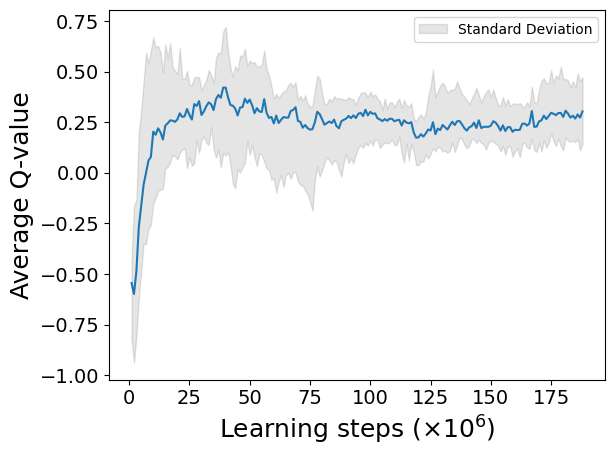

2024-07-29 07:47:04.504670: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6742.0

average moving queuetime :  69.1 141.6
average stay queuetime :  30.4 48.0
average total queuetime :  99.6 189.6
average chargecount :  1.8 1.9
average ordercount :  42.1 42.3
day : 4
so long waited in  7
day start to termianl : 3819.9

 time for simulate one day : 433.1

average moving queuetime :  68.7 19.2
average stay queuetime :  36.5 55.9
average total queuetime :  105.3 75.1
average chargecount :  1.5 0.3
average ordercount :  34.0 1.6
[60, 0, 0, 6, 60, 33, 60, 66, 27, 75, 55, 29]
[76, 33, 11, 57, 45, 58, 61, 36, 44, 58, 58, 26]
[88, 13, 25, 43, 47, 69, 31, 65, 45, 56, 55, 30]
[92, 22, 29, 28, 43, 48, 58, 47, 51, 56, 58, 36]
[94, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.987816056031321
code start to now : 918609.5
episode_reward :  1997.4455053406416
fit_count :  1883484
TD max = 1.0652673078536987 TD min = 0.00010024139881138475
model updated

episode 38
day : 0


2024-07-29 08:09:16.951166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:24:06.629977: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:28:55.555564: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:53:42.834444: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


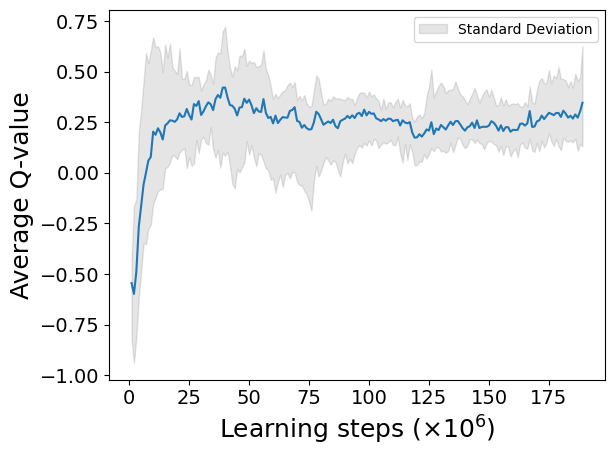

2024-07-29 09:18:07.821111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6501.7

average moving queuetime :  56.5 97.9
average stay queuetime :  10.8 18.6
average total queuetime :  67.2 116.6
average chargecount :  1.7 1.7
average ordercount :  42.0 42.0
day : 1


2024-07-29 09:56:12.199631: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:10:03.567701: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


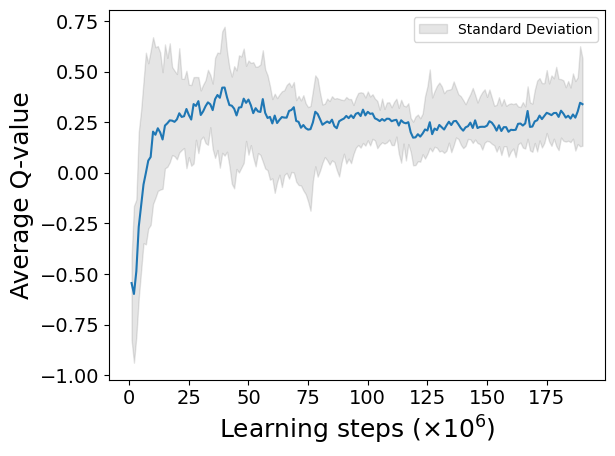

2024-07-29 10:33:54.751335: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:39:45.474531: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:05:24.238719: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:41:15.409401: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


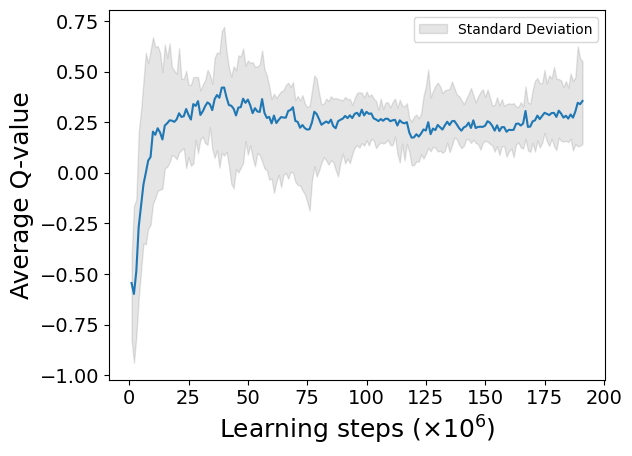


 time for simulate one day : 6839.9

average moving queuetime :  61.0 122.7
average stay queuetime :  7.0 6.8
average total queuetime :  68.0 129.5
average chargecount :  1.8 1.9
average ordercount :  42.0 42.0
day : 2


2024-07-29 11:47:39.691183: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:51:05.871468: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:56:52.911179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:00:01.369887: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:01:53.521196: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:10:16.004947: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:15:31.141218: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:24:24.951417: W tensorflow/core/data/root_dataset.cc:24

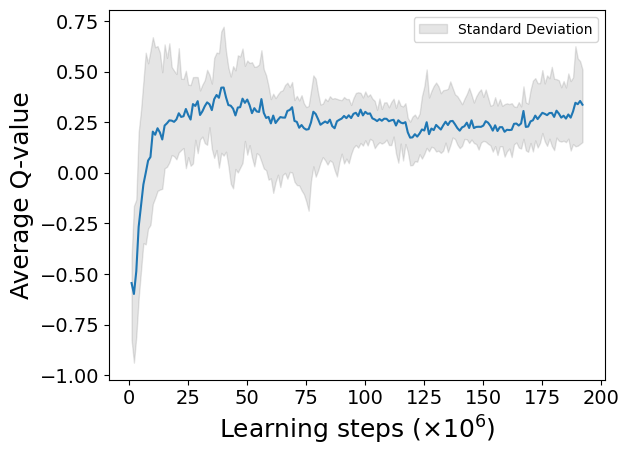

2024-07-29 13:25:25.270593: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6713.0

average moving queuetime :  59.3 111.3
average stay queuetime :  6.1 8.5
average total queuetime :  65.4 119.8
average chargecount :  1.9 2.0
average ordercount :  42.0 42.1
day : 3


2024-07-29 14:18:58.683072: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:20:06.121213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


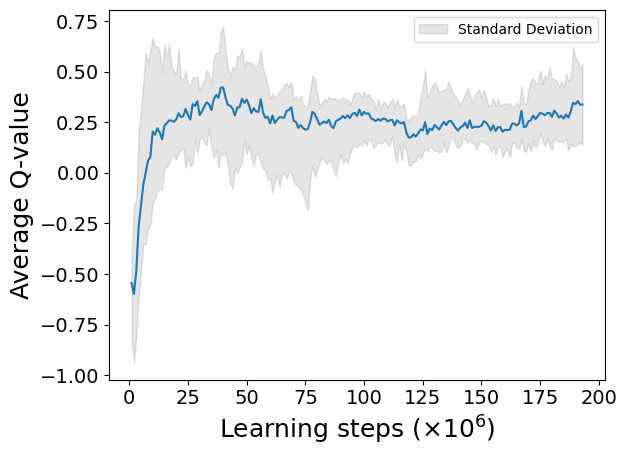

2024-07-29 14:29:54.571589: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:49:25.669815: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:50:45.860838: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:52:02.241147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:58:59.816799: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:02:26.762035: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:26:37.876899: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:29:03.458066: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6689.7

average moving queuetime :  58.6 112.2
average stay queuetime :  5.3 5.9
average total queuetime :  63.9 118.2
average chargecount :  1.9 2.0
average ordercount :  42.0 42.1
day : 4


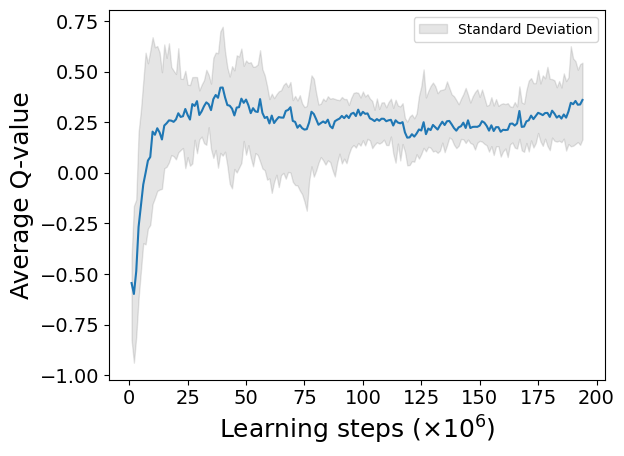

2024-07-29 15:53:25.801140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:18:05.476640: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:36:58.096925: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 17:00:24.871183: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


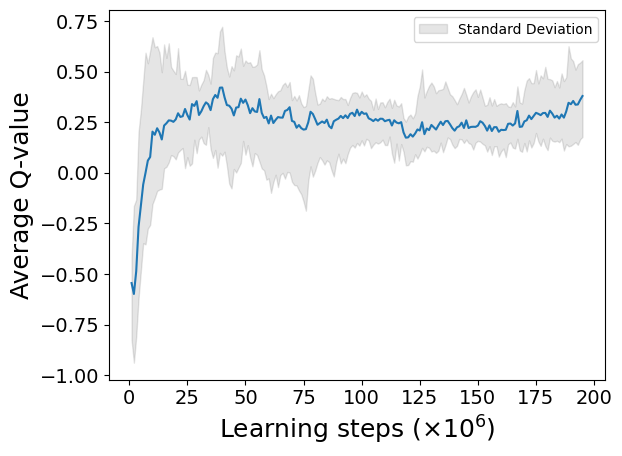


 time for simulate one day : 6734.3

average moving queuetime :  57.6 104.2
average stay queuetime :  4.4 2.1
average total queuetime :  62.0 106.2
average chargecount :  1.9 1.9
average ordercount :  42.1 42.3
[56, 2, 2, 41, 55, 54, 54, 70, 47, 46, 71, 22]
[76, 32, 13, 49, 49, 52, 56, 53, 45, 60, 49, 31]
[82, 33, 21, 60, 35, 56, 71, 42, 50, 65, 37, 42]
[87, 14, 51, 27, 68, 56, 56, 50, 50, 53, 56, 25]
[83, 30, 29, 54, 35, 64, 53, 57, 38, 76, 34, 29]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  7.205658582031253
code start to now : 952113.3
episode_reward :  2262.9681059038526
fit_count :  1952078
TD max = 1.1393761127311575 TD min = 0.0001000226497650635
best model updated
model updated

episode 39
day : 0


2024-07-29 17:37:36.388762: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 17:44:41.050388: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:03:38.851204: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:04:53.196096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:08:30.678864: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:12:18.989112: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


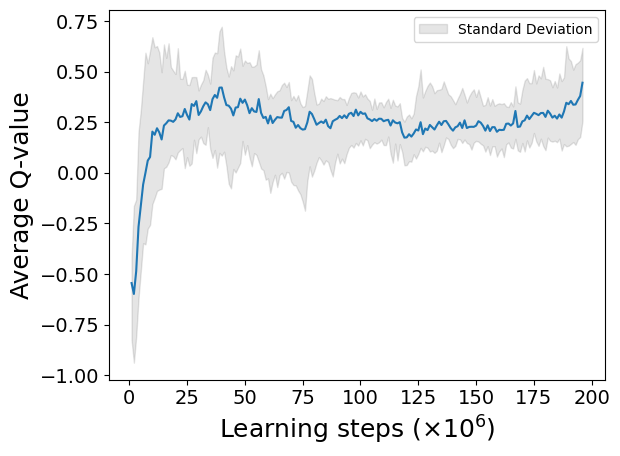

2024-07-29 18:35:07.365056: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:36:12.229027: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:37:21.651180: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:41:01.019889: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6499.0

average moving queuetime :  61.6 100.4
average stay queuetime :  12.6 20.5
average total queuetime :  74.2 120.9
average chargecount :  1.6 1.6
average ordercount :  42.2 42.2
day : 1


2024-07-29 19:21:03.027818: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:24:06.441183: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:39:41.601014: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


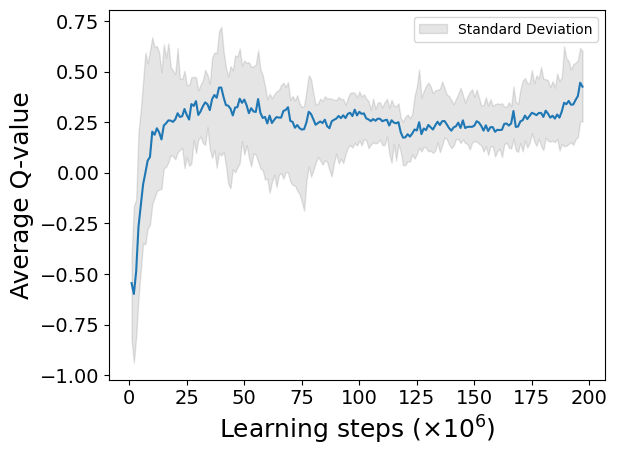

2024-07-29 20:08:42.868474: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 20:46:51.281232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 20:49:52.618284: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6679.2

average moving queuetime :  60.8 111.8
average stay queuetime :  7.4 5.2
average total queuetime :  68.2 117.0
average chargecount :  1.7 1.9
average ordercount :  42.2 42.2
day : 2


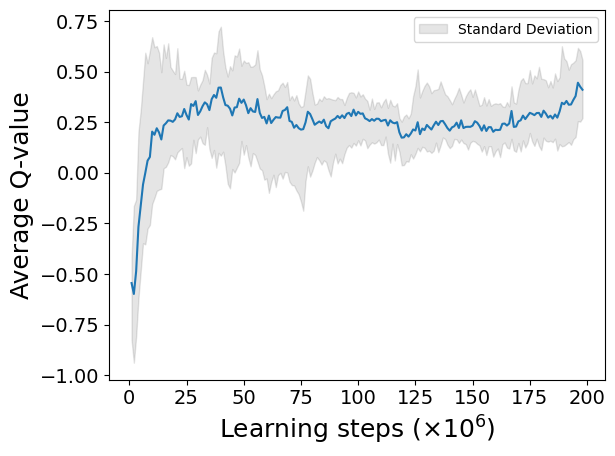

2024-07-29 21:30:25.368661: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:38:40.591113: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:45:49.339289: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 22:00:43.946445: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 22:13:27.198481: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 22:20:18.590330: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 22:22:12.597048: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


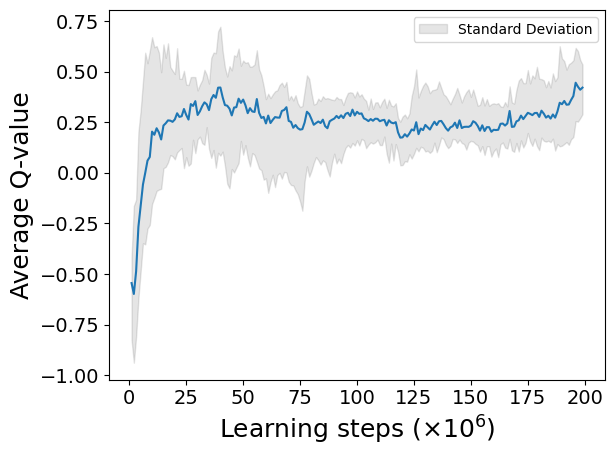


 time for simulate one day : 6742.3

average moving queuetime :  61.8 123.4
average stay queuetime :  5.8 5.7
average total queuetime :  67.6 129.1
average chargecount :  1.8 1.9
average ordercount :  42.2 42.2
day : 3


2024-07-29 23:05:37.150427: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 23:25:55.775374: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


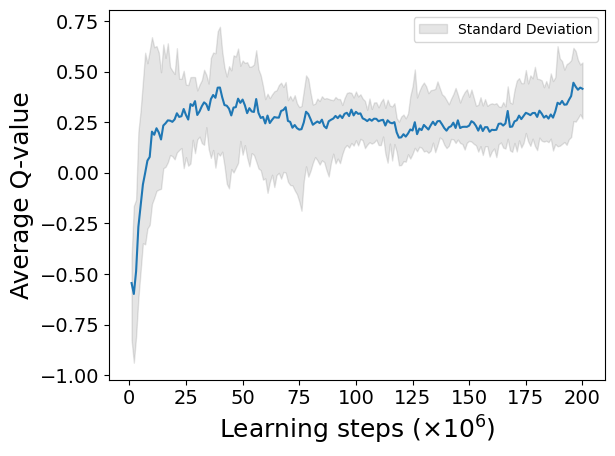

2024-07-30 00:04:18.564792: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:32:06.628612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:43:03.167497: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6751.5

average moving queuetime :  61.5 112.4
average stay queuetime :  6.1 13.0
average total queuetime :  67.5 125.4
average chargecount :  1.8 1.9
average ordercount :  42.2 42.2
day : 4


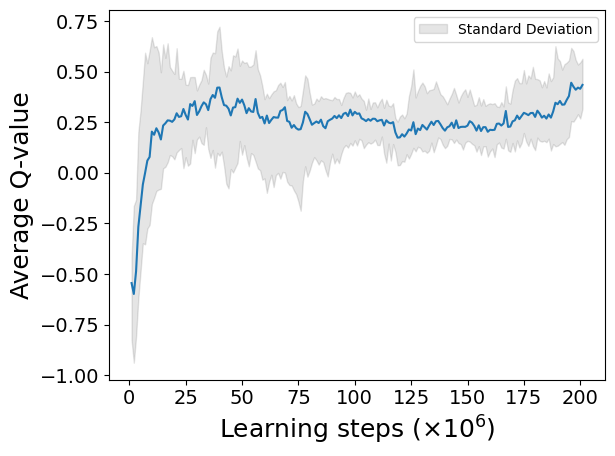

2024-07-30 01:46:42.821101: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 01:46:51.654765: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


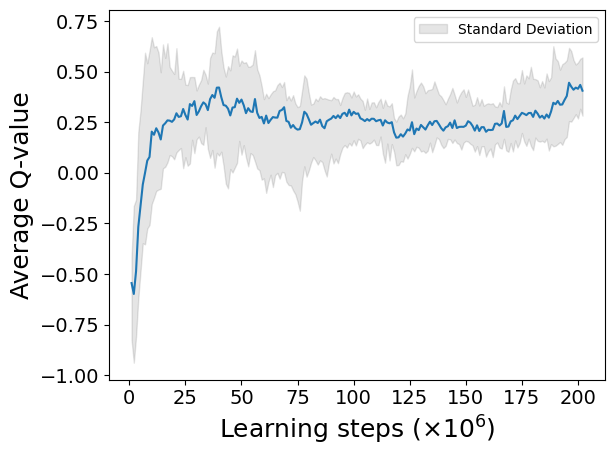


 time for simulate one day : 6722.6

average moving queuetime :  61.6 121.9
average stay queuetime :  7.7 27.1
average total queuetime :  69.3 148.9
average chargecount :  1.8 2.0
average ordercount :  42.2 42.1
day : 5


2024-07-30 02:53:30.451201: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:13:06.181002: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:33:34.041206: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:45:45.451216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:53:44.285675: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


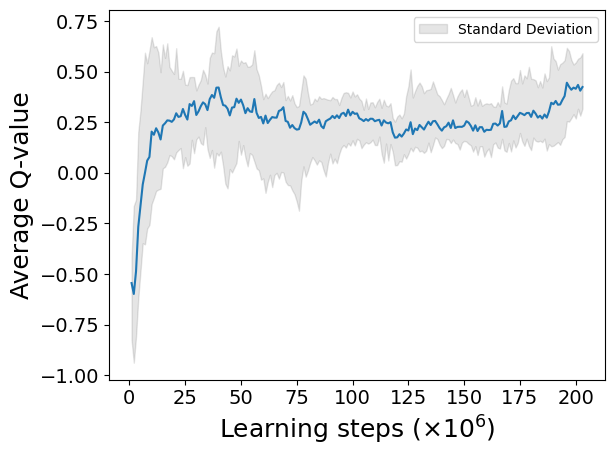

2024-07-30 04:06:23.211136: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 04:15:45.028780: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 04:16:40.051149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6663.7

average moving queuetime :  61.4 111.6
average stay queuetime :  8.9 27.5
average total queuetime :  70.3 139.1
average chargecount :  1.9 1.9
average ordercount :  42.2 42.3
[46, 7, 6, 17, 66, 49, 69, 25, 62, 69, 38, 35]
[77, 25, 43, 47, 51, 49, 48, 47, 51, 66, 37, 17]
[89, 45, 24, 38, 45, 56, 43, 43, 56, 57, 46, 40]
[92, 21, 26, 38, 49, 42, 63, 50, 38, 76, 38, 25]
[79, 27, 30, 64, 26, 51, 47, 59, 54, 54, 45, 52]
[75, 23, 37, 41, 43, 53, 55, 38, 39, 76, 37, 40]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  8.657896948377795
code start to now : 992196.4
episode_reward :  2721.5487355899586
fit_count :  2034541
TD max = 1.1393761127311575 TD min = 0.0001000226497650635
best model updated
model updated

episode 40
day : 0


2024-07-30 04:31:42.557227: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 04:37:58.663329: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 04:55:22.319484: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 04:58:19.669423: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 05:07:53.791148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 05:16:48.844436: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


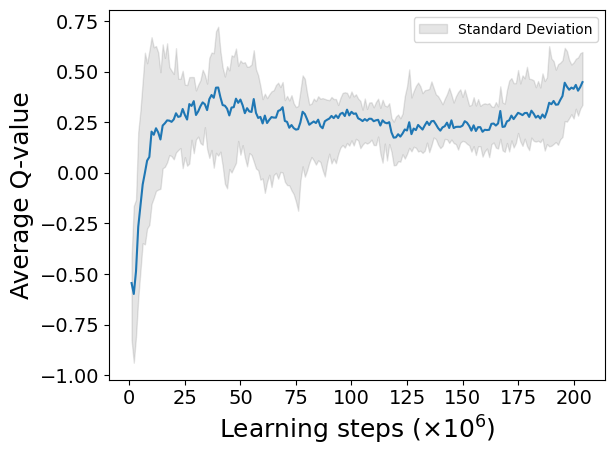

2024-07-30 05:26:42.953506: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 06:02:37.351334: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6521.1

average moving queuetime :  61.6 116.5
average stay queuetime :  7.0 13.2
average total queuetime :  68.6 129.7
average chargecount :  1.9 1.9
average ordercount :  42.0 42.0
day : 1


2024-07-30 06:22:27.051162: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


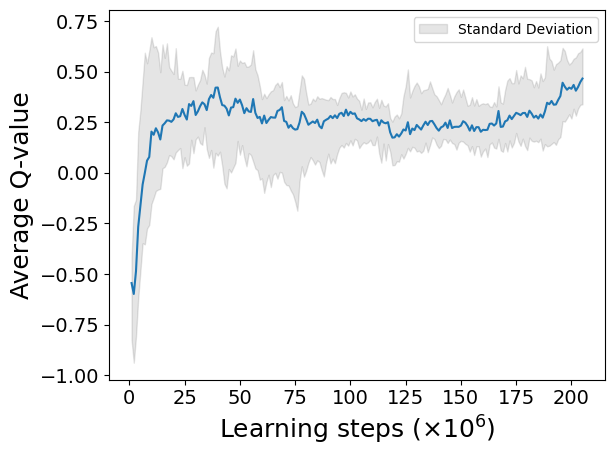

2024-07-30 07:16:34.961152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 07:33:00.560076: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 07:41:30.884725: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


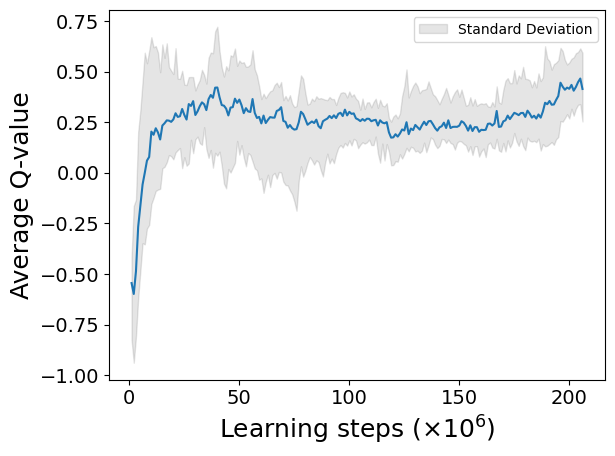

2024-07-30 08:08:56.699739: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:11:35.295229: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6698.8

average moving queuetime :  62.6 117.6
average stay queuetime :  43.7 149.9
average total queuetime :  106.3 267.5
average chargecount :  1.9 1.8
average ordercount :  41.9 41.9
day : 2


2024-07-30 08:20:07.811170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:27:05.420369: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:53:30.948889: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:54:21.978035: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:59:46.731298: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 09:00:09.910801: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


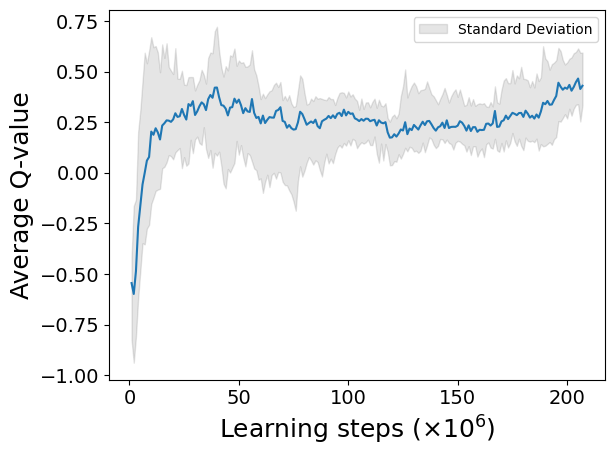


 time for simulate one day : 6665.3

average moving queuetime :  62.6 119.1
average stay queuetime :  34.8 33.3
average total queuetime :  97.5 152.5
average chargecount :  1.9 1.9
average ordercount :  42.0 42.0
day : 3


2024-07-30 10:26:39.632203: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


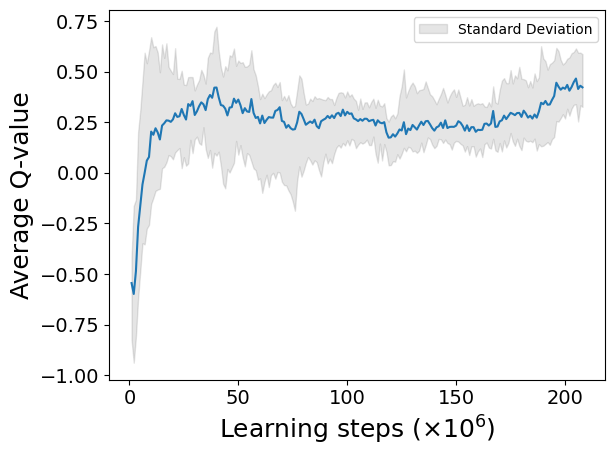

2024-07-30 10:55:45.069816: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:31:28.053153: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:38:46.211635: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:41:48.771173: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:45:48.581211: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6754.2

average moving queuetime :  62.3 124.6
average stay queuetime :  26.6 7.5
average total queuetime :  88.9 132.1
average chargecount :  1.9 2.0
average ordercount :  42.0 42.1
day : 4


2024-07-30 11:58:28.659909: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:00:39.241212: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


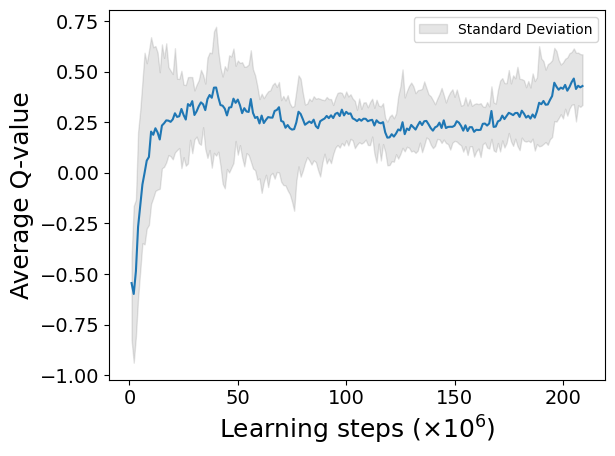

2024-07-30 12:03:57.301258: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:13:05.501180: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:32:27.434168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:37:50.667586: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:48:51.915487: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


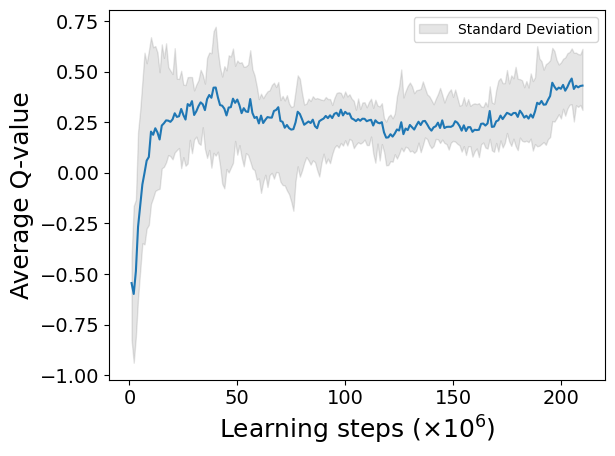


 time for simulate one day : 6803.8

average moving queuetime :  61.7 108.9
average stay queuetime :  23.6 21.2
average total queuetime :  85.3 130.1
average chargecount :  1.9 1.9
average ordercount :  42.1 42.3
day : 5


2024-07-30 13:52:43.206151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:22:59.840779: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:31:22.861266: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:38:02.027600: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


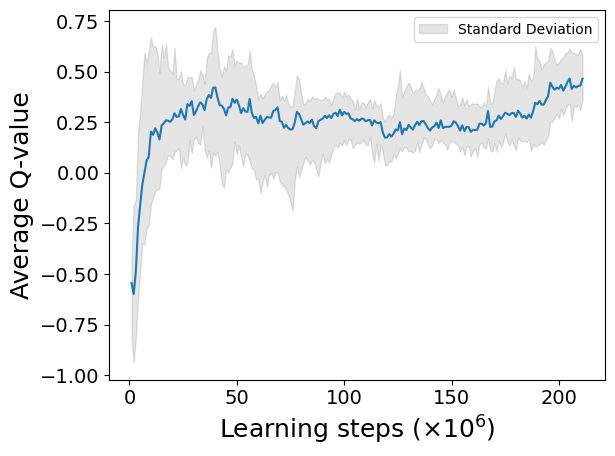

2024-07-30 14:56:48.941192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:59:53.698306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:02:21.087718: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:15:46.879470: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:19:33.711248: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:40:46.257625: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:41:15.888546: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6741.7

average moving queuetime :  61.6 118.8
average stay queuetime :  21.1 16.3
average total queuetime :  82.7 135.0
average chargecount :  1.9 1.9
average ordercount :  42.1 42.2
[86, 25, 39, 28, 44, 40, 62, 49, 44, 66, 39, 45]
[86, 22, 21, 44, 46, 41, 56, 44, 44, 66, 52, 32]
[89, 21, 24, 52, 44, 44, 62, 53, 48, 66, 44, 24]
[88, 28, 41, 39, 49, 37, 67, 59, 51, 50, 62, 37]
[58, 28, 39, 45, 60, 42, 59, 59, 36, 74, 40, 15]
[87, 25, 39, 41, 53, 49, 52, 52, 59, 45, 59, 18]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  8.622429170578659
code start to now : 1032406.3
episode_reward :  2680.768185588729
fit_count :  2116919
TD max = 1.1591583324432373 TD min = 0.0001003725290298462
model updated

episode 41
day : 0


2024-07-30 16:00:06.191294: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 16:01:52.160833: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


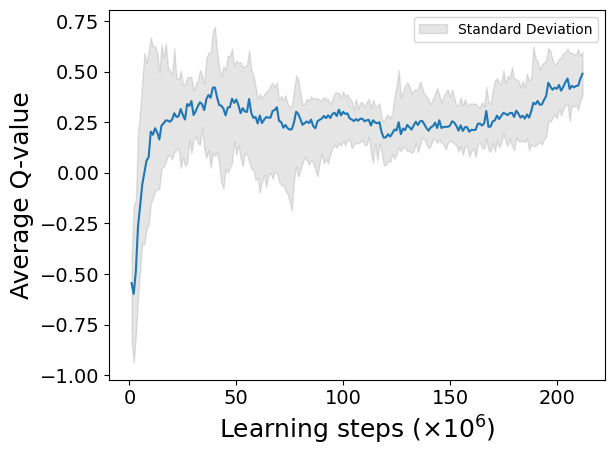

In [ ]:
star = tim.time()
for popul in range(100000):
    
#     fit_count = 0
    start = tim.time()
    print('\nepisode',popul)
    episode_reward = 0

    

    terminal = False
    tmp_terminal = False
    
    end_bike_n()
    bike_df = []
    for i in range(int(bike_n)):
        bike_df.append(pd.DataFrame(columns=['order_count', 'acc_dist', 'charge_count', 'queue_count', 'moving_queue_time', 'stay_queue_time','total_queue_time']))
    min_his_df = []
    soc_df = []
    #[self.key, bike_idx, self.queue[0][1], time - self.queue[0][1]]


    end_bike_n()

    day=0

    while terminal == False:
        sta = tim.time()
        
        print('day :',day)
        
        time = 0
        event_list=[]

        for i in range(len(bike)):
            event_list.append([0, bike[i], 'decide'])
        
        event_list = sorted(event_list)
        while len(event_list)>0:
#             print(len(event_list))

                
            
#             event_list = sorted(event_list)
#             print(event_list[0], event_list[0][1].key)
        

            time = event_list[0][0]
            if len(event_list[0])<4:
                getattr(event_list[0][1],event_list[0][2])()
            elif len(event_list[0])==4:
                getattr(event_list[0][1],event_list[0][2])(event_list[0][3])
            else:
                print('event_list length error')
            if terminal == True:
                break
#             time = event_list[0][0]

        print('\n time for simulate one day : %.1f'%(tim.time()-sta))
            

        end_day()
        tmp_df = copy.deepcopy(bike_df[0])
        for i in range(1,len(bike_df)):
            tmp_df +=bike_df[i]
        tmp_df = tmp_df/len(bike_df)
        tmp_chargecount = np.mean(tmp_df.iloc[:,2])
        tmp_queuetime1 = np.mean(tmp_df.iloc[:,4])
        tmp_queuetime2 = np.mean(tmp_df.iloc[:,5])
        tmp_queuetime3 = np.mean(tmp_df.iloc[:,6])
        tmp_ordercount = np.mean(tmp_df.iloc[:,0])
        print('\naverage moving queuetime : ',round(tmp_queuetime1/tmp_chargecount,1),round(tmp_df.iloc[-1,4],1))
        print('average stay queuetime : ',round(tmp_queuetime2/tmp_chargecount,1),round(tmp_df.iloc[-1,5],1))
        print('average total queuetime : ',round(tmp_queuetime3/tmp_chargecount,1),round(tmp_df.iloc[-1,6],1))
        print('average chargecount : ',round(tmp_chargecount,1),round(tmp_df.iloc[-1,2],1))
        print('average ordercount : ',round(tmp_ordercount,1),round(tmp_df.iloc[-1,0],1))
        del event_list
        if day == int(day_n):
            terminal = True
            tmp_terminal = True
        day += 1
            

    with open(str(int(bike_n))+'bike'+str(int(day_n))+'days.pickle', 'wb') as f:
        pickle.dump(bike_df, f)
    with open(str(int(bike_n))+'min_his'+str(int(day_n))+'days.pickle', 'wb') as f:
        pickle.dump(min_his_df, f)
#     with open(r'C:\Users\ysp\Dropbox\python_code\zentropy\algo5\\'+str(bike_n)+'soc_his'+str(day_n)+'days.pickle', 'wb') as f:
#         pickle.dump(soc_df, f)
    for i in range(len(min_his_df)):
        tmp_data = min_his_df[i]
        count = [0,0,0,0,0,0,0,0,0,0,0,0]
        for j in range(len(tmp_data)):
            for k in range(len(tmp_data[j])):
                if int(tmp_data[j][k][3]//3600) >11:
                    count[-1] +=1
                else:
                    count[int(tmp_data[j][k][3]//3600)] += 1
        print(count)
    print([4,13,12,10,8,7,7,10,16,16,9,4])        
    cycle_sum = []
    for i in range(len(battery)):
        cycle_sum.append(battery[i].cycle)
    print('cycle : ',np.mean(cycle_sum))
    stop = tim.time()  
    print('code start to now : %.1f'%(stop - star))
    print('episode_reward : ', episode_reward)
    print('fit_count : ',fit_count)
    print('TD max =', np.max(TD_error_list), 'TD min =', np.min(TD_error_list))
    exploration_rate = 0.1-fit_count/10000000
    TD_max = np.max(TD_error_list[:int(9*len(TD_error_list)/10)])
    max_w_i = (len(D_memory)*TD_max/np.sum(TD_error_list))**(-beta)
    
    if episode_reward > best_episode_reward:
        best_episode_reward = episode_reward
#         model.save('best_model(230).h5')
        model.save_weights("DCCDQN4EM_G(300)(w).h5")
        print('best model updated')
        if episode_reward > 300:
            day_n+=0.25
#             bike_n+=0.5
    if day_n >30:
        day_n = 30
#     if bike_n >230:
#         bike_n=230
        
    
#     fit_count += 1
#         model2 = load_model('best_model.h5')
#         model2.compile(optimizer='rmsprop',loss=['mse'])
    if fit_count > 1000000:
        print('model updated')
        model2.set_weights(model.get_weights())

#     with open('D_often.pickle', 'wb') as f:
#         pickle.dump(D_often, f)
#     with open('D_sparse.pickle', 'wb') as f:
#         pickle.dump(D_sparse, f)
    

In [ ]:
len(D_memory)

In [ ]:
for i in range(len(D_memory)):
    print(D_memory[i][1])

In [ ]:
event_list

In [ ]:
bike

In [ ]:
event_list

In [ ]:
TD_max/np.sum(TD_error_list)

In [ ]:
len(TD_index)

In [ ]:
len(TD_error_list)

In [ ]:
for i in range(len(TD_error_list)):
    print(TD_error_list[i])

In [ ]:
len(TD_error_list)

In [ ]:
random.sample([1,2,3,4], counts=[30,10,1,1], k=3)

In [ ]:
for i in range(10):
    TD_index = np.arange(0,len(TD_error_list))
    choice = random.choices(TD_index, weights = TD_error_list)[0]
    print(choice)
    train = D_memory[choice]

    tmp=[]
    tmp.append(np.array([train[0][0:34]]))
    tmp.append(np.array([train[0][34:154]]))
    tmp.append(np.array([train[0][154:184]]))
    mask = masking(train[0])
    tmp.append(np.array([mask]))
    predicted1 = model.predict_on_batch(tmp).copy()
    print('battery: ',train[0][2],'action: ',train[1],'reward: ', train[2])
    print(predicted1)
    print(train[0][34:64])

In [ ]:
TD_index = np.arange(0,len(TD_error_list))
choice = random.choices(TD_index, weights = TD_error_list)[0]
print(choice)
train = D_memory[choice]

tmp=[]
tmp.append(np.array([train[3][0:64]]))
tmp.append(np.array([train[3][64:154]]))
tmp.append(np.array([train[3][154:184]]))

In [ ]:
train[3][2]

In [ ]:
train[3][35]

In [ ]:
mask = np.ones(31)
if train[3][2] < 0.05:
    mask[30] = 0
for i in range(30):
    if train[3][34+i] > 1:
        mask[i] = 0

In [ ]:
mask

In [ ]:
tmp

In [ ]:
len(TD_error_list)

In [ ]:
len(TD_index)

In [ ]:
model = load_model('current_model.h5')
model.compile(optimizer = 'rmsprop', loss='mse', metrics=['mae','mse'])

## 이어하기

In [ ]:
model = load_model('current_model.h5')
model.compile(optimizer='rmsprop',loss=['mse','mse'])

In [ ]:


star = tim.time()
for popul in range(100000):
    start = tim.time()
    print('\nepisode',popul)

    

    terminal = False
    
    end_bike_n()
    bike_df = []
    for i in range(bike_n):
        bike_df.append(pd.DataFrame(columns=['order_count', 'acc_dist', 'charge_count', 'queue_count', 'queue_time'], index = np.arange(0,day_n)).fillna(0))
    min_his_df = []
    soc_df = []
    #[self.key, bike_idx, self.queue[0][1], time - self.queue[0][1]]


    end_bike_n()

    day=0
    while terminal == False:
        sta = tim.time()
        
        print('day :',day)
        day += 1
        time = 0
        event_list=[]

        for i in range(len(bike)):
            event_list.append([0, bike[i], 'decide'])
        model.save('current_model.h5')
 
        model2 = model
        while time<43200:
            event_list = sorted(event_list)
        

            time = event_list[0][0]
            if len(event_list[0])<4:
                getattr(event_list[0][1],event_list[0][2])()
            elif len(event_list[0])==4:
                getattr(event_list[0][1],event_list[0][2])(event_list[0][3])
            else:
                print('event_list length error')
            if terminal == True:
                break
        print('\n time for simulate one day : ',tim.time()-sta)
            

        end_day()
        del event_list
        if day == day_n:
            terminal = True
            
    tmp_df = bike_df[0]
    for i in range(1,len(bike_df)):
        tmp_df +=bike_df[i]
    tmp_df = tmp_df/len(bike_df)
    tmp_chargecount = np.mean(tmp_df.iloc[:,2])
    tmp_queuetime = np.mean(tmp_df.iloc[:,4])
    print('average queuetime : ',tmp_queuetime)
    print('average chargecount : ',tmp_chargecount)

    with open(str(bike_n)+'bike'+str(day_n)+'days.pickle', 'wb') as f:
        pickle.dump(bike_df, f)
    with open(str(bike_n)+'min_his'+str(day_n)+'days.pickle', 'wb') as f:
        pickle.dump(min_his_df, f)
#     with open(r'C:\Users\ysp\Dropbox\python_code\zentropy\algo5\\'+str(bike_n)+'soc_his'+str(day_n)+'days.pickle', 'wb') as f:
#         pickle.dump(soc_df, f)
        
    cycle_sum = []
    for i in range(len(battery)):
        cycle_sum.append(battery[i].cycle)
    print('cycle : ',np.mean(cycle_sum))
    stop = tim.time()  
    print('code start to terminal : %.1f'%(stop - star))





In [ ]:
from keras.models import load_model

In [ ]:
model.summary()